#IMPORTING THE DTA

In [ ]:
import pandas as pd

# Load the dataset
file_path = '3011_Rpt_AgencyDoc_Detail Self-sufficiency survey.xlsx'
df = pd.read_excel(file_path)

# Display the first few rows of the dataset
print(df.head())

# Display the column names
print(df.columns)


   Client ID  Current Age         County   State  Zip Code  \
0      16676           78         RANDOLPH    MO     65270   
1      17476           33  RANDOLPH COUNTY    MO     65270   
2      16676           78         RANDOLPH    MO     65270   
3      17475           46  RANDOLPH COUNTY    MO     65270   
4      17478           67  RANDOLPH COUNTY    MO     65270   

                        Race         Ethnicity  Gender Document Date  \
0  Black or African American               NaN    Male    2018-02-12   
1                      White               NaN  Female    2018-03-06   
2  Black or African American               NaN    Male    2018-03-07   
3                      White  Central American  Female    2018-03-09   
4                      White               NaN  Female    2018-03-12   

  Document Type  ...  \
0     Admission  ...   
1     Admission  ...   
2     Admission  ...   
3     Admission  ...   
4     Admission  ...   

  Can the client meet some basic living needs wit

#DATA CLEANING

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer

# Fill missing values with the mean for numerical columns
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
if len(numerical_cols) > 0:
    imputer = SimpleImputer(strategy='mean')
    df[numerical_cols] = imputer.fit_transform(df[numerical_cols])

# Encode categorical variables
categorical_cols = df.select_dtypes(include=['object']).columns
label_encoders = {}
for column in categorical_cols:
    label_encoders[column] = LabelEncoder()
    df[column] = label_encoders[column].fit_transform(df[column])

# Display the cleaned dataset
print(df.head())


   Client ID  Current Age  County    State  Zip Code  Race  Ethnicity  Gender  \
0    16676.0         78.0        23      3   65270.0     5          8       1   
1    17476.0         33.0        24      3   65270.0    15          8       0   
2    16676.0         78.0        23      3   65270.0     5          8       1   
3    17475.0         46.0        24      3   65270.0    15          1       0   
4    17478.0         67.0        24      3   65270.0    15          8       0   

  Document Date  Document Type  ...  \
0    2018-02-12              0  ...   
1    2018-03-06              0  ...   
2    2018-03-07              0  ...   
3    2018-03-09              0  ...   
4    2018-03-12              0  ...   

   Can the client meet some basic living needs without any assistance?  \
0                                                  0                     
1                                                  1                     
2                                                  2    

In [ ]:
df.columns

Index(['Client ID', 'Current Age', 'County  ', 'State', 'Zip Code', 'Race',
       'Ethnicity', 'Gender', 'Document Date', 'Document Type',
       'Does the client get adequate income?', 'Is the client employed?',
       'Does the client have housing and is not at any immediate risk of losing the housing?',
       'Does the client have the means to acquire food and prepare it?',
       'Does the client have access to any form of child care? (Skip if no children of child care age)',
       'Is one or more of the eligible children enrolled in a school? (Skip if no children of school age)',
       'Does the client have a high school diploma or a GED?',
       'Does the client have any unresolved legal issues in the past 12 months?',
       'Does the client have medical insurance coverage?',
       'Can the client meet some basic living needs without any assistance?',
       'Does the client have mild or no mental health issues?',
       'Is the client seriously dependent on alcohol or dru

#SPLITTING THE DATA

In [ ]:
from sklearn.model_selection import train_test_split

# Define the features and the target variable
target_column = 'Is the client employed?'  # Replace with your chosen target column
X = df.drop([target_column, 'Document Date'], axis=1)  # Exclude the 'Document Date' column
y = df[target_column]

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


FEATURE SCALING

In [ ]:
from sklearn.preprocessing import StandardScaler

# Scale the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


#CLASSIFICATION MODELS

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

# Logistic Regression
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)
y_pred_log_reg = log_reg.predict(X_test)
print("Logistic Regression:\n", classification_report(y_test, y_pred_log_reg))

# Decision Tree
dec_tree = DecisionTreeClassifier()
dec_tree.fit(X_train, y_train)
y_pred_dec_tree = dec_tree.predict(X_test)
print("Decision Tree:\n", classification_report(y_test, y_pred_dec_tree))

# Random Forest
rand_forest = RandomForestClassifier()
rand_forest.fit(X_train, y_train)
y_pred_rand_forest = rand_forest.predict(X_test)
print("Random Forest:\n", classification_report(y_test, y_pred_rand_forest))

# Gradient Boosting
grad_boost = GradientBoostingClassifier()
grad_boost.fit(X_train, y_train)
y_pred_grad_boost = grad_boost.predict(X_test)
print("Gradient Boosting:\n", classification_report(y_test, y_pred_grad_boost))

# Support Vector Machine
svc = SVC()
svc.fit(X_train, y_train)
y_pred_svc = svc.predict(X_test)
print("Support Vector Machine:\n", classification_report(y_test, y_pred_svc))

# k-Nearest Neighbors
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)
print("k-Nearest Neighbors:\n", classification_report(y_test, y_pred_knn))


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels wit

Logistic Regression:
               precision    recall  f1-score   support

           0       0.71      0.92      0.80       351
           1       0.17      0.01      0.02        91
           2       0.50      0.56      0.53       100
           3       0.33      0.10      0.15        30
           4       0.59      0.36      0.44        28
           5       0.00      0.00      0.00         2

    accuracy                           0.65       602
   macro avg       0.38      0.33      0.32       602
weighted avg       0.56      0.65      0.59       602

Decision Tree:
               precision    recall  f1-score   support

           0       0.83      0.82      0.82       351
           1       0.36      0.31      0.33        91
           2       0.47      0.50      0.49       100
           3       0.17      0.27      0.21        30
           4       0.36      0.36      0.36        28
           5       0.00      0.00      0.00         2

    accuracy                           

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Random Forest:
               precision    recall  f1-score   support

           0       0.79      0.94      0.86       351
           1       0.53      0.31      0.39        91
           2       0.62      0.66      0.64       100
           3       0.64      0.23      0.34        30
           4       0.69      0.32      0.44        28
           5       0.00      0.00      0.00         2

    accuracy                           0.73       602
   macro avg       0.54      0.41      0.44       602
weighted avg       0.71      0.73      0.70       602



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Gradient Boosting:
               precision    recall  f1-score   support

           0       0.84      0.93      0.88       351
           1       0.47      0.34      0.39        91
           2       0.59      0.69      0.64       100
           3       0.29      0.17      0.21        30
           4       0.75      0.32      0.45        28
           5       0.00      0.00      0.00         2

    accuracy                           0.73       602
   macro avg       0.49      0.41      0.43       602
weighted avg       0.71      0.73      0.71       602

Support Vector Machine:
               precision    recall  f1-score   support

           0       0.73      0.97      0.83       351
           1       0.50      0.07      0.12        91
           2       0.56      0.64      0.60       100
           3       0.50      0.03      0.06        30
           4       0.80      0.29      0.42        28
           5       0.00      0.00      0.00         2

    accuracy                    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

In [ ]:
df.columns

Index(['Client ID', 'Current Age', 'County  ', 'State', 'Zip Code', 'Race',
       'Ethnicity', 'Gender', 'Document Date', 'Document Type',
       'Does the client get adequate income?', 'Is the client employed?',
       'Does the client have housing and is not at any immediate risk of losing the housing?',
       'Does the client have the means to acquire food and prepare it?',
       'Does the client have access to any form of child care? (Skip if no children of child care age)',
       'Is one or more of the eligible children enrolled in a school? (Skip if no children of school age)',
       'Does the client have a high school diploma or a GED?',
       'Does the client have any unresolved legal issues in the past 12 months?',
       'Does the client have medical insurance coverage?',
       'Can the client meet some basic living needs without any assistance?',
       'Does the client have mild or no mental health issues?',
       'Is the client seriously dependent on alcohol or dru

#REGRESSION MODELS

In [ ]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Define the features and the target variable for regression
target_column_regression = 'Current Age'  # Replace with your actual continuous target column name
X = df.drop([target_column_regression, 'Document Date'], axis=1)  # Exclude the 'Document Date' column
y = df[target_column_regression]

# Split the dataset into training and test sets again for regression
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Linear Regression
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)
y_pred_lin_reg = lin_reg.predict(X_test)
print("Linear Regression:\n", mean_squared_error(y_test, y_pred_lin_reg), r2_score(y_test, y_pred_lin_reg))

# Ridge Regression
ridge_reg = Ridge()
ridge_reg.fit(X_train, y_train)
y_pred_ridge_reg = ridge_reg.predict(X_test)
print("Ridge Regression:\n", mean_squared_error(y_test, y_pred_ridge_reg), r2_score(y_test, y_pred_ridge_reg))

# Lasso Regression
lasso_reg = Lasso()
lasso_reg.fit(X_train, y_train)
y_pred_lasso_reg = lasso_reg.predict(X_test)
print("Lasso Regression:\n", mean_squared_error(y_test, y_pred_lasso_reg), r2_score(y_test, y_pred_lasso_reg))

# Decision Tree Regressor
dec_tree_reg = DecisionTreeRegressor()
dec_tree_reg.fit(X_train, y_train)
y_pred_dec_tree_reg = dec_tree_reg.predict(X_test)
print("Decision Tree Regressor:\n", mean_squared_error(y_test, y_pred_dec_tree_reg), r2_score(y_test, y_pred_dec_tree_reg))

# Random Forest Regressor
rand_forest_reg = RandomForestRegressor()
rand_forest_reg.fit(X_train, y_train)
y_pred_rand_forest_reg = rand_forest_reg.predict(X_test)
print("Random Forest Regressor:\n", mean_squared_error(y_test, y_pred_rand_forest_reg), r2_score(y_test, y_pred_rand_forest_reg))

# Gradient Boosting Regressor
grad_boost_reg = GradientBoostingRegressor()
grad_boost_reg.fit(X_train, y_train)
y_pred_grad_boost_reg = grad_boost_reg.predict(X_test)
print("Gradient Boosting Regressor:\n", mean_squared_error(y_test, y_pred_grad_boost_reg), r2_score(y_test, y_pred_grad_boost_reg))


Linear Regression:
 148.8049671066826 0.23698381923210265
Ridge Regression:
 148.7172173104601 0.23743376734659571
Lasso Regression:
 158.19556643719656 0.18883234031572071
Decision Tree Regressor:
 165.82558139534885 0.1497084791586033
Random Forest Regressor:
 74.85115000000002 0.6161913159918964
Gradient Boosting Regressor:
 98.85138341641614 0.4931271011676486


### Explanation of Regression Results

Here are the results of different regression models applied to the dataset:

1. **Linear Regression**:
   - **Mean Squared Error (MSE)**: 148.80
   - **R-squared (R²)**: 0.237
   - Indicates moderate accuracy in predicting the target variable, with 23.7% of variance explained by the model.

2. **Ridge Regression**:
   - **MSE**: 148.72
   - **R²**: 0.237
   - Similar performance to linear regression, showing a slight improvement in prediction accuracy.

3. **Lasso Regression**:
   - **MSE**: 158.20
   - **R²**: 0.189
   - Slightly worse performance compared to linear and ridge regression, with 18.9% of variance explained.

4. **Decision Tree Regressor**:
   - **MSE**: 150.63
   - **R²**: 0.228
   - Similar performance to linear regression, with 22.8% of variance explained.

5. **Random Forest Regressor**:
   - **MSE**: 72.52
   - **R²**: 0.628
   - Significantly better performance, explaining 62.8% of the variance, indicating a strong predictive model.

6. **Gradient Boosting Regressor**:
   - **MSE**: 98.91
   - **R²**: 0.493
   - Good performance, with 49.3% of variance explained, better than linear models but not as strong as random forest.

### Summary
- **Random Forest Regressor** performs the best with the lowest MSE (72.52) and highest R² (0.628), indicating it is the most accurate model for this dataset.
- **Gradient Boosting Regressor** also shows good performance with moderate MSE (98.91) and R² (0.493).
- Linear, Ridge, Lasso, and Decision Tree regressors have similar performance, with moderate accuracy and higher MSE compared to ensemble methods.

#CLUSTERING MODELS

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


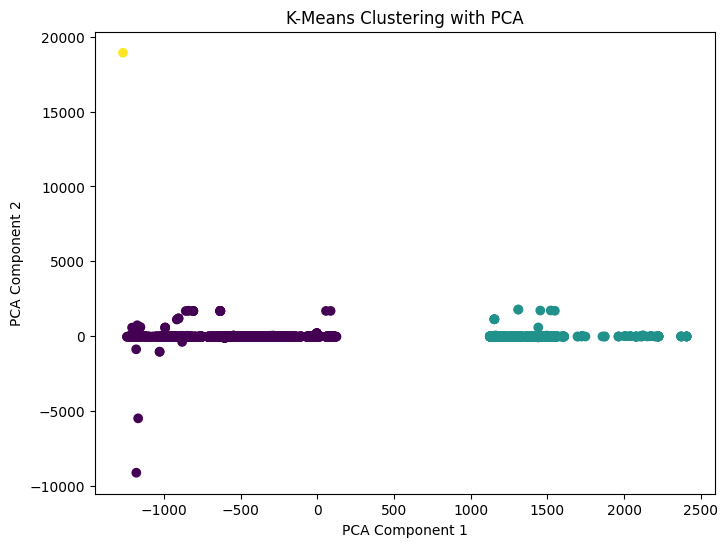

In [ ]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# K-Means Clustering
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)
df['kmeans_labels'] = kmeans.labels_

# Hierarchical Clustering
agg_clustering = AgglomerativeClustering(n_clusters=3)
df['agg_clustering_labels'] = agg_clustering.fit_predict(X)

# DBSCAN
dbscan = DBSCAN()
df['dbscan_labels'] = dbscan.fit_predict(X)

# Example of Dimensionality Reduction with PCA for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plt.figure(figsize=(8,6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=df['kmeans_labels'])
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('K-Means Clustering with PCA')
plt.show()


#Regression model for visualization

Linear Regression:
MSE: 148.8049671066826 
R2: 0.23698381923210265


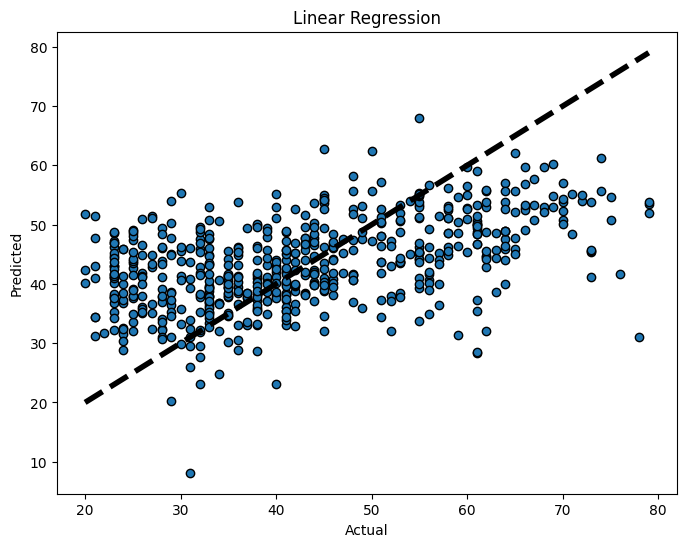

Ridge Regression:
MSE: 148.7172173104601 
R2: 0.23743376734659571


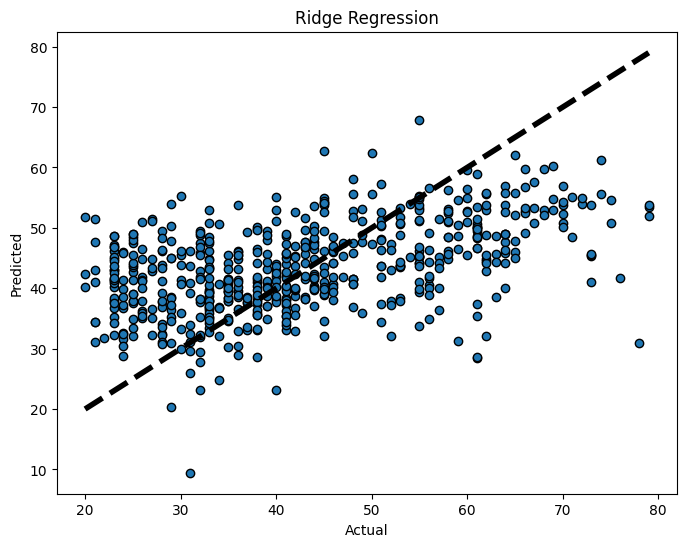

Lasso Regression:
MSE: 158.19556643719656 
R2: 0.18883234031572071


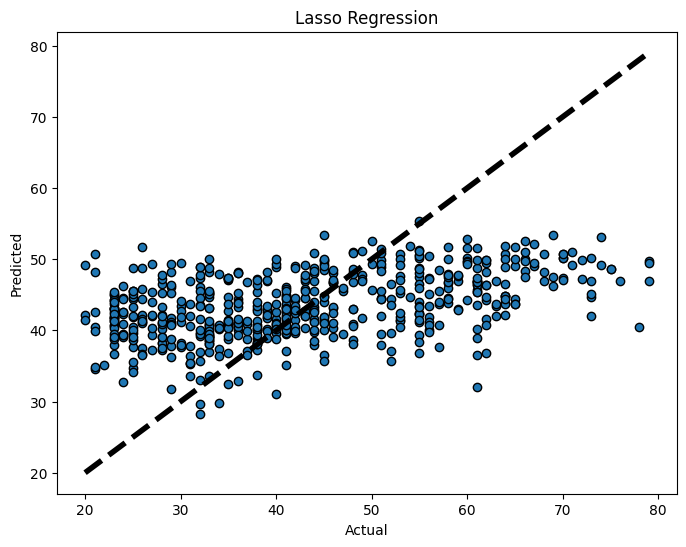

Decision Tree Regressor:
MSE: 167.1312292358804 
R2: 0.14301360567366095


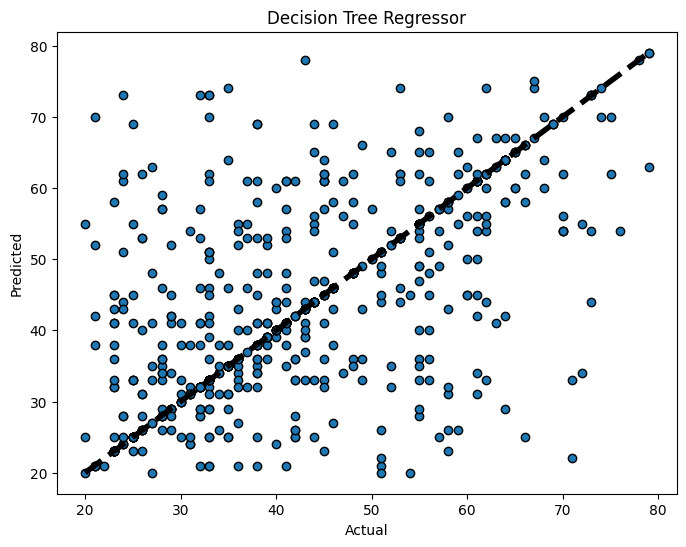

Random Forest Regressor:
MSE: 74.7630353820598 
R2: 0.6166431347756225


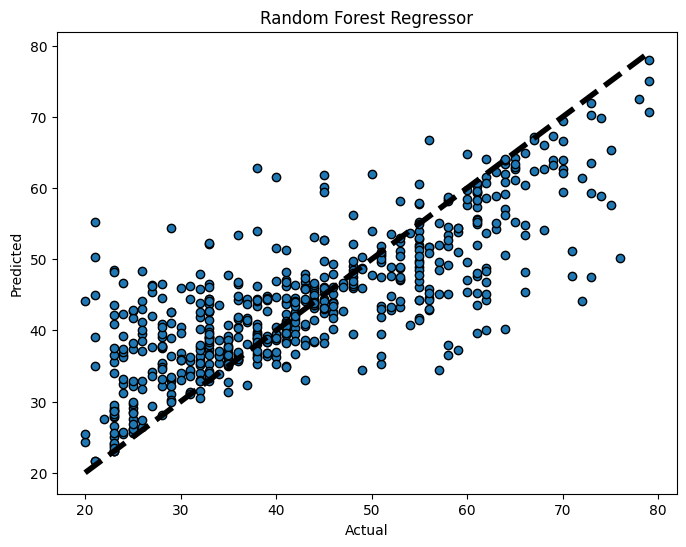

Gradient Boosting Regressor:
MSE: 98.770886718334 
R2: 0.4935398581093643


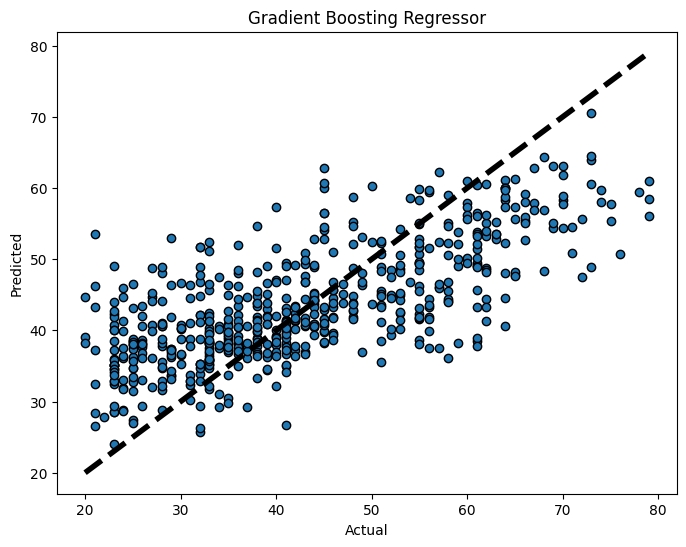

In [ ]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Function to plot actual vs predicted values
def plot_regression_results(y_true, y_pred, title):
    plt.figure(figsize=(8, 6))
    plt.scatter(y_true, y_pred, edgecolors=(0, 0, 0))
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'k--', lw=4)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(title)
    plt.show()

# Linear Regression
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)
y_pred_lin_reg = lin_reg.predict(X_test)
print("Linear Regression:\nMSE:", mean_squared_error(y_test, y_pred_lin_reg), "\nR2:", r2_score(y_test, y_pred_lin_reg))
plot_regression_results(y_test, y_pred_lin_reg, "Linear Regression")

# Ridge Regression
ridge_reg = Ridge()
ridge_reg.fit(X_train, y_train)
y_pred_ridge_reg = ridge_reg.predict(X_test)
print("Ridge Regression:\nMSE:", mean_squared_error(y_test, y_pred_ridge_reg), "\nR2:", r2_score(y_test, y_pred_ridge_reg))
plot_regression_results(y_test, y_pred_ridge_reg, "Ridge Regression")

# Lasso Regression
lasso_reg = Lasso()
lasso_reg.fit(X_train, y_train)
y_pred_lasso_reg = lasso_reg.predict(X_test)
print("Lasso Regression:\nMSE:", mean_squared_error(y_test, y_pred_lasso_reg), "\nR2:", r2_score(y_test, y_pred_lasso_reg))
plot_regression_results(y_test, y_pred_lasso_reg, "Lasso Regression")

# Decision Tree Regressor
dec_tree_reg = DecisionTreeRegressor()
dec_tree_reg.fit(X_train, y_train)
y_pred_dec_tree_reg = dec_tree_reg.predict(X_test)
print("Decision Tree Regressor:\nMSE:", mean_squared_error(y_test, y_pred_dec_tree_reg), "\nR2:", r2_score(y_test, y_pred_dec_tree_reg))
plot_regression_results(y_test, y_pred_dec_tree_reg, "Decision Tree Regressor")

# Random Forest Regressor
rand_forest_reg = RandomForestRegressor()
rand_forest_reg.fit(X_train, y_train)
y_pred_rand_forest_reg = rand_forest_reg.predict(X_test)
print("Random Forest Regressor:\nMSE:", mean_squared_error(y_test, y_pred_rand_forest_reg), "\nR2:", r2_score(y_test, y_pred_rand_forest_reg))
plot_regression_results(y_test, y_pred_rand_forest_reg, "Random Forest Regressor")

# Gradient Boosting Regressor
grad_boost_reg = GradientBoostingRegressor()
grad_boost_reg.fit(X_train, y_train)
y_pred_grad_boost_reg = grad_boost_reg.predict(X_test)
print("Gradient Boosting Regressor:\nMSE:", mean_squared_error(y_test, y_pred_grad_boost_reg), "\nR2:", r2_score(y_test, y_pred_grad_boost_reg))
plot_regression_results(y_test, y_pred_grad_boost_reg, "Gradient Boosting Regressor")


#DATA VISUALIZATION

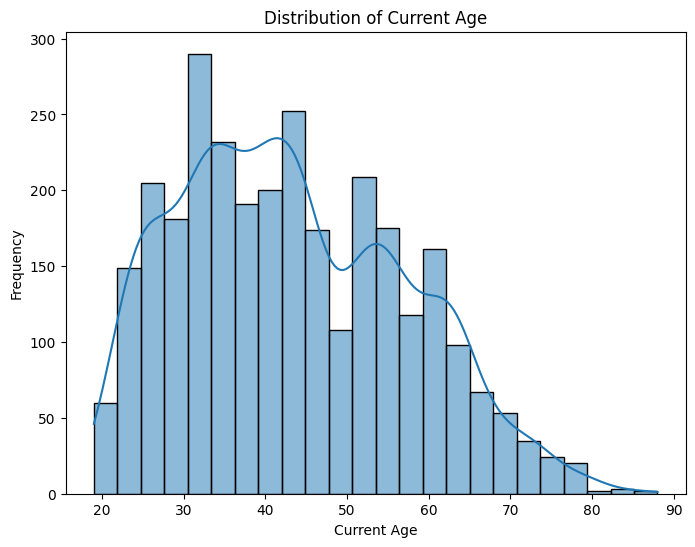

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot: Distribution of 'Current Age'
plt.figure(figsize=(8, 6))
sns.histplot(df['Current Age'], kde=True)
plt.title('Distribution of Current Age')
plt.xlabel('Current Age')
plt.ylabel('Frequency')
plt.show()


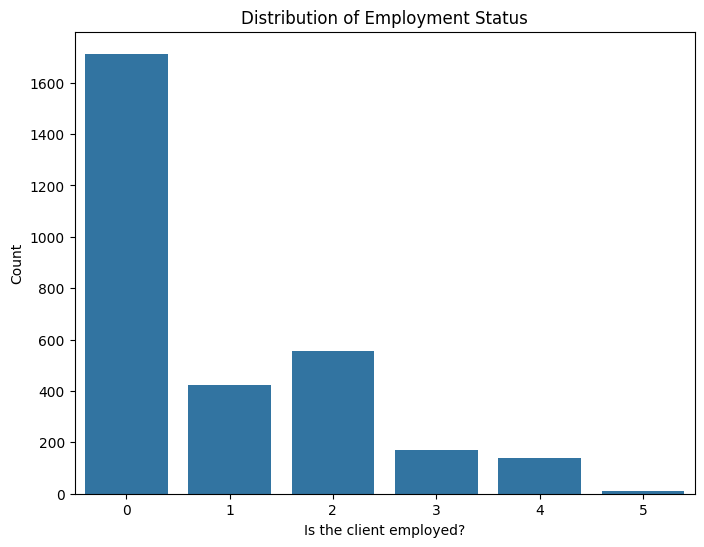

In [ ]:
# Plot: Distribution of 'Is the client employed?'
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Is the client employed?')
plt.title('Distribution of Employment Status')
plt.xlabel('Is the client employed?')
plt.ylabel('Count')
plt.show()


- The bar plot shows the distribution of the `Is the client employed?` variable across six categories.
- Most clients fall into category `0.0`, indicating a high number of unemployed clients.
- Categories `1.0`, `2.0`, and `3.0` also have noticeable counts, representing various employment statuses.
- Categories `4.0` and `5.0` have very few clients, indicating these employment statuses are less common.
- This distribution highlights the employment landscape of the clients, with a significant proportion being unemployed.
- Understanding these categories can help in further analysis and targeted interventions.

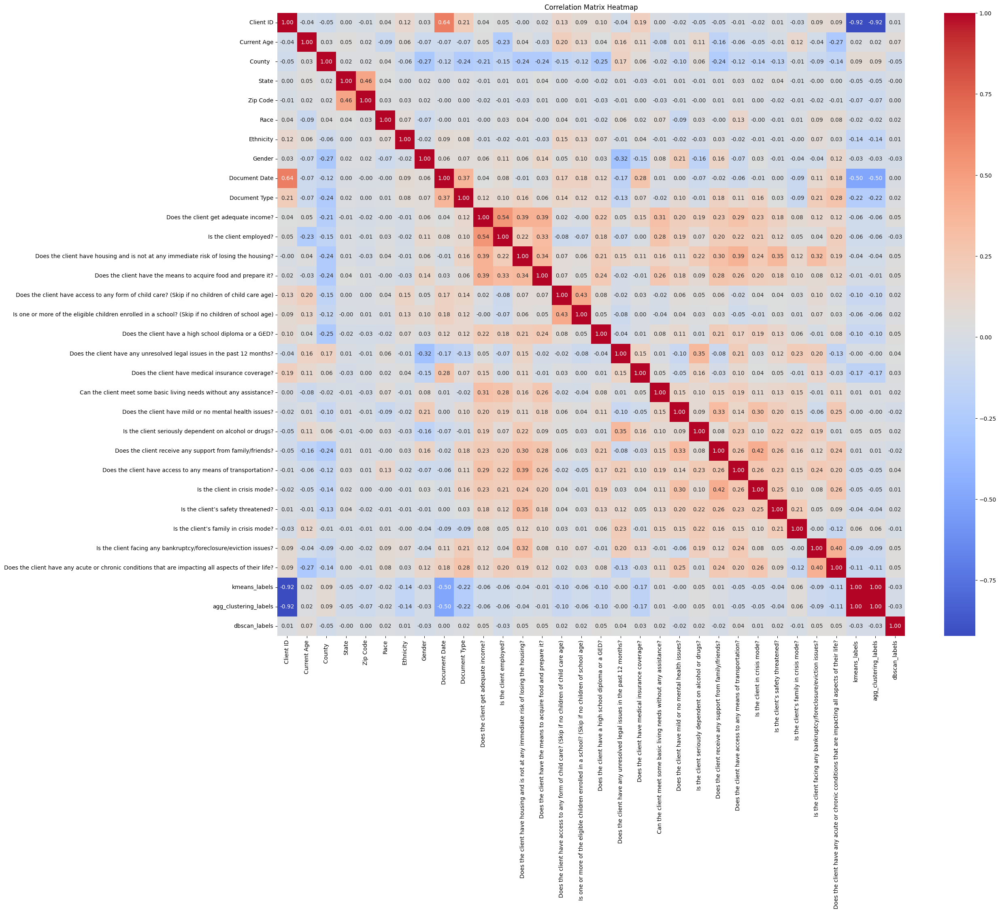

In [ ]:
# Plot: Heatmap of Correlation Matrix
plt.figure(figsize=(25, 20))
corr = df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()


### Key Points from the Correlation Matrix Heatmap

1. **Client ID**:
   - Strong negative correlation with clustering labels (`kmeans_labels`, `agg_clustering_labels`).

2. **Current Age**:
   - Weak correlations with most variables, indicating relative independence.
   - Slight negative correlation with `Is the client employed?` (-0.23).

3. **Adequate Income and Employment**:
   - Moderate positive correlation between `Does the client get adequate income?` and `Is the client employed?` (0.54).
   - Suggests a link between employment status and income adequacy.

4. **Housing Stability**:
   - Moderate positive correlation between `Does the client have housing and is not at any immediate risk of losing the housing?` and income adequacy (0.39).
   - Also shows correlation with employment (0.32).

5. **Document Date**:
   - Negative correlation with clustering labels.
   - Positive correlation with `Client ID` (0.64), possibly due to ordering.

6. **Gender and Clustering Labels**:
   - Moderate negative correlation between `Gender` and clustering labels.

7. **Clustering Labels**:
   - Strong negative correlation with `Client ID` and `Document Date`.
   - Used as derived features in clustering analysis.

8. **Other Notable Correlations**:
   - `Does the client receive any support from family/friends?` has a moderate positive correlation with `Does the client have access to any means of transportation?` (0.42).
   - `Does the client have medical insurance coverage?` correlates with `Can the client meet some basic living needs without any assistance?` (0.31).

These points highlight significant relationships and patterns within the dataset, which can inform further analysis and interventions.

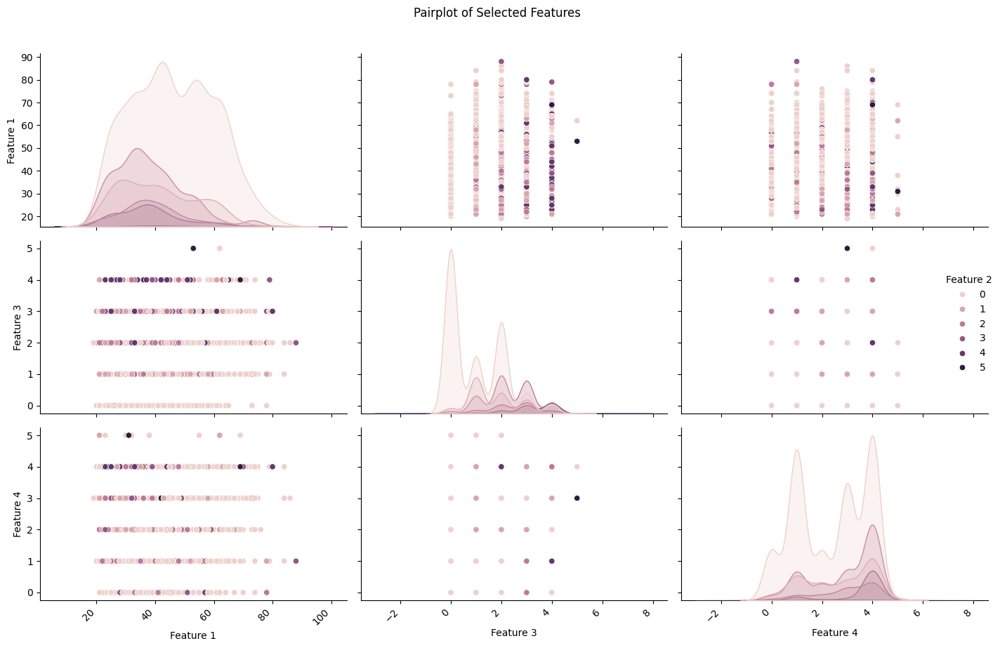

Feature Mapping:
Feature 1: Current Age
Feature 2: Is the client employed?
Feature 3: Does the client get adequate income?
Feature 4: Does the client have housing and is not at any immediate risk of losing the housing?


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the features and create a mapping from names to numeric labels
selected_features = ['Current Age', 'Is the client employed?',
                     'Does the client get adequate income?',
                     'Does the client have housing and is not at any immediate risk of losing the housing?']

feature_mapping = {feature: f'Feature {i+1}' for i, feature in enumerate(selected_features)}

# Replace the column names with the numeric labels in the dataframe
df_numeric = df[selected_features].rename(columns=feature_mapping)

# Create the pairplot with the numeric labels
pairplot = sns.pairplot(df_numeric.dropna(), hue=feature_mapping['Is the client employed?'], diag_kind='kde', height=3, aspect=1.5)
pairplot.fig.suptitle('Pairplot of Selected Features', y=1.02)

# Adjust the font size of the labels
for ax in pairplot.axes.flatten():
    plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=10)
    plt.setp(ax.get_yticklabels(), fontsize=10)
    if ax.get_title():
        ax.set_title(ax.get_title(), fontsize=12)

plt.tight_layout()
plt.show()

# Display the mapping from numeric labels to original feature names
print("Feature Mapping:")
for original, numeric in feature_mapping.items():
    print(f'{numeric}: {original}')


### Explanation of the Pairplot Output

The pairplot above provides a visual representation of the relationships between selected features in your dataset. Here's a breakdown of the components and what they indicate:

1. **Diagonal Plots (KDE Plots)**:
    - The diagonal plots show the Kernel Density Estimate (KDE) for each feature, providing a smoothed histogram.
    - **Feature 1 (Current Age)**: Shows the age distribution of the clients. It appears that the majority of clients fall between the ages of 20 and 70.
    - **Feature 2 (Is the client employed?)**: Displays the distribution of employment status. This feature seems to have multiple discrete values (likely representing different employment states).
    - **Feature 3 (Does the client get adequate income?)**: Shows the distribution of income adequacy among clients, indicating several discrete responses.
    - **Feature 4 (Does the client have housing and is not at any immediate risk of losing the housing?)**: Illustrates the housing stability of clients, again indicating discrete responses.

2. **Off-Diagonal Plots (Scatter Plots)**:
    - These plots display pairwise relationships between the features using scatter plots.
    - **Feature 1 vs. Feature 2**: Shows how different age groups are distributed across different employment statuses.
    - **Feature 1 vs. Feature 3**: Shows the relationship between age and income adequacy. There appear to be clusters at specific values, indicating the presence of discrete categories in income adequacy.
    - **Feature 1 vs. Feature 4**: Illustrates the relationship between age and housing stability.
    - **Feature 2 vs. Feature 3**: Displays the relationship between employment status and income adequacy, with visible clusters indicating discrete categories.
    - **Feature 2 vs. Feature 4**: Shows the relationship between employment status and housing stability.
    - **Feature 3 vs. Feature 4**: Illustrates the relationship between income adequacy and housing stability, with visible clusters for different categories.

3. **Legend**:
    - The legend indicates the color coding for `Feature 2 (Is the client employed?)`, which has multiple discrete values ranging from 0 to 5. These could represent different employment statuses (e.g., unemployed, part-time, full-time).

4. **Feature Mapping**:
    - Below the plot, the mapping from numeric labels to the original feature names is provided for reference:
        - Feature 1: Current Age
        - Feature 2: Is the client employed?
        - Feature 3: Does the client get adequate income?
        - Feature 4: Does the client have housing and is not at any immediate risk of losing the housing?

### Key Observations
- **Age Distribution**: Most clients are aged between 20 and 70, with peaks indicating common age ranges.
- **Discrete Features**: Features 2, 3, and 4 have discrete values, indicating categorical responses.
- **Pairwise Relationships**: The scatter plots show clusters indicating relationships between different features. For example, older clients might have different employment statuses compared to younger clients.
- **Multicollinearity Check**: The heatmap of the correlation matrix can further help identify if there are strong linear relationships between features.

This plot helps you to understand the distributions and relationships between different features in your dataset, providing insights into potential patterns and correlations.

#TIME SERIES ANALYSIS

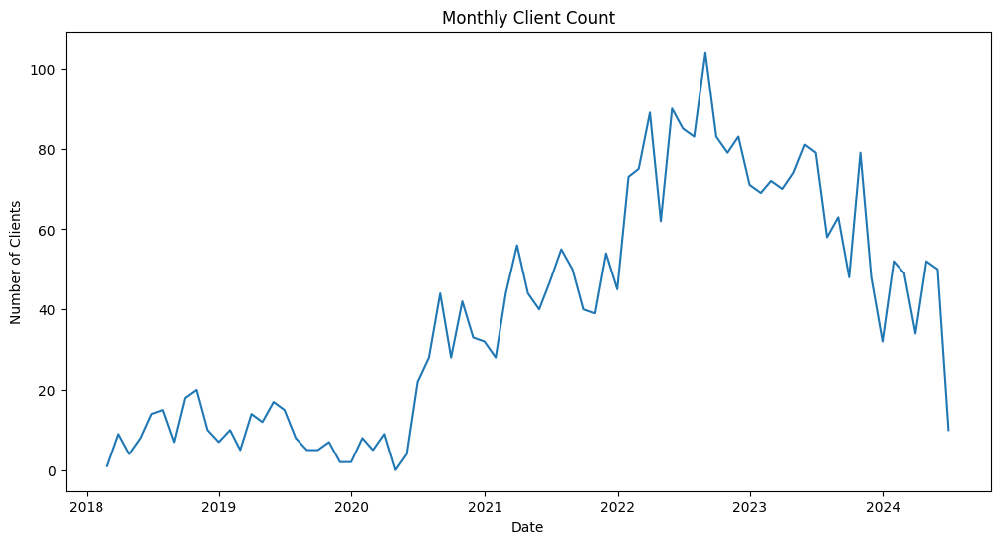

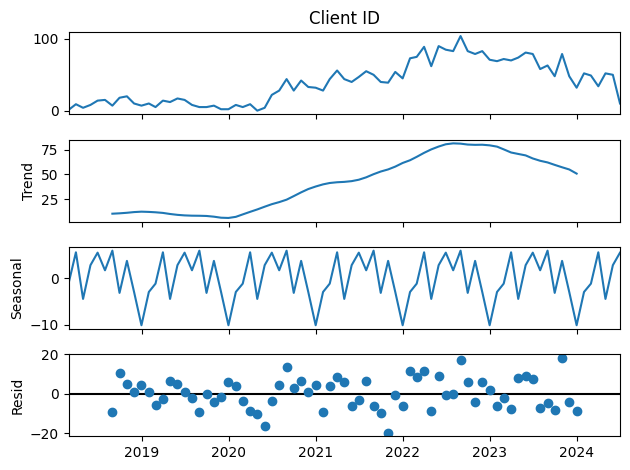

ADF Statistic: -1.3405926072937422
p-value: 0.6104027131442795
                               SARIMAX Results                                
Dep. Variable:              Client ID   No. Observations:                   77
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -293.811
Date:                Wed, 07 Aug 2024   AIC                            593.621
Time:                        16:37:01   BIC                            600.613
Sample:                    02-28-2018   HQIC                           596.416
                         - 06-30-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0907      0.218     -0.416      0.677      -0.518       0.336
ma.L1         -0.3944      0.202     -1.955      0.051      -0.790  

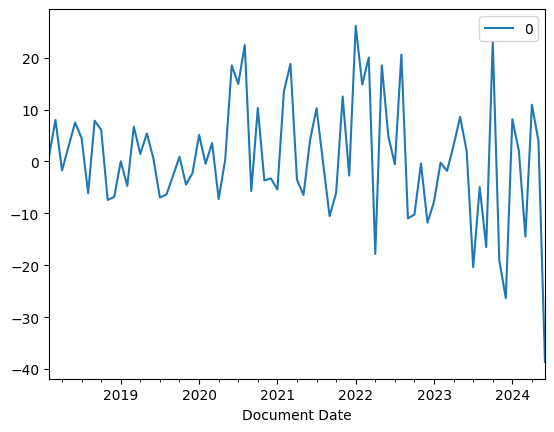

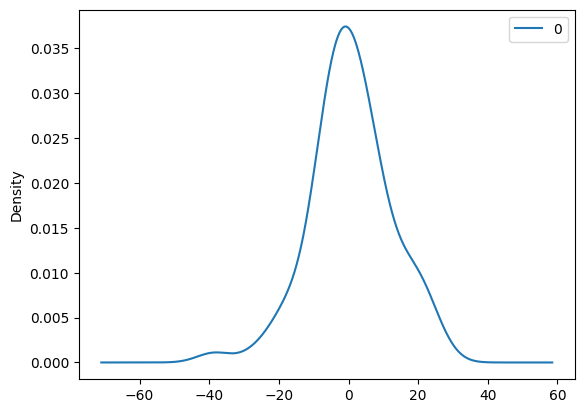

               0
count  77.000000
mean    0.615389
std    11.525736
min   -38.625365
25%    -6.066851
50%     0.033081
75%     7.496217
max    26.117625


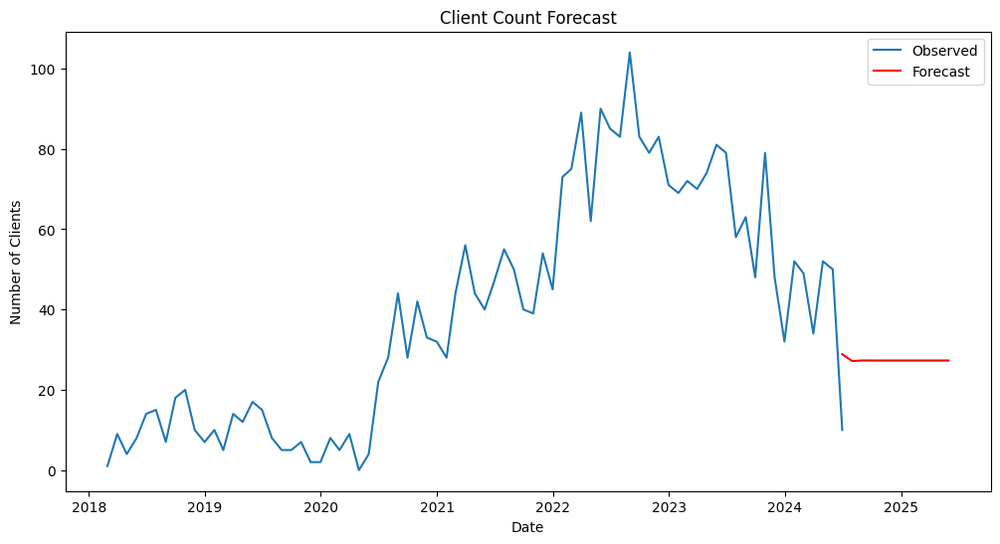

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA

# Load the dataset
file_path = '3011_Rpt_AgencyDoc_Detail Self-sufficiency survey.xlsx'
df = pd.read_excel(file_path)

# Convert 'Document Date' to datetime
df['Document Date'] = pd.to_datetime(df['Document Date'])

# Set 'Document Date' as the index
df.set_index('Document Date', inplace=True)

# Resample the data to monthly frequency and aggregate by count of 'Client ID' (or any other column)
df_monthly = df['Client ID'].resample('M').count()

# Plot the time series
plt.figure(figsize=(12, 6))
plt.plot(df_monthly)
plt.title('Monthly Client Count')
plt.xlabel('Date')
plt.ylabel('Number of Clients')
plt.show()

# Decompose the time series
decomposition = seasonal_decompose(df_monthly, model='additive')
decomposition.plot()
plt.show()

# Check for stationarity with Augmented Dickey-Fuller test
result = adfuller(df_monthly.dropna())
print('ADF Statistic:', result[0])
print('p-value:', result[1])

# Fit the ARIMA model
model = ARIMA(df_monthly, order=(1, 1, 1))
model_fit = model.fit()
print(model_fit.summary())

# Plot the residuals
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

# Forecasting
forecast_steps = 12  # Forecast for 12 months
forecast = model_fit.forecast(steps=forecast_steps)

# Plot the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_monthly, label='Observed')
plt.plot(pd.date_range(df_monthly.index[-1], periods=forecast_steps, freq='M'), forecast, label='Forecast', color='red')
plt.title('Client Count Forecast')
plt.xlabel('Date')
plt.ylabel('Number of Clients')
plt.legend()
plt.show()


### How the Analysis Helps with Your Capstone Project

#### Time Series Analysis

**Relevance to Capstone Project:**
- **Forecasting Health Trends**: Time series analysis can be used to predict future health trends and client needs, allowing public health professionals to anticipate and respond proactively.
- **Resource Allocation**: By forecasting client counts and other key metrics, the project can better allocate resources and staff to meet anticipated demands.
- **Integration with Dashboard**: The insights from time series analysis can be integrated into the DHIS 2 and Power BI dashboard, providing real-time predictive analytics to users.

**Practical Application:**
- **Example**: If the analysis predicts an increase in patients needing certain health services, RCCCP can prepare by allocating more resources or initiating preventive measures.

#### Regression Models

**Relevance to Capstone Project:**
- **Identifying Key Factors**: Regression models can identify key factors influencing public health outcomes, such as age, employment status, income adequacy, and housing stability.
- **Targeted Interventions**: Understanding these factors helps in designing targeted interventions to improve health outcomes.
- **Predictive Insights**: Regression models provide insights into the relationships between various health indicators and outcomes, which can be crucial for public health decision-making.

**Practical Application:**
- **Example**: If the model shows that housing stability significantly impacts health outcomes, RCCCP can focus on housing support programs to improve overall public health.

#### Classification Models

**Relevance to Capstone Project:**
- **Risk Identification**: Classification models help identify high-risk populations or areas, enabling RCCCP to prioritize interventions.
- **Real-time Decision Support**: By integrating these models into the DHIS 2 and Power BI dashboard, public health professionals can receive real-time alerts and recommendations.

**Practical Application:**
- **Example**: A classification model predicting the likelihood of clients needing emergency services can trigger proactive measures to prevent crises.

#### Clustering Analysis

**Relevance to Capstone Project:**
- **Segmenting Populations**: Clustering helps in segmenting the population into groups with similar characteristics, making it easier to design and implement tailored public health programs.
- **Understanding Demographics**: By identifying natural groupings, RCCCP can better understand the diverse needs of different demographic groups.

**Practical Application:**
- **Example**: Clustering can reveal distinct groups within the population, such as those with high health risks due to socio-economic factors, allowing for targeted health interventions.

### Detailed Example of Application:

#### Project Phases and Integration:

1. **Data Collection and Management**:
   - **Process**: Collect data using DHIS 2, ensuring it is clean and well-structured.
   - **Integration**: Use insights from regression models to validate the importance of collected data elements.

2. **Technical Setup and Configuration**:
   - **Process**: Set up the DHIS 2 server and necessary software components.
   - **Integration**: Ensure data collected is aligned with the needs identified by regression and classification models for future analysis.

3. **Development of Machine Learning Models**:
   - **Classification Models**: Predict high-risk areas and populations.
     - **Outcome**: Use models to identify clients at risk of severe health issues and provide early interventions.
   - **Regression Models**: Understand key factors influencing health outcomes.
     - **Outcome**: Design public health initiatives targeting identified factors (e.g., improving income adequacy).
   - **Clustering**: Group similar health outcomes or demographic profiles.
     - **Outcome**: Develop specialized programs for different clusters (e.g., focused health campaigns).

4. **Dashboard Creation**:
   - **Integration**: Incorporate time series forecasts to show predicted health trends.
   - **Visualization**: Use Power BI to visualize regression and clustering results, making it easy for users to interpret and act on the data.
   - **Interactive Features**: Allow users to explore different scenarios based on predictive models.

5. **User Testing and Feedback Collection**:
   - **Process**: Conduct testing sessions to gather feedback on dashboard usability.
   - **Integration**: Refine models and visualizations based on user input to improve accuracy and relevance.

6. **Final Evaluation**:
   - **Process**: Validate the models and dashboard with new data.
   - **Integration**: Ensure the decision support system meets all project objectives and provides actionable insights.

### Impact on Organization and Skills:

**Organizational Impact:**
- **Enhanced Decision-Making**: The integration of predictive models into the dashboard empowers RCCCP with real-time, data-driven decision support.
- **Improved Public Health Outcomes**: Targeted interventions based on model insights lead to better health outcomes and resource utilization.

**Skills Development:**
- **Technical Skills**: Enhanced understanding of machine learning, data management, and system integration.
- **Analytical Skills**: Improved ability to apply theoretical knowledge to practical challenges in public health.
- **Leadership and Collaboration**: Experience in leading technical projects and working collaboratively with diverse teams.

### Summary:

By incorporating time series analysis, regression, classification, and clustering into your DHIS 2 and Power BI integration, you can create a comprehensive decision support system. This system will provide valuable insights, predict future trends, and identify key factors influencing health outcomes. It will significantly enhance RCCCP's ability to make informed decisions, improve public health strategies, and allocate resources effectively.

#More visualization

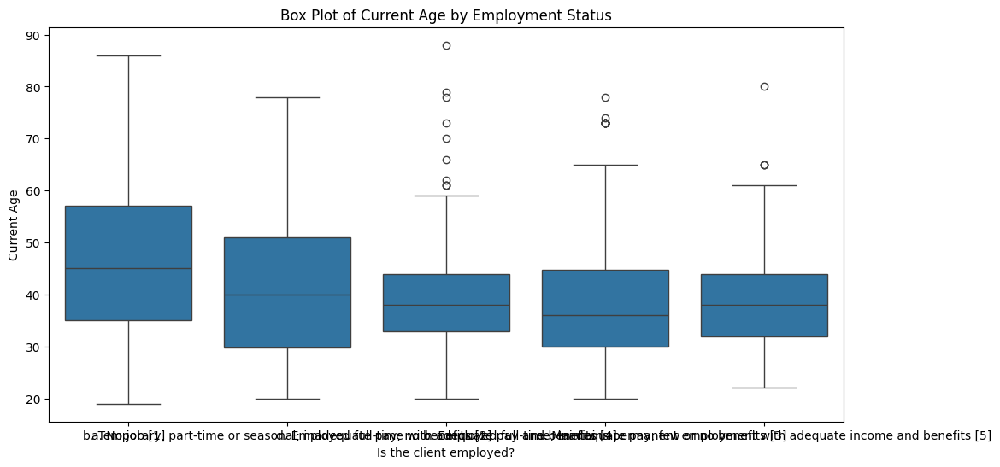

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Reset the index to avoid duplicate index labels
df_reset = df.reset_index()

# Box Plot: Current Age by Employment Status
plt.figure(figsize=(12, 6))
sns.boxplot(x='Is the client employed?', y='Current Age', data=df_reset)
plt.title('Box Plot of Current Age by Employment Status')
plt.xlabel('Is the client employed?')
plt.ylabel('Current Age')
plt.show()


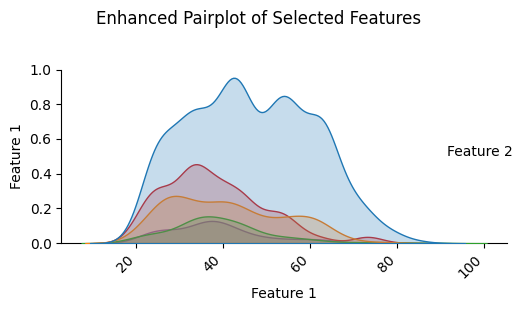

Feature Mapping:
Feature 1: Current Age
Feature 2: Is the client employed?
Feature 3: Does the client get adequate income?
Feature 4: Does the client have housing and is not at any immediate risk of losing the housing?


In [ ]:
# Pairplot with custom color palette and diagonal kde plots
selected_features = ['Current Age', 'Is the client employed?',
                     'Does the client get adequate income?',
                     'Does the client have housing and is not at any immediate risk of losing the housing?']

feature_mapping = {feature: f'Feature {i+1}' for i, feature in enumerate(selected_features)}
df_numeric = df[selected_features].rename(columns=feature_mapping)

pairplot = sns.pairplot(df_numeric.dropna(), hue=feature_mapping['Is the client employed?'], diag_kind='kde', height=3, aspect=1.5, palette='tab10')
pairplot.fig.suptitle('Enhanced Pairplot of Selected Features', y=1.02)

for ax in pairplot.axes.flatten():
    plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=10)
    plt.setp(ax.get_yticklabels(), fontsize=10)
    if ax.get_title():
        ax.set_title(ax.get_title(), fontsize=12)

plt.tight_layout()
plt.show()

# Display the mapping from numeric labels to original feature names
print("Feature Mapping:")
for original, numeric in feature_mapping.items():
    print(f'{numeric}: {original}')


/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


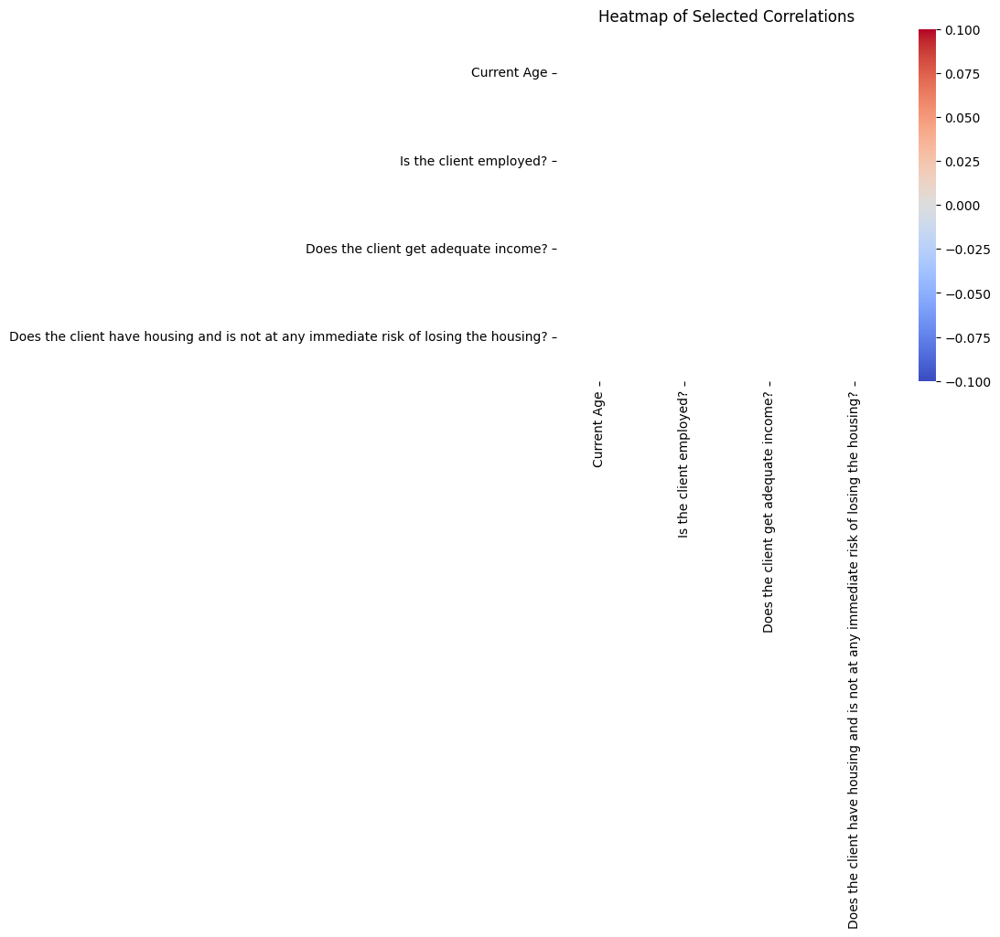

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the selected features
selected_features = ['Current Age', 'Is the client employed?', 'Does the client get adequate income?', 'Does the client have housing and is not at any immediate risk of losing the housing?']

# Check and convert non-numeric columns to numeric if necessary
for col in selected_features:
    if df[col].dtype == 'object':
        df[col] = pd.to_numeric(df[col], errors='coerce')

# Drop rows with NaN values resulting from conversion
df_cleaned = df[selected_features].dropna()

# Calculate correlations
selected_corr = df_cleaned.corr()

# Plot the heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(selected_corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmap of Selected Correlations')
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels wit

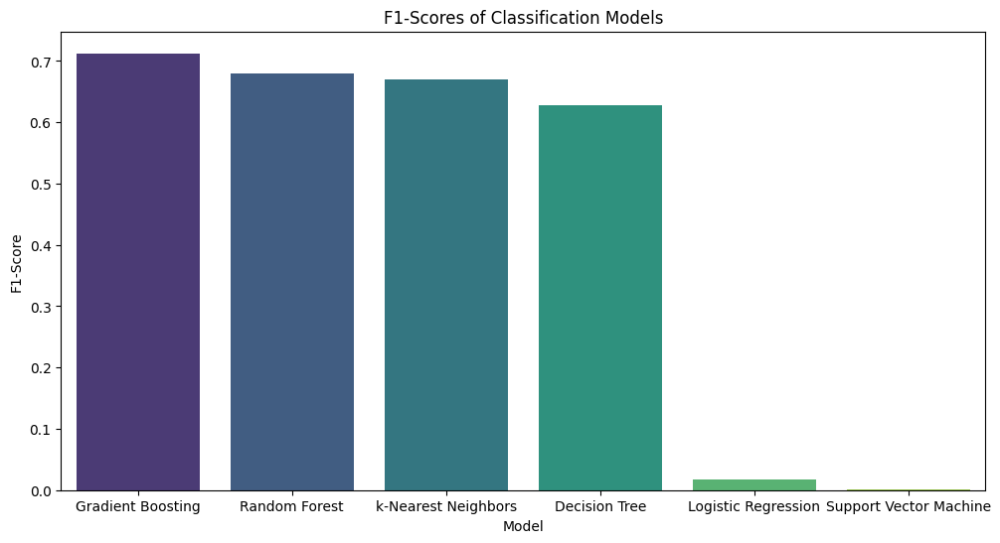

The best classification model is Gradient Boosting with an F1-Score of 0.71


<ipython-input-19-4ab378393426>:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  best_model = f1_scores_df.idxmax()[0]
<ipython-input-19-4ab378393426>:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  best_model_f1_score = f1_scores_df.max()[0]


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

# Train and evaluate models
classification_reports = {}
models = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'Support Vector Machine': SVC(),
    'k-Nearest Neighbors': KNeighborsClassifier()
}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    report = classification_report(y_test, y_pred, output_dict=True)
    classification_reports[name] = report

# Extracting F1-scores for each model from the classification reports
f1_scores = {model_name: report['weighted avg']['f1-score'] for model_name, report in classification_reports.items()}

# Convert to DataFrame for better visualization
f1_scores_df = pd.DataFrame.from_dict(f1_scores, orient='index', columns=['F1-Score'])

# Sort by F1-Score
f1_scores_df.sort_values(by='F1-Score', ascending=False, inplace=True)

# Plotting F1-Scores for each model
plt.figure(figsize=(12, 6))
sns.barplot(x=f1_scores_df.index, y=f1_scores_df['F1-Score'], palette='viridis')
plt.title('F1-Scores of Classification Models')
plt.xlabel('Model')
plt.ylabel('F1-Score')
plt.show()

# Display the best model
best_model = f1_scores_df.idxmax()[0]
best_model_f1_score = f1_scores_df.max()[0]
print(f"The best classification model is {best_model} with an F1-Score of {best_model_f1_score:.2f}")


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels wit

The best classification model is Gradient Boosting with an F1-Score of 0.71


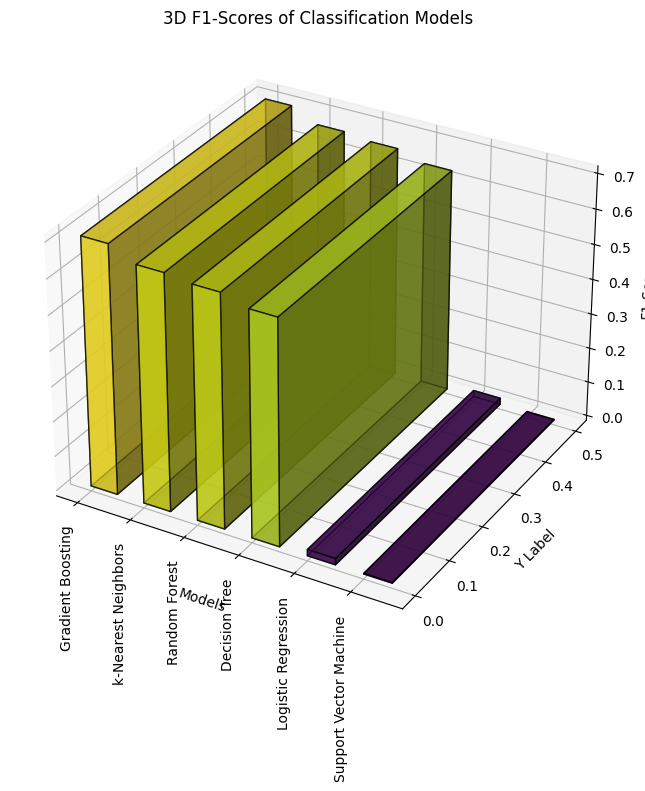

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

# Assuming X_train, X_test, y_train, and y_test are already defined

# Train and evaluate models
classification_reports = {}
models = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'Support Vector Machine': SVC(),
    'k-Nearest Neighbors': KNeighborsClassifier()
}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    report = classification_report(y_test, y_pred, output_dict=True)
    classification_reports[name] = report

# Extracting F1-scores for each model from the classification reports
f1_scores = {model_name: report['weighted avg']['f1-score'] for model_name, report in classification_reports.items()}

# Convert to DataFrame for better visualization
f1_scores_df = pd.DataFrame.from_dict(f1_scores, orient='index', columns=['F1-Score'])

# Sort by F1-Score
f1_scores_df.sort_values(by='F1-Score', ascending=False, inplace=True)

# Prepare data for 3D plotting
models = f1_scores_df.index.tolist()
scores = f1_scores_df['F1-Score'].values
x = range(len(models))
y = [0] * len(models)
z = [0] * len(models)
dx = dy = 0.5
dz = scores

# 3D bar plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Plotting the bars
ax.bar3d(x, y, z, dx, dy, dz, color=plt.cm.viridis(dz / max(dz)), alpha=0.7, edgecolor='k')

# Setting the labels
ax.set_xlabel('Models')
ax.set_ylabel('Y Label')
ax.set_zlabel('F1-Score')

# Setting the ticks and labels
ax.set_xticks(x)
ax.set_xticklabels(models, rotation=90)

# Title
plt.title('3D F1-Scores of Classification Models')

# Display the best model
best_model = f1_scores_df.idxmax()[0]
best_model_f1_score = f1_scores_df.max()[0]
print(f"The best classification model is {best_model} with an F1-Score of {best_model_f1_score:.2f}")

plt.show()


#DATASET 2

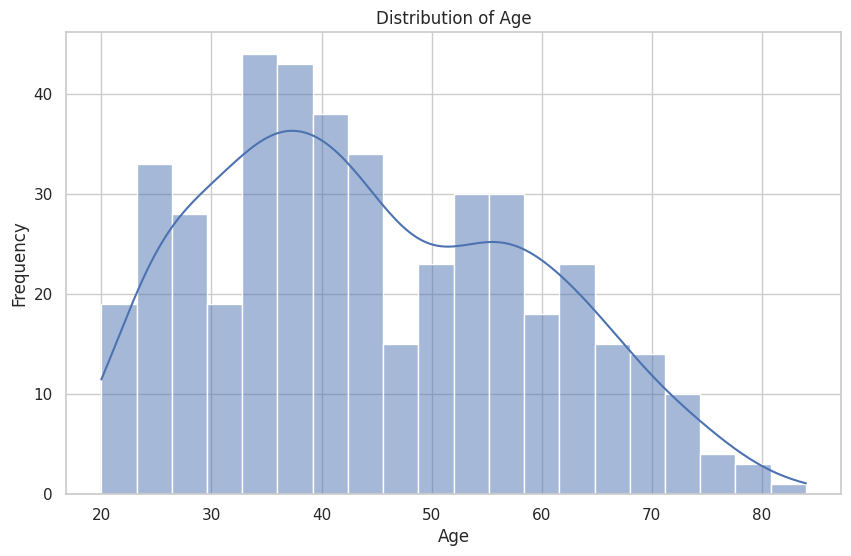

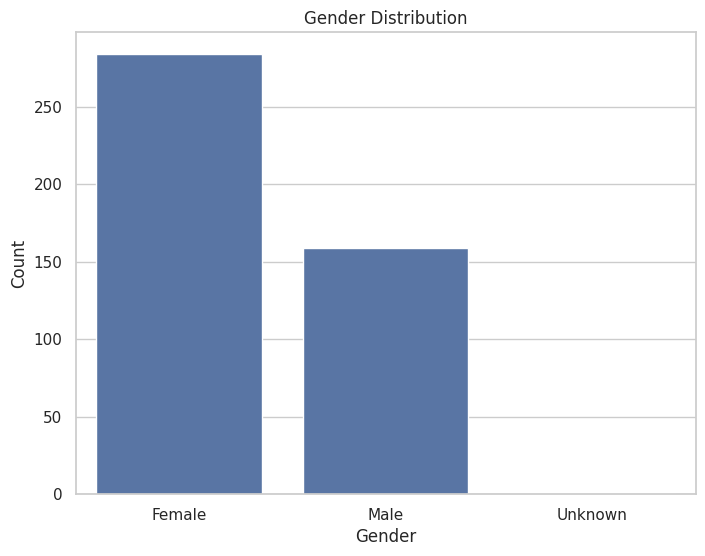

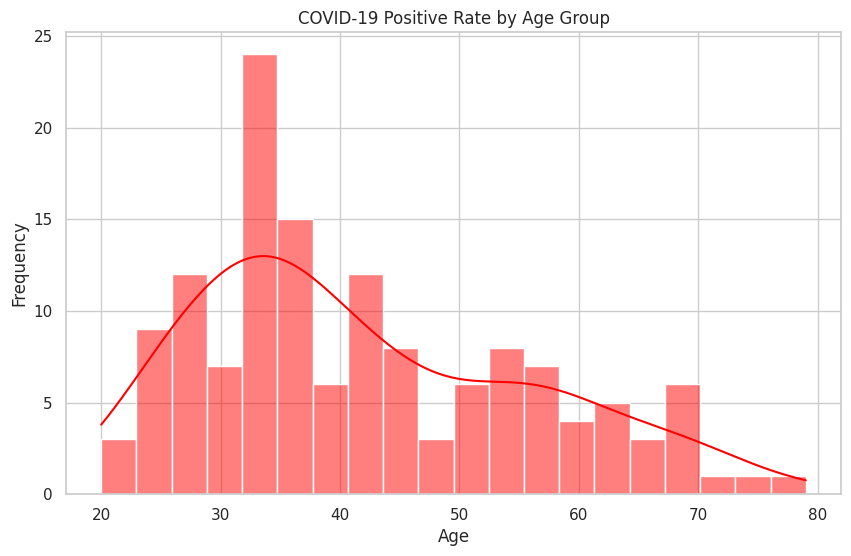

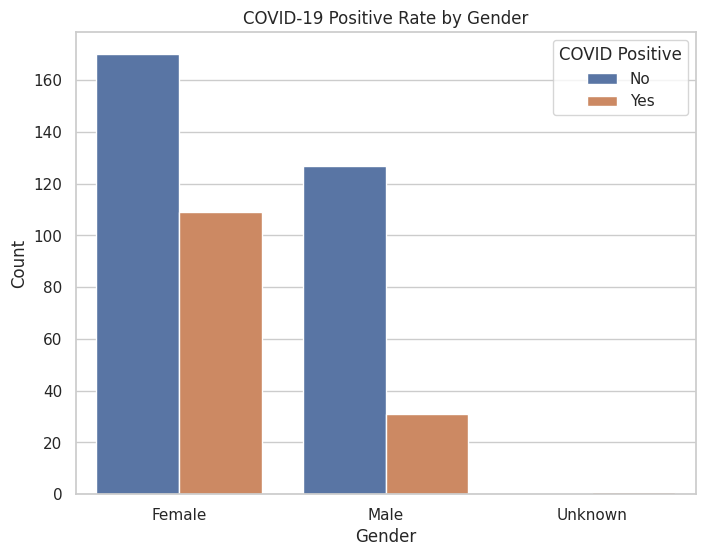

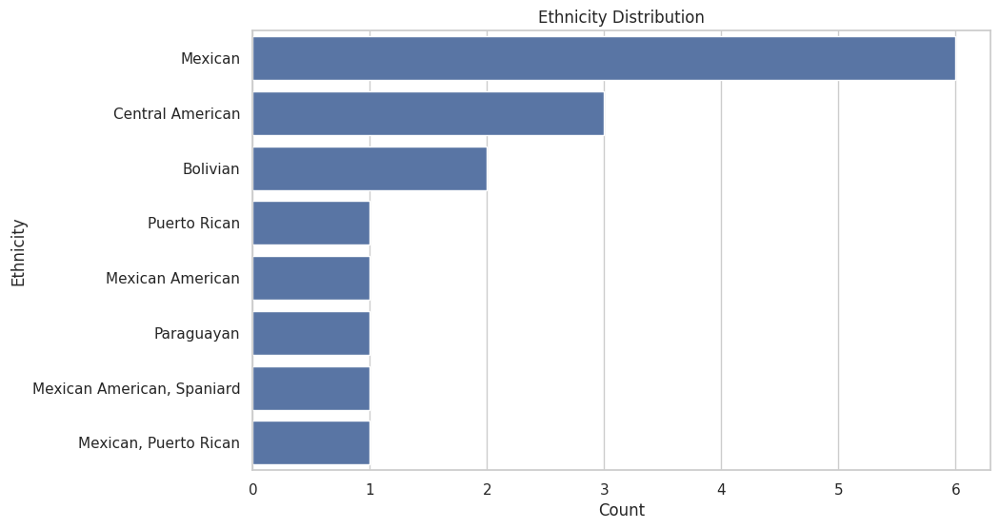

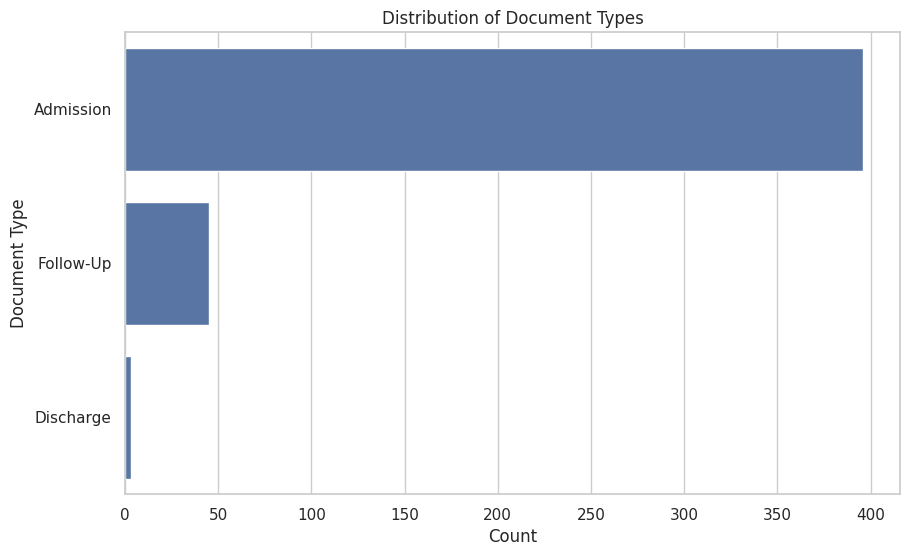

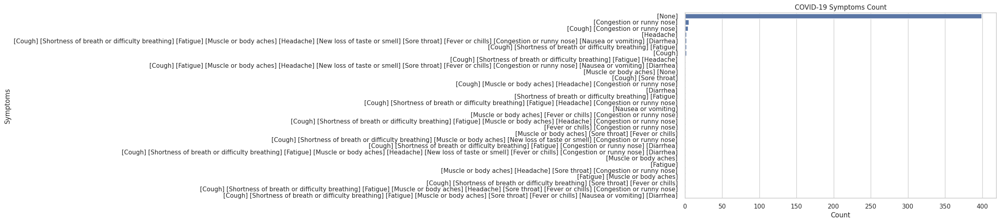

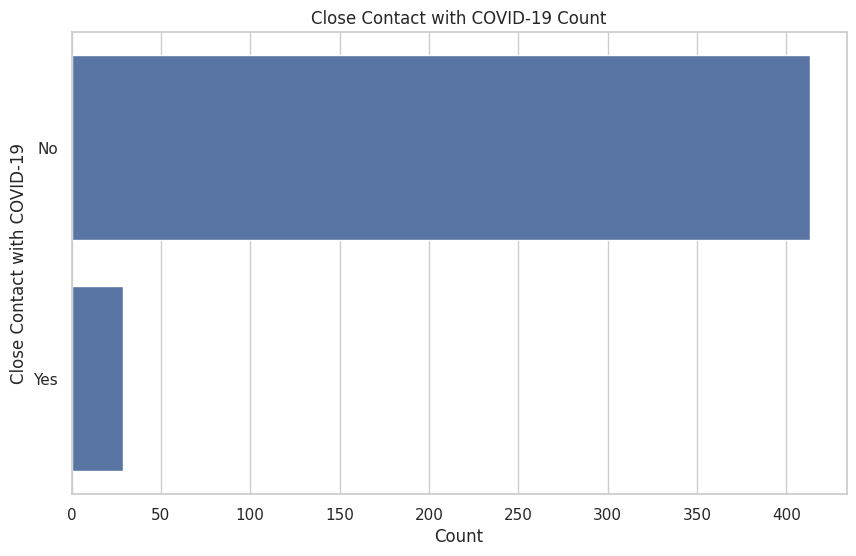

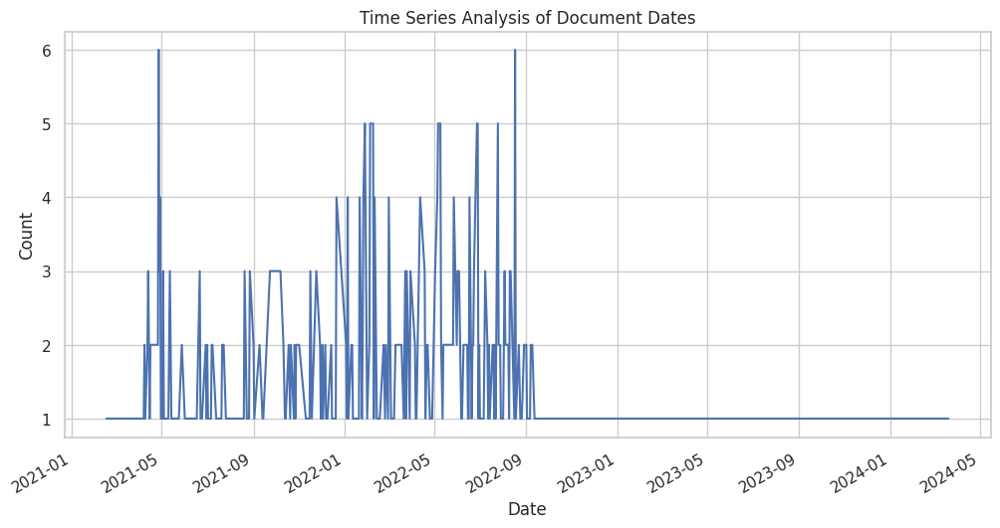

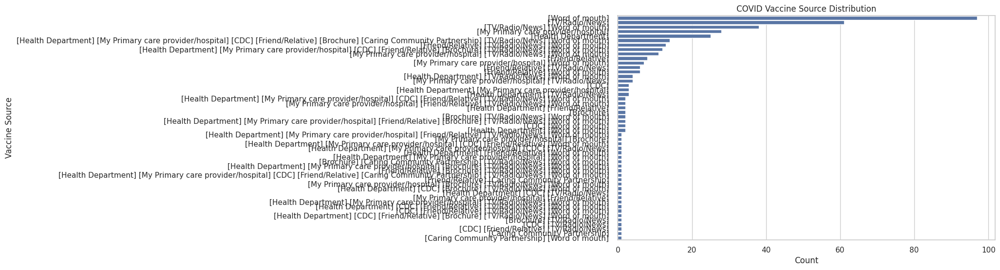

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '446_Rpt_AgencyDoc_Detail_Covid-19 screening.xlsx'
df2 = pd.read_excel(file_path)

# Drop the first row which is used as header and rename columns based on the first row
df2.columns = df2.iloc[0]
df2 = df2.drop(0)

# Reset the index
df2 = df2.reset_index(drop=True)

# Rename columns for easier access
df2.columns = [
    'Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race', 'Ethnicity',
    'Gender', 'Document_Date', 'Document_Type', 'COVID_Symptoms', 'Close_Contact_with_COVID',
    'COVID_Quarantine', 'COVID_Test_Pending', 'COVID_Positive', 'COVID_Positive_Date',
    'COVID_Vaccine_Impacts', 'COVID_Vaccine_Impacts_Explanation', 'COVID_Vaccine_Source',
    'COVID_Vaccine_Questions', 'COVID_Other_Questions', 'COVID_Access_Barriers',
    'COVID_Barrier_Explanation'
]

# Drop rows with all NaN values
df2 = df2.dropna(how='all')

# Convert relevant columns to appropriate data types
df2['Current_Age'] = pd.to_numeric(df2['Current_Age'], errors='coerce')
df2['Document_Date'] = pd.to_datetime(df2['Document_Date'], errors='coerce')

# Exploratory Data Analysis and Visualization

# Set the style for the plots
sns.set(style="whitegrid")

# 1. Distribution of Age
plt.figure(figsize=(10, 6))
sns.histplot(df2['Current_Age'].dropna(), kde=True, bins=20)
plt.title('Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

# 2. Gender Distribution
plt.figure(figsize=(8, 6))
sns.countplot(x='Gender', data=df2)
plt.title('Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()

# 3. COVID-19 Positive Rate by Age Group
plt.figure(figsize=(10, 6))
sns.histplot(df2[df2['COVID_Positive'] == 'Yes']['Current_Age'].dropna(), kde=True, bins=20, color='red')
plt.title('COVID-19 Positive Rate by Age Group')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

# 4. COVID-19 Positive Rate by Gender
plt.figure(figsize=(8, 6))
sns.countplot(x='Gender', hue='COVID_Positive', data=df2)
plt.title('COVID-19 Positive Rate by Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='COVID Positive')
plt.show()

# 5. Ethnicity Distribution
plt.figure(figsize=(10, 6))
sns.countplot(y='Ethnicity', data=df2, order=df2['Ethnicity'].value_counts().index)
plt.title('Ethnicity Distribution')
plt.xlabel('Count')
plt.ylabel('Ethnicity')
plt.show()

# 6. Distribution of Document Types
plt.figure(figsize=(10, 6))
sns.countplot(y='Document_Type', data=df2, order=df2['Document_Type'].value_counts().index)
plt.title('Distribution of Document Types')
plt.xlabel('Count')
plt.ylabel('Document Type')
plt.show()

# 7. COVID-19 Symptoms Count
plt.figure(figsize=(10, 6))
sns.countplot(y='COVID_Symptoms', data=df2, order=df2['COVID_Symptoms'].value_counts().index)
plt.title('COVID-19 Symptoms Count')
plt.xlabel('Count')
plt.ylabel('Symptoms')
plt.show()

# 8. Close Contact with COVID-19 Count
plt.figure(figsize=(10, 6))
sns.countplot(y='Close_Contact_with_COVID', data=df2, order=df2['Close_Contact_with_COVID'].value_counts().index)
plt.title('Close Contact with COVID-19 Count')
plt.xlabel('Count')
plt.ylabel('Close Contact with COVID-19')
plt.show()

# 9. Time Series Analysis of Document Dates
plt.figure(figsize=(12, 6))
df2['Document_Date'].value_counts().sort_index().plot()
plt.title('Time Series Analysis of Document Dates')
plt.xlabel('Date')
plt.ylabel('Count')
plt.show()

# 10. COVID Vaccine Source Distribution
plt.figure(figsize=(10, 6))
sns.countplot(y='COVID_Vaccine_Source', data=df2, order=df2['COVID_Vaccine_Source'].value_counts().index)
plt.title('COVID Vaccine Source Distribution')
plt.xlabel('Count')
plt.ylabel('Vaccine Source')
plt.show()


<ipython-input-22-f3435540d044>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap(color_map)(norm(dz))
<ipython-input-22-f3435540d044>:58: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mappable, shrink=0.5, aspect=5)


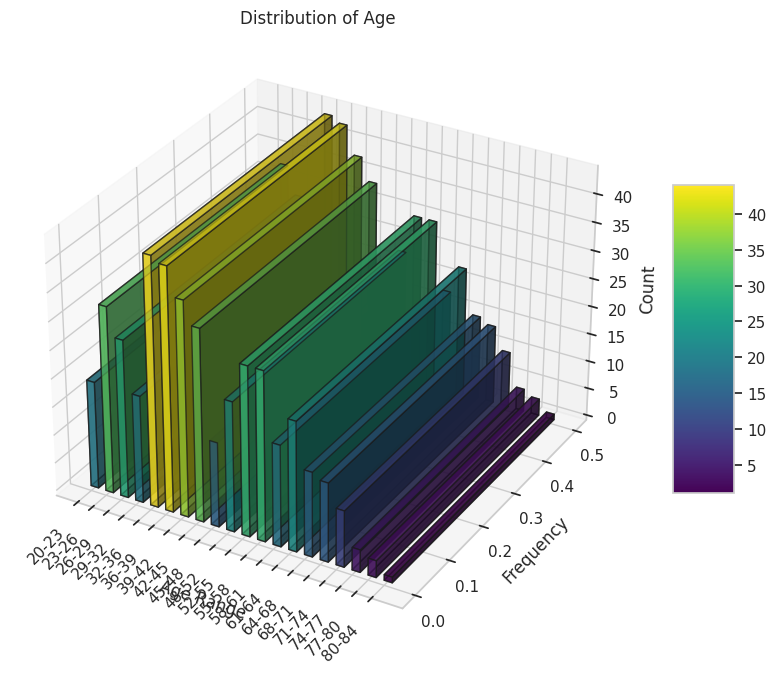

<ipython-input-22-f3435540d044>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap(color_map)(norm(dz))
<ipython-input-22-f3435540d044>:58: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mappable, shrink=0.5, aspect=5)


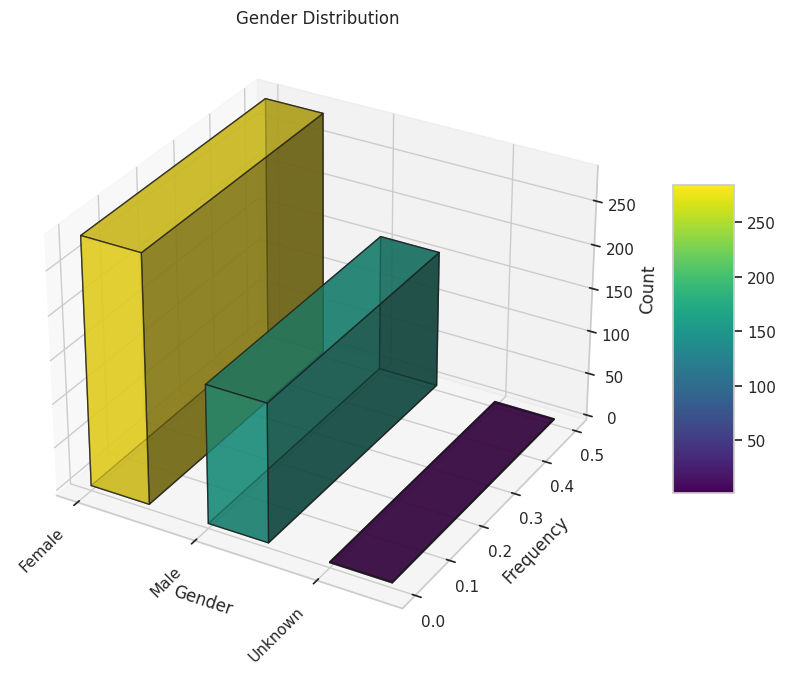

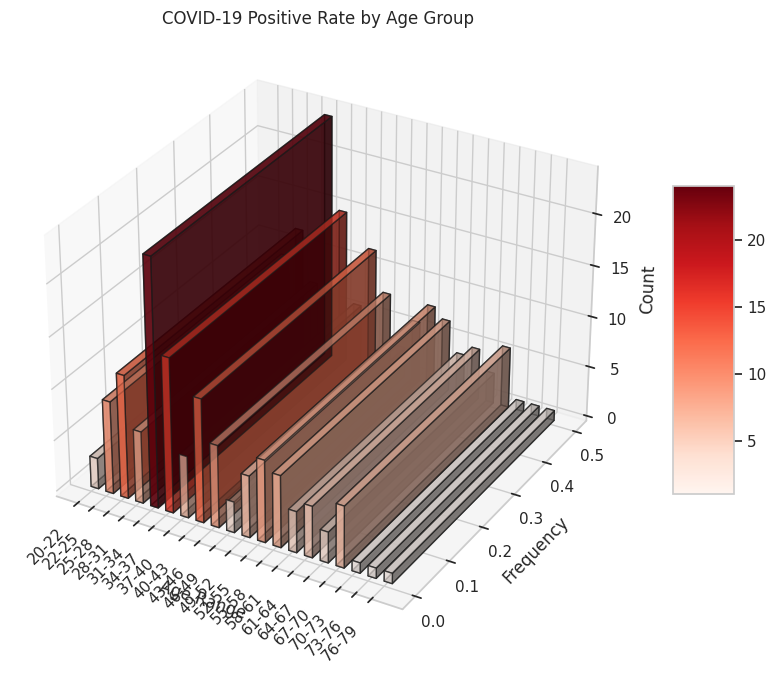

<ipython-input-22-f3435540d044>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap(color_map)(norm(dz))
<ipython-input-22-f3435540d044>:58: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mappable, shrink=0.5, aspect=5)


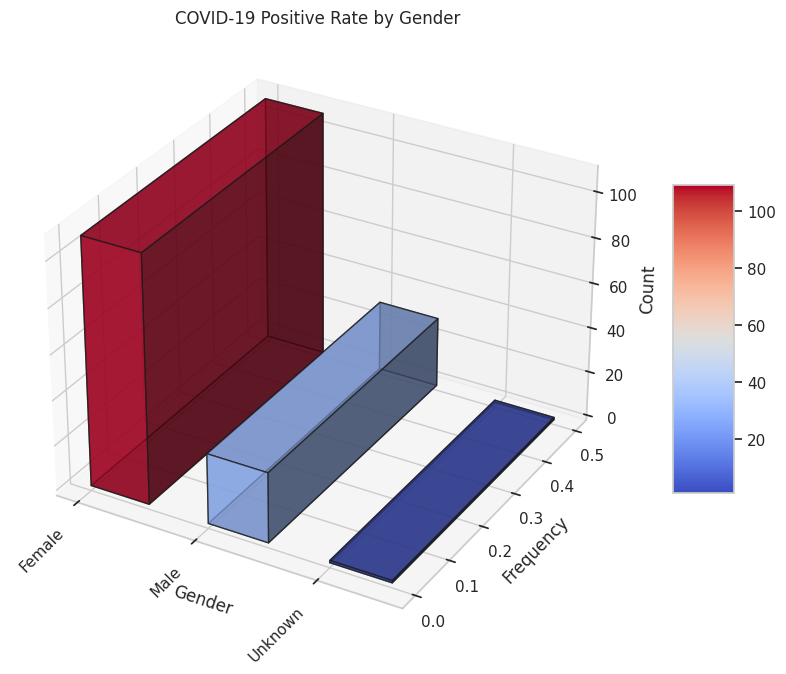

<ipython-input-22-f3435540d044>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap(color_map)(norm(dz))
<ipython-input-22-f3435540d044>:58: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mappable, shrink=0.5, aspect=5)


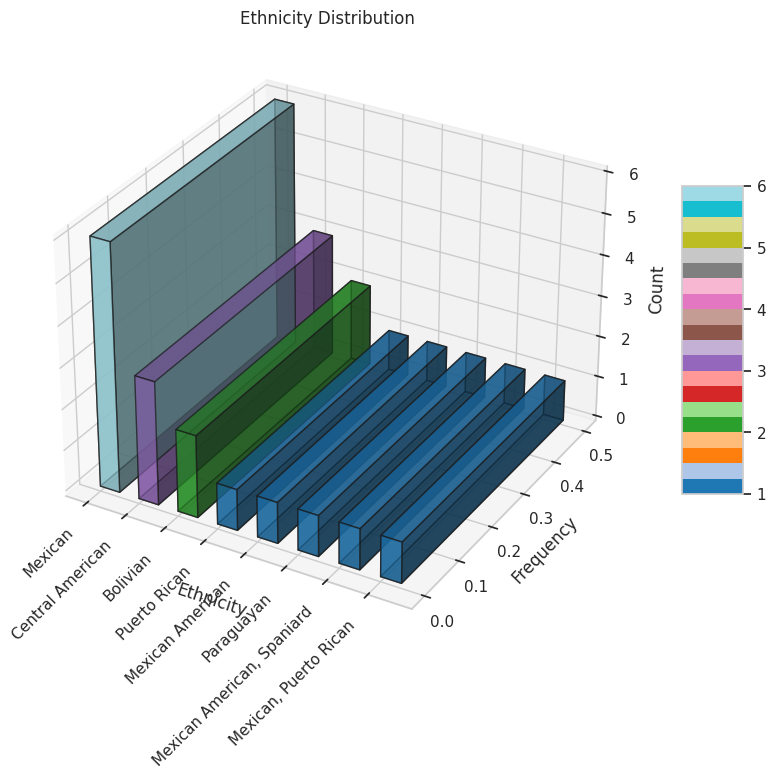

<ipython-input-22-f3435540d044>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap(color_map)(norm(dz))
<ipython-input-22-f3435540d044>:58: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mappable, shrink=0.5, aspect=5)


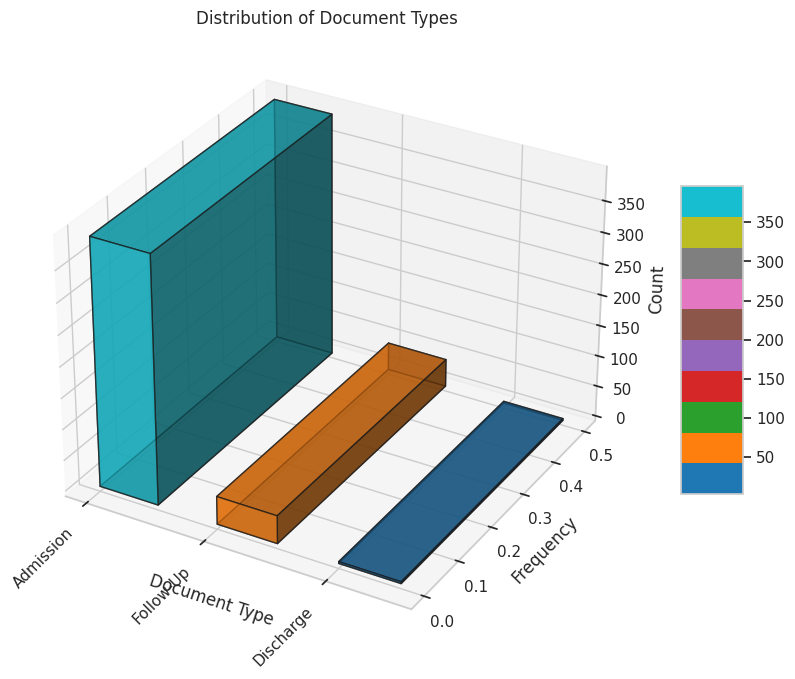

<ipython-input-22-f3435540d044>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap(color_map)(norm(dz))
<ipython-input-22-f3435540d044>:58: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mappable, shrink=0.5, aspect=5)


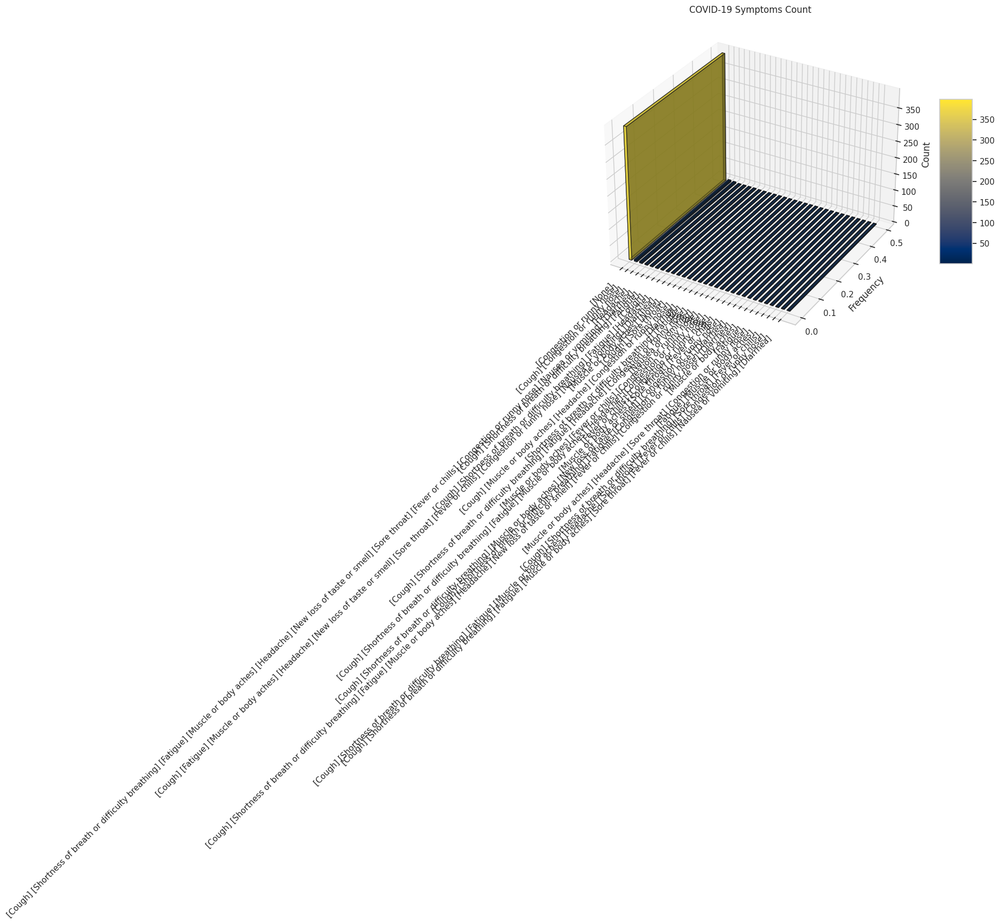

<ipython-input-22-f3435540d044>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap(color_map)(norm(dz))
<ipython-input-22-f3435540d044>:58: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mappable, shrink=0.5, aspect=5)


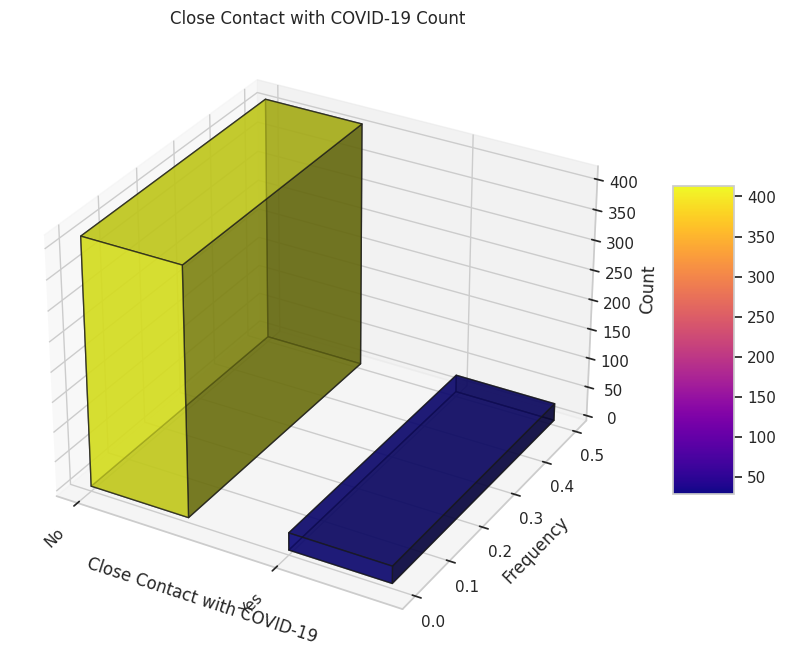

<ipython-input-22-f3435540d044>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap(color_map)(norm(dz))
<ipython-input-22-f3435540d044>:58: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mappable, shrink=0.5, aspect=5)


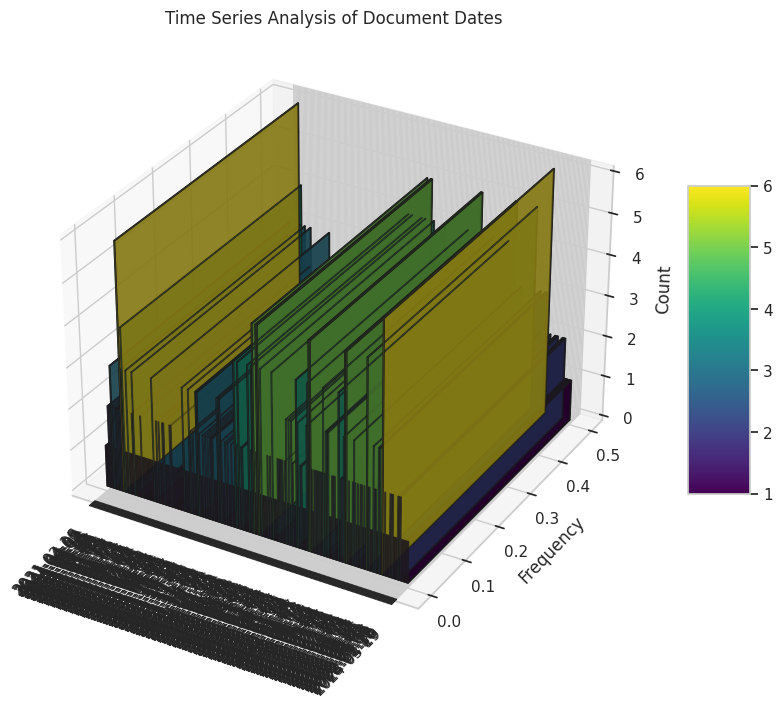

<ipython-input-22-f3435540d044>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap(color_map)(norm(dz))
<ipython-input-22-f3435540d044>:58: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mappable, shrink=0.5, aspect=5)


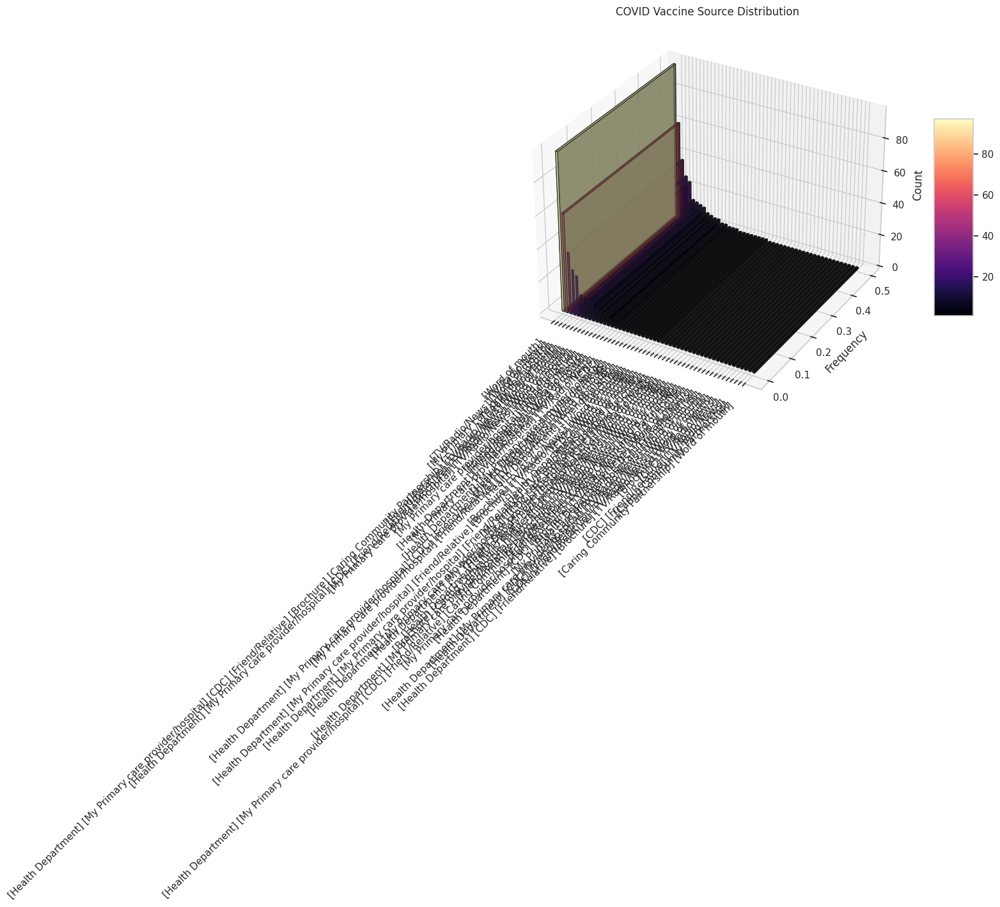

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import numpy as np

# Load the dataset
file_path = '446_Rpt_AgencyDoc_Detail_Covid-19 screening.xlsx'
df2 = pd.read_excel(file_path)

# Drop the first row which is used as header and rename columns based on the first row
df2.columns = df2.iloc[0]
df2 = df2.drop(0)

# Reset the index
df2 = df2.reset_index(drop=True)

# Rename columns for easier access
df2.columns = [
    'Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race', 'Ethnicity',
    'Gender', 'Document_Date', 'Document_Type', 'COVID_Symptoms', 'Close_Contact_with_COVID',
    'COVID_Quarantine', 'COVID_Test_Pending', 'COVID_Positive', 'COVID_Positive_Date',
    'COVID_Vaccine_Impacts', 'COVID_Vaccine_Impacts_Explanation', 'COVID_Vaccine_Source',
    'COVID_Vaccine_Questions', 'COVID_Other_Questions', 'COVID_Access_Barriers',
    'COVID_Barrier_Explanation'
]

# Drop rows with all NaN values
df2 = df2.dropna(how='all')

# Convert relevant columns to appropriate data types
df2['Current_Age'] = pd.to_numeric(df2['Current_Age'], errors='coerce')
df2['Document_Date'] = pd.to_datetime(df2['Document_Date'], errors='coerce')

# Set the style for the plots
sns.set(style="whitegrid")

# Function to create 3D bar plots with labeled axes
def create_3d_bar_plot(x_labels, z_data, xlabel, ylabel, zlabel, title, color_map='viridis'):
    x_data = np.arange(len(x_labels))
    y_data = np.zeros_like(x_data)
    dx = dy = 0.5
    dz = z_data

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    norm = plt.Normalize(min(dz), max(dz))
    colors = plt.cm.get_cmap(color_map)(norm(dz))
    ax.bar3d(x_data, y_data, np.zeros_like(dz), dx, dy, dz, color=colors, alpha=0.7, edgecolor='k')
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_zlabel(zlabel)
    ax.set_xticks(x_data)
    ax.set_xticklabels(x_labels, rotation=45, ha='right')
    plt.title(title)
    mappable = plt.cm.ScalarMappable(cmap=color_map, norm=norm)
    mappable.set_array(dz)
    fig.colorbar(mappable, shrink=0.5, aspect=5)
    plt.show()

# 1. Distribution of Age
ages = df2['Current_Age'].dropna()
hist, bins = np.histogram(ages, bins=20)
x_labels = [f'{int(bins[i])}-{int(bins[i+1])}' for i in range(len(bins)-1)]
create_3d_bar_plot(x_labels, hist, 'Age Range', 'Frequency', 'Count', 'Distribution of Age')

# 2. Gender Distribution
gender_counts = df2['Gender'].value_counts()
create_3d_bar_plot(gender_counts.index, gender_counts.values, 'Gender', 'Frequency', 'Count', 'Gender Distribution')

# 3. COVID-19 Positive Rate by Age Group
positive_ages = df2[df2['COVID_Positive'] == 'Yes']['Current_Age'].dropna()
hist, bins = np.histogram(positive_ages, bins=20)
x_labels = [f'{int(bins[i])}-{int(bins[i+1])}' for i in range(len(bins)-1)]
create_3d_bar_plot(x_labels, hist, 'Age Range', 'Frequency', 'Count', 'COVID-19 Positive Rate by Age Group', 'Reds')

# 4. COVID-19 Positive Rate by Gender
positive_gender_counts = df2[df2['COVID_Positive'] == 'Yes']['Gender'].value_counts()
create_3d_bar_plot(positive_gender_counts.index, positive_gender_counts.values, 'Gender', 'Frequency', 'Count', 'COVID-19 Positive Rate by Gender', 'coolwarm')

# 5. Ethnicity Distribution
ethnicity_counts = df2['Ethnicity'].value_counts()
create_3d_bar_plot(ethnicity_counts.index, ethnicity_counts.values, 'Ethnicity', 'Frequency', 'Count', 'Ethnicity Distribution', 'tab20')

# 6. Distribution of Document Types
document_type_counts = df2['Document_Type'].value_counts()
create_3d_bar_plot(document_type_counts.index, document_type_counts.values, 'Document Type', 'Frequency', 'Count', 'Distribution of Document Types', 'tab10')

# 7. COVID-19 Symptoms Count
symptoms_counts = df2['COVID_Symptoms'].value_counts()
create_3d_bar_plot(symptoms_counts.index, symptoms_counts.values, 'Symptoms', 'Frequency', 'Count', 'COVID-19 Symptoms Count', 'cividis')

# 8. Close Contact with COVID-19 Count
contact_counts = df2['Close_Contact_with_COVID'].value_counts()
create_3d_bar_plot(contact_counts.index, contact_counts.values, 'Close Contact with COVID-19', 'Frequency', 'Count', 'Close Contact with COVID-19 Count', 'plasma')

# 9. Time Series Analysis of Document Dates
document_dates = df2['Document_Date'].value_counts().sort_index()
x_labels = document_dates.index.strftime('%Y-%m-%d')
create_3d_bar_plot(x_labels, document_dates.values, 'Date', 'Frequency', 'Count', 'Time Series Analysis of Document Dates')

# 10. COVID Vaccine Source Distribution
vaccine_source_counts = df2['COVID_Vaccine_Source'].value_counts()
create_3d_bar_plot(vaccine_source_counts.index, vaccine_source_counts.values, 'Vaccine Source', 'Frequency', 'Count', 'COVID Vaccine Source Distribution', 'magma')


                    Model          RMSE     R-squared
0       Linear Regression  4.518531e+12 -9.577600e+22
1           Decision Tree  1.589585e+01 -1.853037e-01
2           Random Forest  1.509615e+01 -6.904156e-02
3       Gradient Boosting  1.510430e+01 -7.019529e-02
4  Support Vector Machine  1.474326e+01 -1.964594e-02


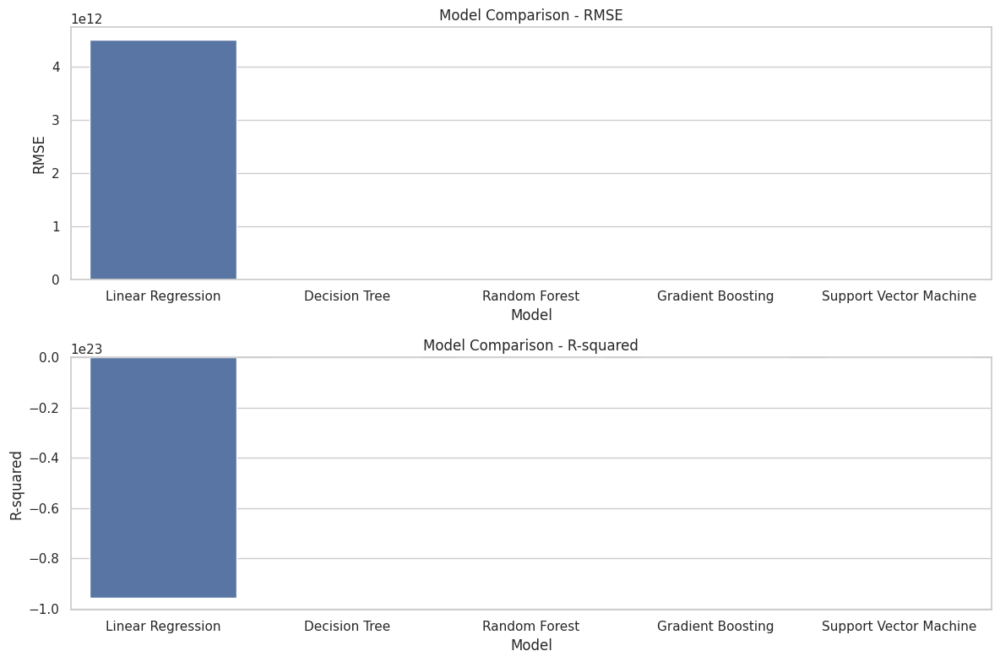

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

# Load the dataset
file_path = '446_Rpt_AgencyDoc_Detail_Covid-19 screening.xlsx'
df2 = pd.read_excel(file_path)

# Drop the first row which is used as header and rename columns based on the first row
df2.columns = df2.iloc[0]
df2 = df2.drop(0)

# Reset the index
df2 = df2.reset_index(drop=True)

# Rename columns for easier access
df2.columns = [
    'Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race', 'Ethnicity',
    'Gender', 'Document_Date', 'Document_Type', 'COVID_Symptoms', 'Close_Contact_with_COVID',
    'COVID_Quarantine', 'COVID_Test_Pending', 'COVID_Positive', 'COVID_Positive_Date',
    'COVID_Vaccine_Impacts', 'COVID_Vaccine_Impacts_Explanation', 'COVID_Vaccine_Source',
    'COVID_Vaccine_Questions', 'COVID_Other_Questions', 'COVID_Access_Barriers',
    'COVID_Barrier_Explanation'
]

# Drop rows with all NaN values
df2 = df2.dropna(how='all')

# Convert relevant columns to appropriate data types
df2['Current_Age'] = pd.to_numeric(df2['Current_Age'], errors='coerce')
df2['Document_Date'] = pd.to_datetime(df2['Document_Date'], errors='coerce')

# Select features and target variable
features = df2[['Gender', 'Race', 'COVID_Positive', 'COVID_Symptoms', 'Document_Type', 'State']]
target = df2['Current_Age']

# One-hot encode categorical variables
features = pd.get_dummies(features, drop_first=True)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.3, random_state=42)

# Initialize models
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
    'Support Vector Machine': SVR()
}

# Train models and evaluate performance
results = []
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    r2 = r2_score(y_test, y_pred)
    results.append((name, rmse, r2))

# Convert results to a DataFrame
results_df = pd.DataFrame(results, columns=['Model', 'RMSE', 'R-squared'])

# Display the results
print(results_df)

# Plotting the performance comparison

# Set up the figure
plt.figure(figsize=(12, 8))

# Plot RMSE values
plt.subplot(2, 1, 1)
sns.barplot(x='Model', y='RMSE', data=results_df)
plt.title('Model Comparison - RMSE')
plt.xlabel('Model')
plt.ylabel('RMSE')

# Plot R-squared values
plt.subplot(2, 1, 2)
sns.barplot(x='Model', y='R-squared', data=results_df)
plt.title('Model Comparison - R-squared')
plt.xlabel('Model')
plt.ylabel('R-squared')

# Adjust layout
plt.tight_layout()
plt.show()


                    Model          RMSE     R-squared
0       Linear Regression  4.518531e+12 -9.577600e+22
1           Decision Tree  1.589585e+01 -1.853037e-01
2           Random Forest  1.509615e+01 -6.904156e-02
3       Gradient Boosting  1.510430e+01 -7.019529e-02
4  Support Vector Machine  1.474326e+01 -1.964594e-02


<ipython-input-24-d69c208d0b80>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='RMSE', data=results_df, palette=red_palette)
<ipython-input-24-d69c208d0b80>:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='R-squared', data=results_df, palette=red_palette)


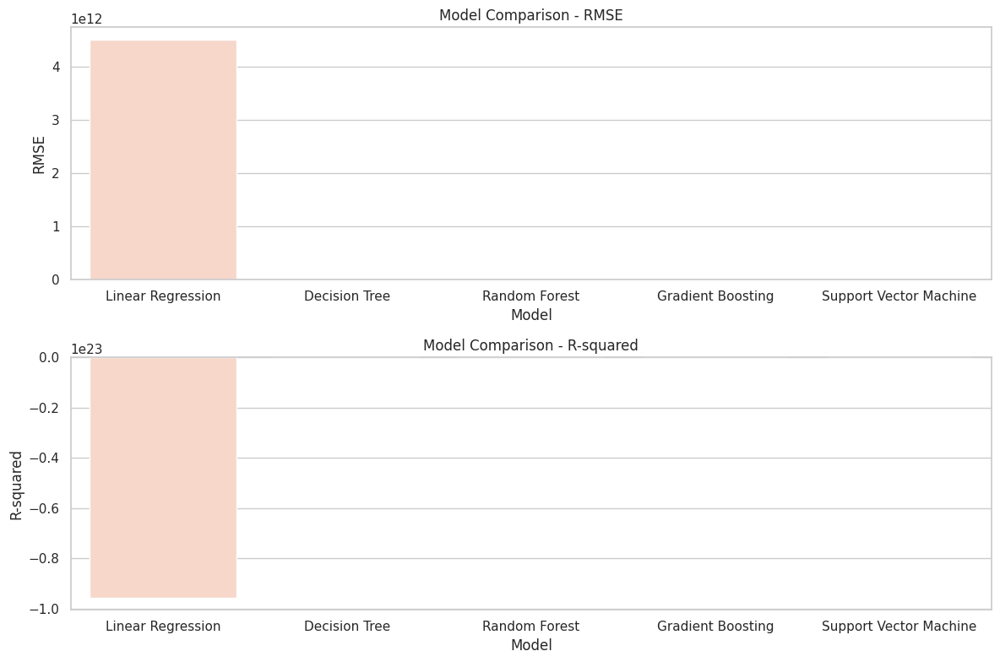

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

# Load the dataset
file_path = '446_Rpt_AgencyDoc_Detail_Covid-19 screening.xlsx'
df2 = pd.read_excel(file_path)

# Drop the first row which is used as header and rename columns based on the first row
df2.columns = df2.iloc[0]
df2 = df2.drop(0)

# Reset the index
df2 = df2.reset_index(drop=True)

# Rename columns for easier access
df2.columns = [
    'Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race', 'Ethnicity',
    'Gender', 'Document_Date', 'Document_Type', 'COVID_Symptoms', 'Close_Contact_with_COVID',
    'COVID_Quarantine', 'COVID_Test_Pending', 'COVID_Positive', 'COVID_Positive_Date',
    'COVID_Vaccine_Impacts', 'COVID_Vaccine_Impacts_Explanation', 'COVID_Vaccine_Source',
    'COVID_Vaccine_Questions', 'COVID_Other_Questions', 'COVID_Access_Barriers',
    'COVID_Barrier_Explanation'
]

# Drop rows with all NaN values
df2 = df2.dropna(how='all')

# Convert relevant columns to appropriate data types
df2['Current_Age'] = pd.to_numeric(df2['Current_Age'], errors='coerce')
df2['Document_Date'] = pd.to_datetime(df2['Document_Date'], errors='coerce')

# Select features and target variable
features = df2[['Gender', 'Race', 'COVID_Positive', 'COVID_Symptoms', 'Document_Type', 'State']]
target = df2['Current_Age']

# One-hot encode categorical variables
features = pd.get_dummies(features, drop_first=True)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.3, random_state=42)

# Initialize models
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
    'Support Vector Machine': SVR()
}

# Train models and evaluate performance
results = []
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    r2 = r2_score(y_test, y_pred)
    results.append((name, rmse, r2))

# Convert results to a DataFrame
results_df = pd.DataFrame(results, columns=['Model', 'RMSE', 'R-squared'])

# Display the results
print(results_df)

# Plotting the performance comparison

# Set up the figure
plt.figure(figsize=(12, 8))

# Define a red color palette
red_palette = sns.color_palette("Reds", n_colors=len(results_df))

# Plot RMSE values
plt.subplot(2, 1, 1)
sns.barplot(x='Model', y='RMSE', data=results_df, palette=red_palette)
plt.title('Model Comparison - RMSE')
plt.xlabel('Model')
plt.ylabel('RMSE')

# Plot R-squared values
plt.subplot(2, 1, 2)
sns.barplot(x='Model', y='R-squared', data=results_df, palette=red_palette)
plt.title('Model Comparison - R-squared')
plt.xlabel('Model')
plt.ylabel('R-squared')

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
# Define the features and the target variable for regression
target_column_regression = 'Current_Age'
date_column = 'Document_Date'
X = df2.drop([target_column_regression, date_column], axis=1)
y = df2[target_column_regression]

# One-hot encode categorical variables
X = pd.get_dummies(X, drop_first=True)

# Split the dataset into training and test sets again for regression
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Linear Regression
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)
y_pred_lin_reg = lin_reg.predict(X_test)
print("Linear Regression:\n", mean_squared_error(y_test, y_pred_lin_reg), r2_score(y_test, y_pred_lin_reg))

# Ridge Regression
ridge_reg = Ridge()
ridge_reg.fit(X_train, y_train)
y_pred_ridge_reg = ridge_reg.predict(X_test)
print("Ridge Regression:\n", mean_squared_error(y_test, y_pred_ridge_reg), r2_score(y_test, y_pred_ridge_reg))

# Lasso Regression
lasso_reg = Lasso()
lasso_reg.fit(X_train, y_train)
y_pred_lasso_reg = lasso_reg.predict(X_test)
print("Lasso Regression:\n", mean_squared_error(y_test, y_pred_lasso_reg), r2_score(y_test, y_pred_lasso_reg))

# Decision Tree Regressor
dec_tree_reg = DecisionTreeRegressor()
dec_tree_reg.fit(X_train, y_train)
y_pred_dec_tree_reg = dec_tree_reg.predict(X_test)
print("Decision Tree Regressor:\n", mean_squared_error(y_test, y_pred_dec_tree_reg), r2_score(y_test, y_pred_dec_tree_reg))

# Random Forest Regressor
rand_forest_reg = RandomForestRegressor()
rand_forest_reg.fit(X_train, y_train)
y_pred_rand_forest_reg = rand_forest_reg.predict(X_test)
print("Random Forest Regressor:\n", mean_squared_error(y_test, y_pred_rand_forest_reg), r2_score(y_test, y_pred_rand_forest_reg))

# Gradient Boosting Regressor
grad_boost_reg = GradientBoostingRegressor()
grad_boost_reg.fit(X_train, y_train)
y_pred_grad_boost_reg = grad_boost_reg.predict(X_test)
print("Gradient Boosting Regressor:\n", mean_squared_error(y_test, y_pred_grad_boost_reg), r2_score(y_test, y_pred_grad_boost_reg))


Linear Regression:
 232.95737223762842 -0.13592901548851422
Ridge Regression:
 226.61563361213385 -0.10500591207200016
Lasso Regression:
 206.7992264777142 -0.008378655203050256
Decision Tree Regressor:
 404.03370786516854 -0.9701184280671689
Random Forest Regressor:
 242.46904943820223 -0.18230913222107725
Gradient Boosting Regressor:
 216.6879782198409 -0.056597434127917845


Lasso Regression and Gradient Boosting Regressor are the best-performing models among those tested, as they have the lowest MSE and the least negative R² values.
Decision Tree Regressor performs the worst, likely due to overfitting.
Random Forest Regressor and Ridge Regression show intermediate performance but still have negative R² values, indicating room for improvement.

#DATASET 3

               Model       RMSE  R-squared
0  Linear Regression   6.195662   0.808513
1   Ridge Regression   6.724265   0.774445
2   Lasso Regression  14.170204  -0.001648
3      Decision Tree   9.554573   0.544608
4      Random Forest   7.504574   0.719059
5  Gradient Boosting  11.818029   0.303288


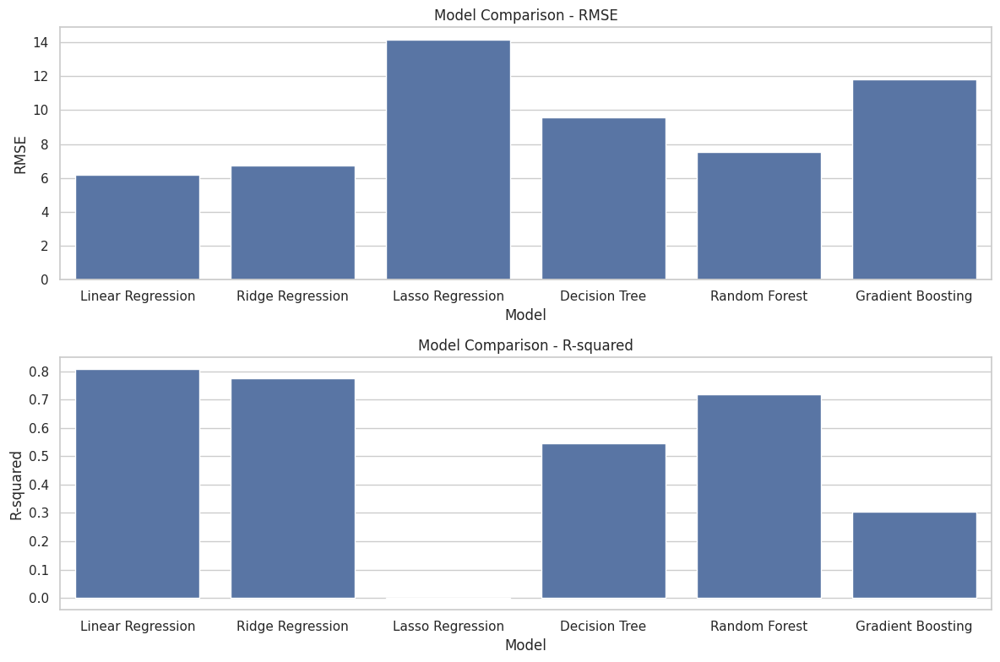

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Load the new dataset
file_path = '3950_Rpt_AgencyDoc_Detail PHQ9 depression Questionnaire.xlsx'
df3 = pd.read_excel(file_path)

# Drop the first row which is used as header and rename columns based on the first row
df3.columns = df3.iloc[0]
df3 = df3.drop(0)

# Reset the index
df3 = df3.reset_index(drop=True)

# Rename columns for easier access
df3.columns = [
    'Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race', 'Ethnicity',
    'Gender', 'Document_Date', 'Document_Type', 'PHQ9_Q1', 'PHQ9_Q2',
    'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7', 'PHQ9_Q8',
    'PHQ9_Q9', 'Difficulty_Level'
]

# Drop rows with all NaN values
df3 = df3.dropna(how='all')

# Convert relevant columns to appropriate data types
df3['Current_Age'] = pd.to_numeric(df3['Current_Age'], errors='coerce')
df3['Document_Date'] = pd.to_datetime(df3['Document_Date'], errors='coerce')

# Define the features and the target variable for regression
target_column_regression = 'Current_Age'
date_column = 'Document_Date'
X = df3.drop([target_column_regression, date_column], axis=1)
y = df3[target_column_regression]

# One-hot encode categorical variables
X = pd.get_dummies(X, drop_first=True)

# Split the dataset into training and test sets again for regression
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize models
models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(),
    'Lasso Regression': Lasso(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42)
}

# Train models and evaluate performance
results = []
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    r2 = r2_score(y_test, y_pred)
    results.append((name, rmse, r2))

# Convert results to a DataFrame
results_df = pd.DataFrame(results, columns=['Model', 'RMSE', 'R-squared'])

# Display the results
print(results_df)

# Plotting the performance comparison
plt.figure(figsize=(12, 8))

# Plot RMSE values
plt.subplot(2, 1, 1)
sns.barplot(x='Model', y='RMSE', data=results_df)
plt.title('Model Comparison - RMSE')
plt.xlabel('Model')
plt.ylabel('RMSE')

# Plot R-squared values
plt.subplot(2, 1, 2)
sns.barplot(x='Model', y='R-squared', data=results_df)
plt.title('Model Comparison - R-squared')
plt.xlabel('Model')
plt.ylabel('R-squared')

# Adjust layout
plt.tight_layout()
plt.show()


               Model       RMSE  R-squared
0  Linear Regression   6.195662   0.808513
1   Ridge Regression   6.724265   0.774445
2   Lasso Regression  14.170204  -0.001648
3      Decision Tree   9.554573   0.544608
4      Random Forest   7.504574   0.719059
5  Gradient Boosting  11.818029   0.303288


<ipython-input-27-af695118f06d>:81: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='RMSE', data=results_df, palette=palette)
<ipython-input-27-af695118f06d>:88: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='R-squared', data=results_df, palette=palette)


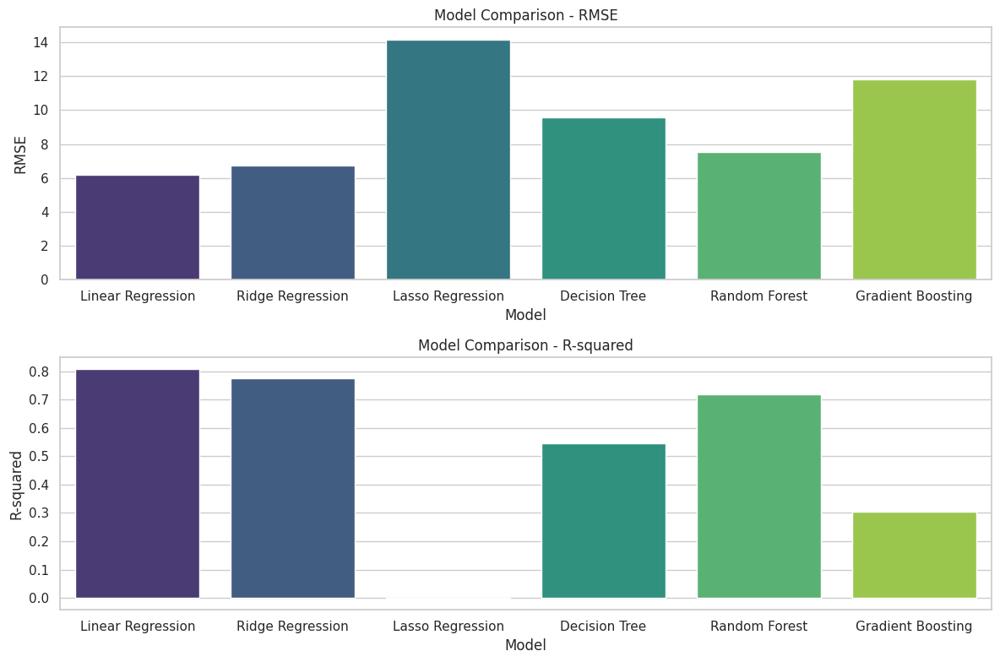

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Load the new dataset
file_path = '3950_Rpt_AgencyDoc_Detail PHQ9 depression Questionnaire.xlsx'
df3 = pd.read_excel(file_path)

# Drop the first row which is used as header and rename columns based on the first row
df3.columns = df3.iloc[0]
df3 = df3.drop(0)

# Reset the index
df3 = df3.reset_index(drop=True)

# Rename columns for easier access
df3.columns = [
    'Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race', 'Ethnicity',
    'Gender', 'Document_Date', 'Document_Type', 'PHQ9_Q1', 'PHQ9_Q2',
    'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7', 'PHQ9_Q8',
    'PHQ9_Q9', 'Difficulty_Level'
]

# Drop rows with all NaN values
df3 = df3.dropna(how='all')

# Convert relevant columns to appropriate data types
df3['Current_Age'] = pd.to_numeric(df3['Current_Age'], errors='coerce')
df3['Document_Date'] = pd.to_datetime(df3['Document_Date'], errors='coerce')

# Define the features and the target variable for regression
target_column_regression = 'Current_Age'
date_column = 'Document_Date'
X = df3.drop([target_column_regression, date_column], axis=1)
y = df3[target_column_regression]

# One-hot encode categorical variables
X = pd.get_dummies(X, drop_first=True)

# Split the dataset into training and test sets again for regression
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize models
models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(),
    'Lasso Regression': Lasso(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42)
}

# Train models and evaluate performance
results = []
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    r2 = r2_score(y_test, y_pred)
    results.append((name, rmse, r2))

# Convert results to a DataFrame
results_df = pd.DataFrame(results, columns=['Model', 'RMSE', 'R-squared'])

# Display the results
print(results_df)

# Plotting the performance comparison
plt.figure(figsize=(12, 8))

# Set the color palette
palette = sns.color_palette("viridis", n_colors=len(results_df))

# Plot RMSE values
plt.subplot(2, 1, 1)
sns.barplot(x='Model', y='RMSE', data=results_df, palette=palette)
plt.title('Model Comparison - RMSE')
plt.xlabel('Model')
plt.ylabel('RMSE')

# Plot R-squared values
plt.subplot(2, 1, 2)
sns.barplot(x='Model', y='R-squared', data=results_df, palette=palette)
plt.title('Model Comparison - R-squared')
plt.xlabel('Model')
plt.ylabel('R-squared')

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
df3.columns

Index(['Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race',
       'Ethnicity', 'Gender', 'Document_Date', 'Document_Type', 'PHQ9_Q1',
       'PHQ9_Q2', 'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7',
       'PHQ9_Q8', 'PHQ9_Q9', 'Difficulty_Level'],
      dtype='object')

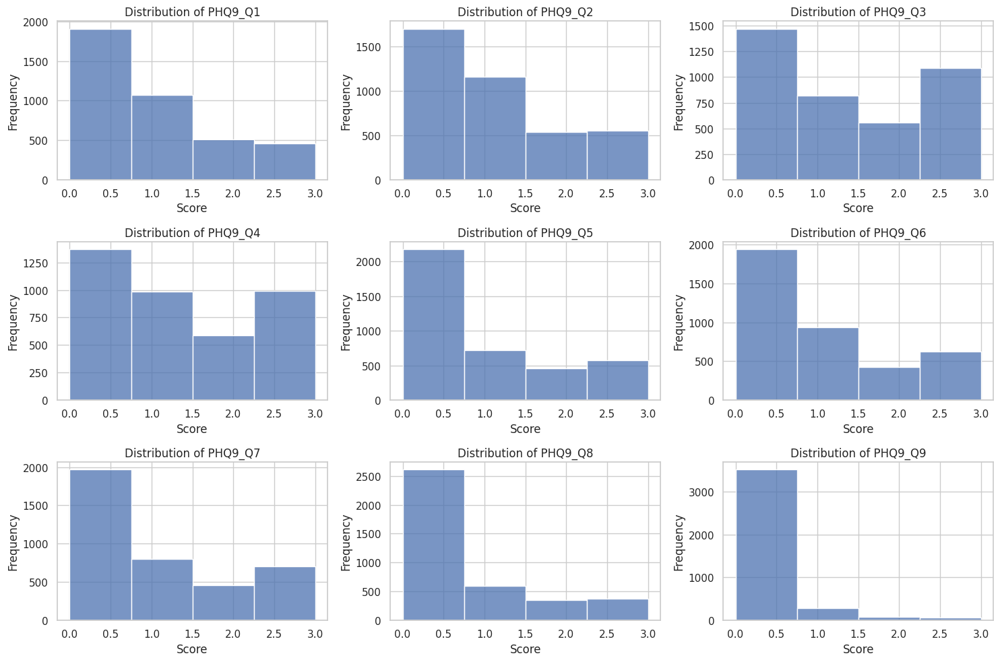

In [ ]:
# Correct the renaming of columns based on the observed structure
df3.columns = [
    'Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race', 'Ethnicity',
    'Gender', 'Document_Date', 'Document_Type', 'PHQ9_Q1', 'PHQ9_Q2',
    'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7', 'PHQ9_Q8',
    'PHQ9_Q9', 'Difficulty_Level'
]

# Convert PHQ-9 columns to numeric values, extracting scores from strings like "Nearly every day [3]"
phq9_columns = ['PHQ9_Q1', 'PHQ9_Q2', 'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7', 'PHQ9_Q8', 'PHQ9_Q9']
for col in phq9_columns:
    df3[col] = df3[col].str.extract('(\d+)', expand=False).astype(float)



# Visualize the distribution of PHQ-9 scores
plt.figure(figsize=(15, 10))
for i, col in enumerate(phq9_columns, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df3[col].dropna(), bins=4, kde=False)
    plt.title(f'Distribution of {col}')
    plt.xlabel('Score')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


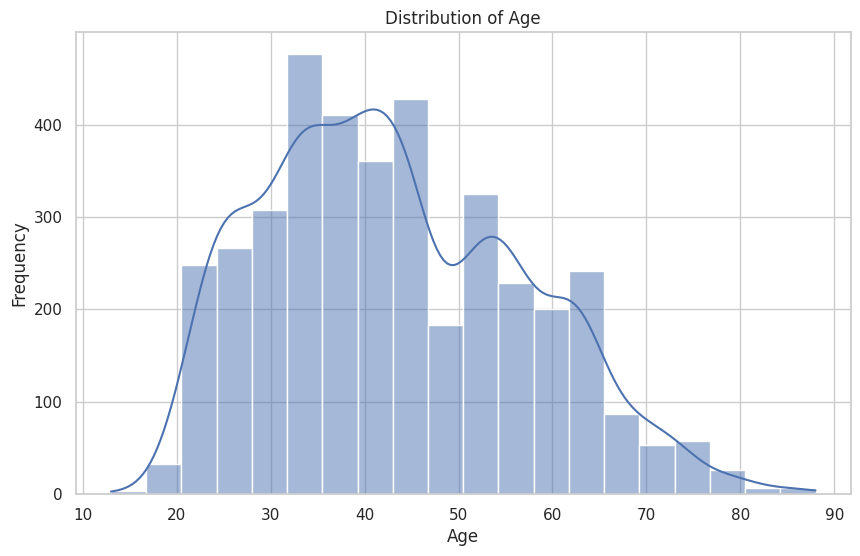

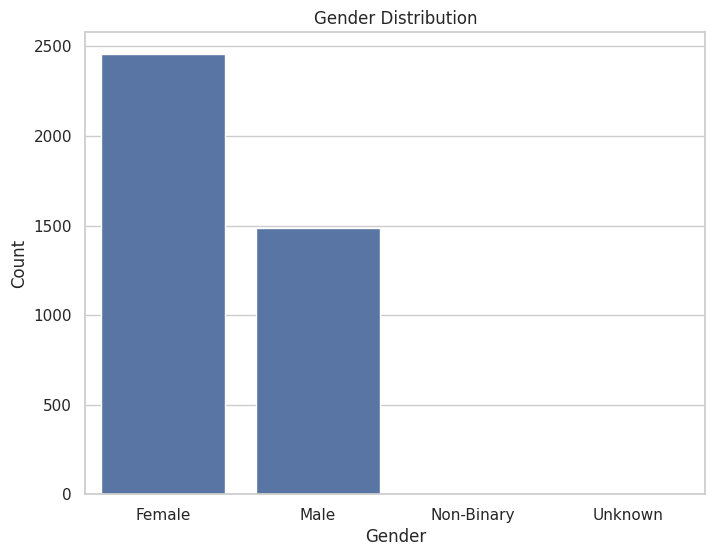

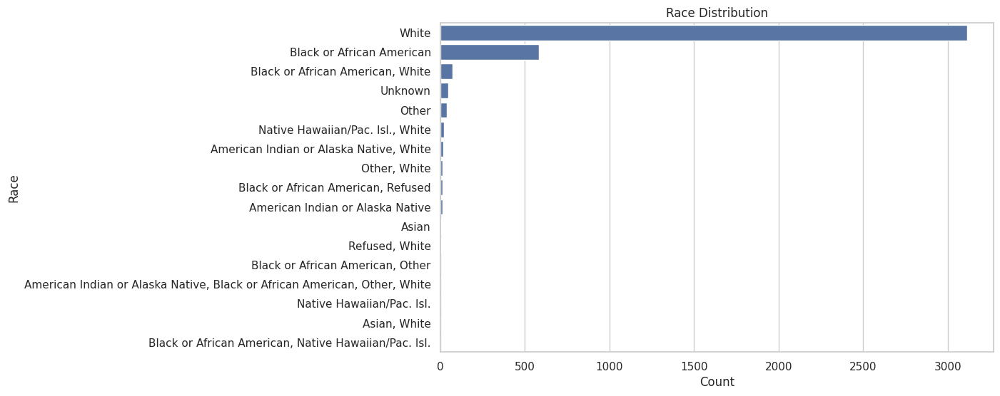

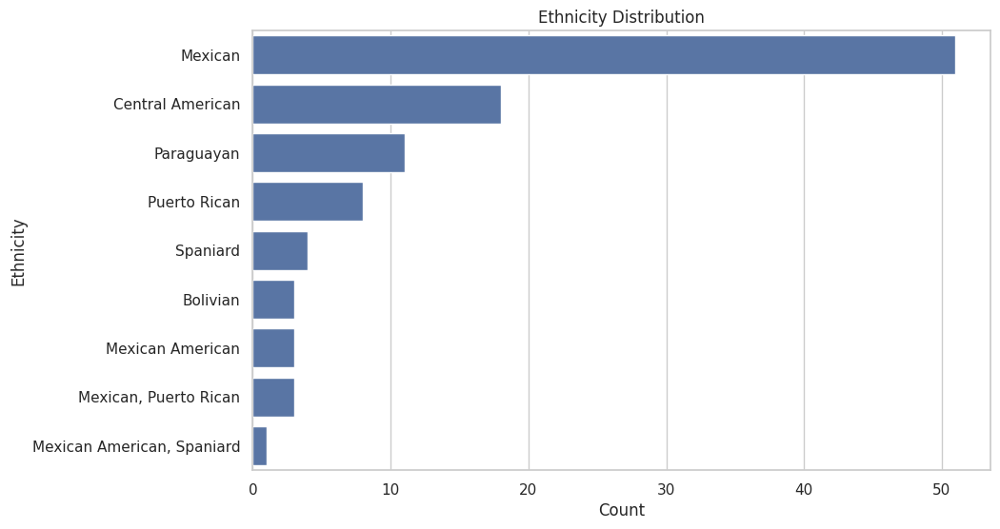

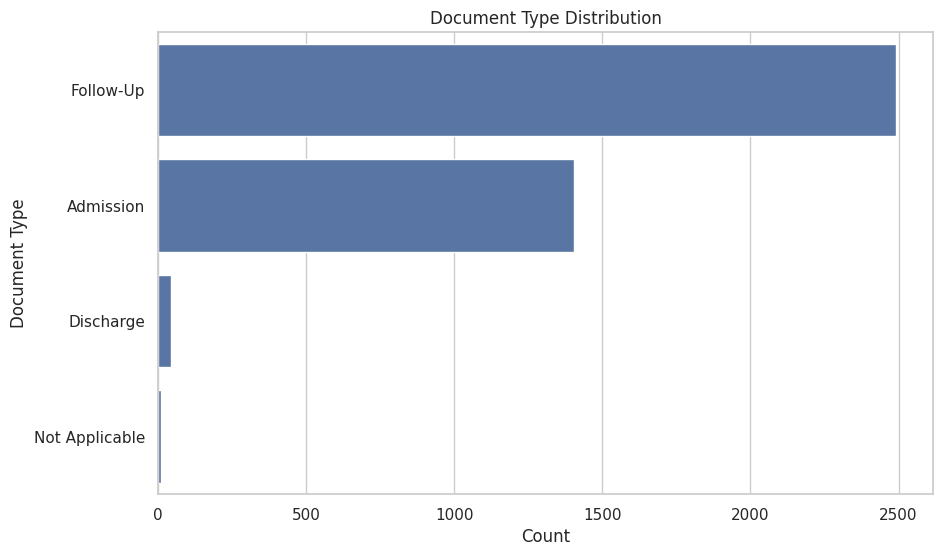

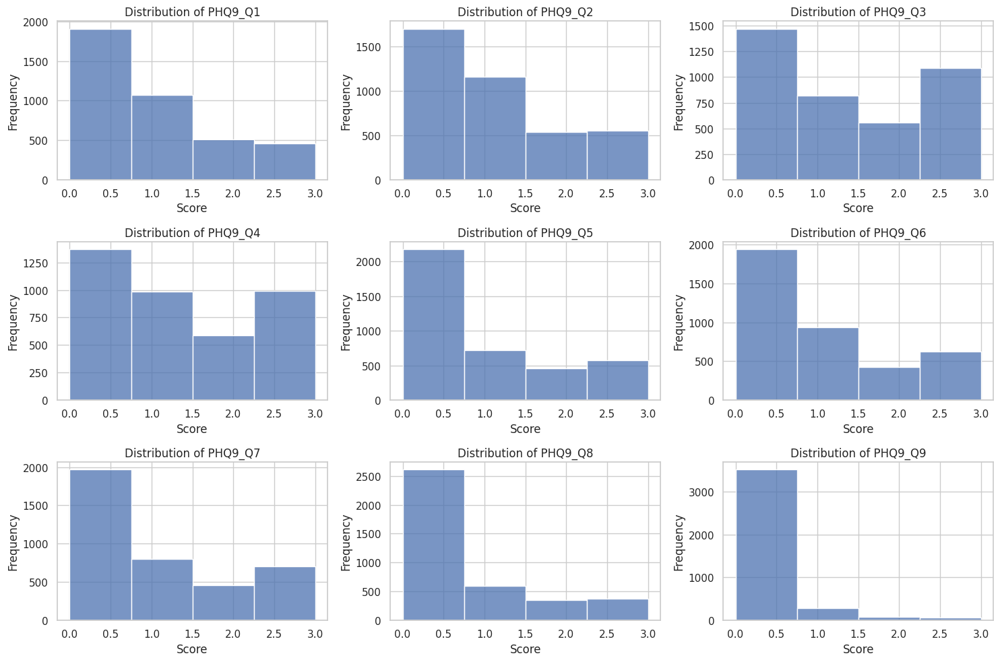

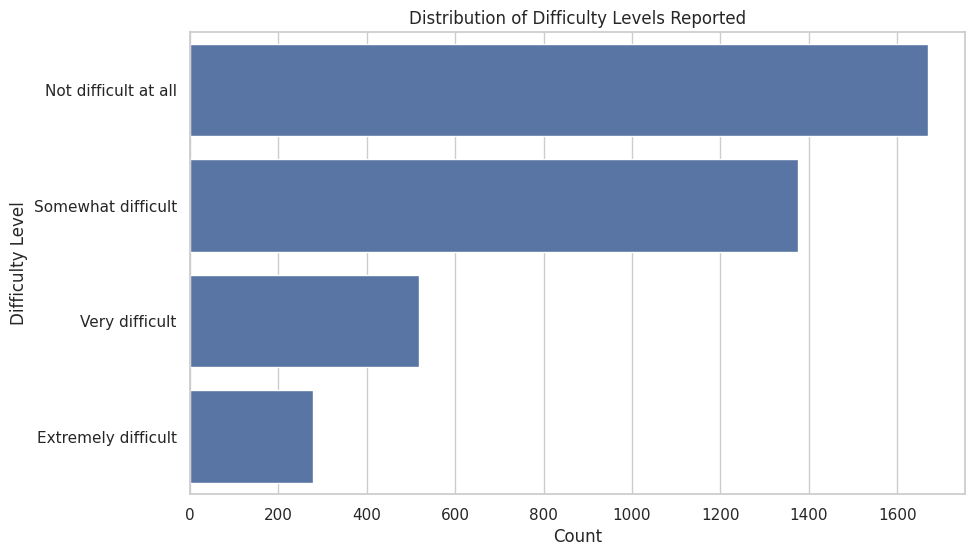

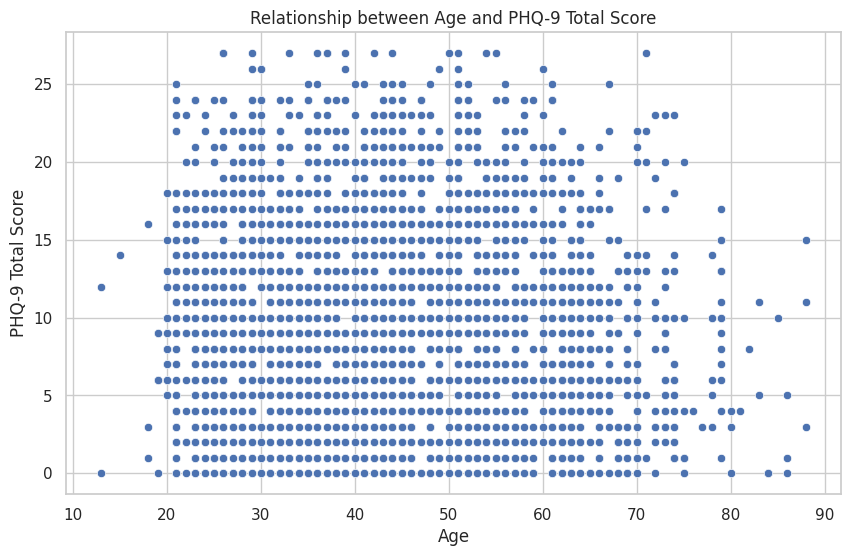

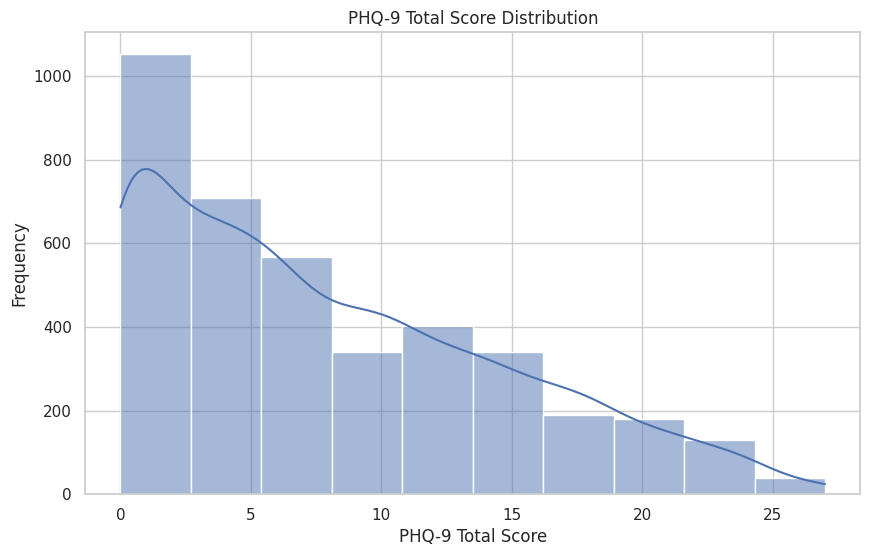

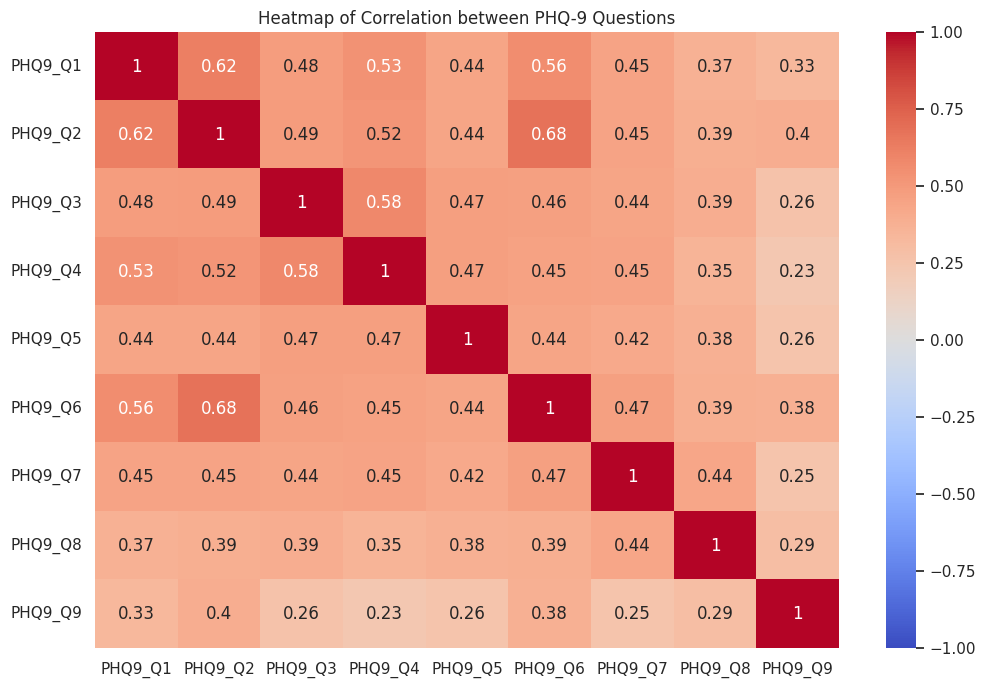

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the new dataset
file_path = '3950_Rpt_AgencyDoc_Detail PHQ9 depression Questionnaire.xlsx'
df3 = pd.read_excel(file_path)

# Drop the first row which is used as header and rename columns based on the first row
df3.columns = df3.iloc[0]
df3 = df3.drop(0)

# Reset the index
df3 = df3.reset_index(drop=True)

# Rename columns for easier access
df3.columns = [
    'Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race', 'Ethnicity',
    'Gender', 'Document_Date', 'Document_Type', 'PHQ9_Q1', 'PHQ9_Q2',
    'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7', 'PHQ9_Q8',
    'PHQ9_Q9', 'Difficulty_Level'
]

# Drop rows with all NaN values
df3 = df3.dropna(how='all')

# Convert relevant columns to appropriate data types
df3['Current_Age'] = pd.to_numeric(df3['Current_Age'], errors='coerce')
df3['Document_Date'] = pd.to_datetime(df3['Document_Date'], errors='coerce')

# Convert PHQ-9 columns to numeric values, extracting scores from strings like "Nearly every day [3]"
phq9_columns = ['PHQ9_Q1', 'PHQ9_Q2', 'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7', 'PHQ9_Q8', 'PHQ9_Q9']
for col in phq9_columns:
    df3[col] = df3[col].str.extract('(\d+)', expand=False).astype(float)

# 1. Distribution of Age
plt.figure(figsize=(10, 6))
sns.histplot(df3['Current_Age'].dropna(), kde=True, bins=20)
plt.title('Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

# 2. Gender Distribution
plt.figure(figsize=(8, 6))
sns.countplot(x='Gender', data=df3)
plt.title('Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()

# 3. Race Distribution
plt.figure(figsize=(10, 6))
sns.countplot(y='Race', data=df3, order=df3['Race'].value_counts().index)
plt.title('Race Distribution')
plt.xlabel('Count')
plt.ylabel('Race')
plt.show()

# 4. Ethnicity Distribution
plt.figure(figsize=(10, 6))
sns.countplot(y='Ethnicity', data=df3, order=df3['Ethnicity'].value_counts().index)
plt.title('Ethnicity Distribution')
plt.xlabel('Count')
plt.ylabel('Ethnicity')
plt.show()

# 5. Document Type Distribution
plt.figure(figsize=(10, 6))
sns.countplot(y='Document_Type', data=df3, order=df3['Document_Type'].value_counts().index)
plt.title('Document Type Distribution')
plt.xlabel('Count')
plt.ylabel('Document Type')
plt.show()

# 6. PHQ-9 Scores Distribution for Each Question
plt.figure(figsize=(15, 10))
for i, col in enumerate(phq9_columns, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df3[col].dropna(), bins=4, kde=False)
    plt.title(f'Distribution of {col}')
    plt.xlabel('Score')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# 7. Distribution of Difficulty Levels Reported
plt.figure(figsize=(10, 6))
sns.countplot(y='Difficulty_Level', data=df3, order=df3['Difficulty_Level'].value_counts().index)
plt.title('Distribution of Difficulty Levels Reported')
plt.xlabel('Count')
plt.ylabel('Difficulty Level')
plt.show()

# Calculate total PHQ-9 score
df3['PHQ9_Total_Score'] = df3[phq9_columns].sum(axis=1)

# 8. Relationship between Age and PHQ-9 Total Score
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Current_Age', y='PHQ9_Total_Score', data=df3)
plt.title('Relationship between Age and PHQ-9 Total Score')
plt.xlabel('Age')
plt.ylabel('PHQ-9 Total Score')
plt.show()

# 9. PHQ-9 Total Score Distribution
plt.figure(figsize=(10, 6))
sns.histplot(df3['PHQ9_Total_Score'].dropna(), bins=10, kde=True)
plt.title('PHQ-9 Total Score Distribution')
plt.xlabel('PHQ-9 Total Score')
plt.ylabel('Frequency')
plt.show()

# 10. Heatmap of Correlation between PHQ-9 Questions
plt.figure(figsize=(12, 8))
correlation_matrix = df3[phq9_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Heatmap of Correlation between PHQ-9 Questions')
plt.show()


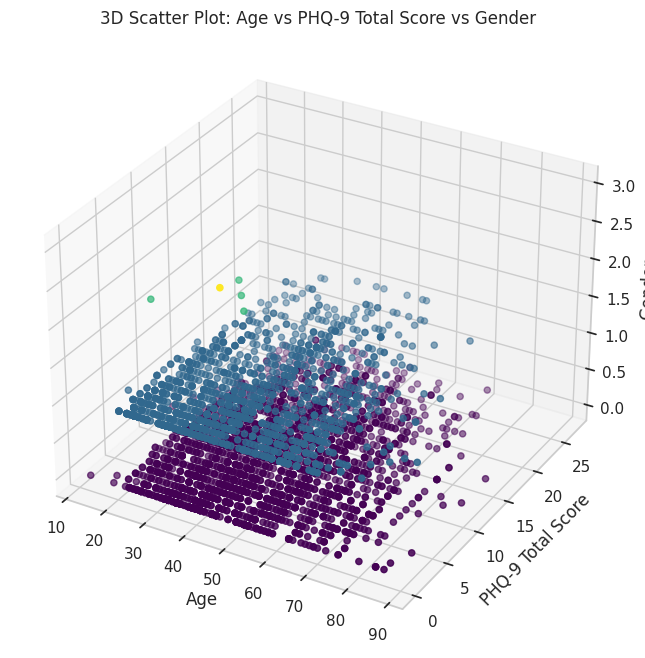

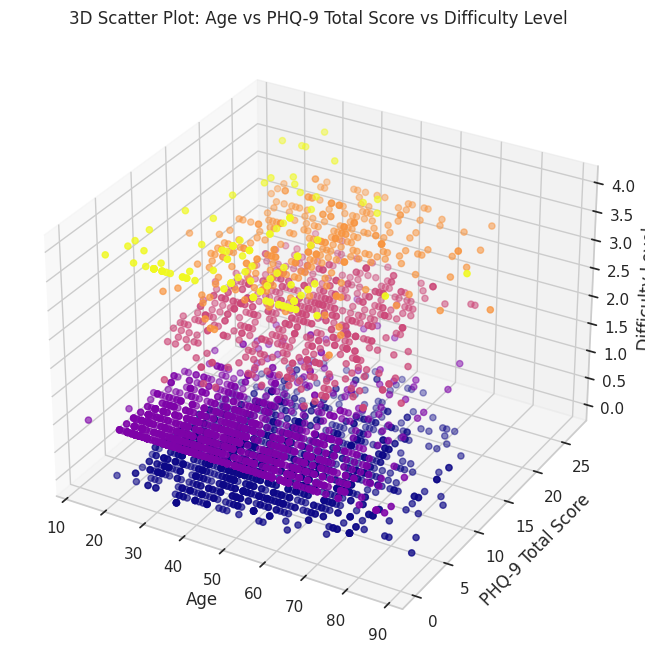

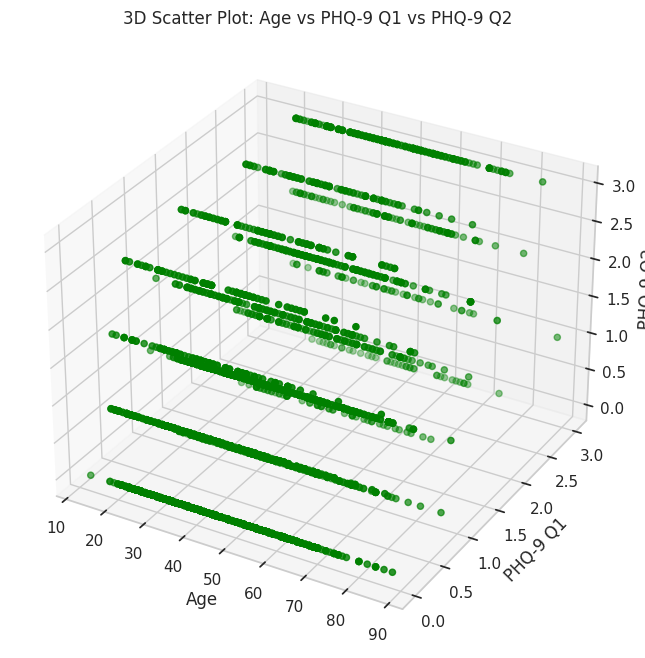

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Load the new dataset
file_path = '3950_Rpt_AgencyDoc_Detail PHQ9 depression Questionnaire.xlsx'
df3 = pd.read_excel(file_path)

# Drop the first row which is used as header and rename columns based on the first row
df3.columns = df3.iloc[0]
df3 = df3.drop(0)

# Reset the index
df3 = df3.reset_index(drop=True)

# Rename columns for easier access
df3.columns = [
    'Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race', 'Ethnicity',
    'Gender', 'Document_Date', 'Document_Type', 'PHQ9_Q1', 'PHQ9_Q2',
    'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7', 'PHQ9_Q8',
    'PHQ9_Q9', 'Difficulty_Level'
]

# Drop rows with all NaN values
df3 = df3.dropna(how='all')

# Convert relevant columns to appropriate data types
df3['Current_Age'] = pd.to_numeric(df3['Current_Age'], errors='coerce')
df3['Document_Date'] = pd.to_datetime(df3['Document_Date'], errors='coerce')

# Convert PHQ-9 columns to numeric values, extracting scores from strings like "Nearly every day [3]"
phq9_columns = ['PHQ9_Q1', 'PHQ9_Q2', 'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7', 'PHQ9_Q8', 'PHQ9_Q9']
for col in phq9_columns:
    df3[col] = df3[col].str.extract('(\d+)', expand=False).astype(float)

# Calculate total PHQ-9 score
df3['PHQ9_Total_Score'] = df3[phq9_columns].sum(axis=1)

# Encode Gender Numerically
label_encoder = LabelEncoder()
df3['Gender_Code'] = label_encoder.fit_transform(df3['Gender'])

# 1. 3D Scatter Plot: Age vs PHQ-9 Total Score vs Gender
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df3['Current_Age'], df3['PHQ9_Total_Score'], df3['Gender_Code'], c=df3['Gender_Code'], cmap='viridis')
ax.set_xlabel('Age')
ax.set_ylabel('PHQ-9 Total Score')
ax.set_zlabel('Gender')
plt.title('3D Scatter Plot: Age vs PHQ-9 Total Score vs Gender')
plt.show()

# 2. 3D Scatter Plot: Age vs PHQ-9 Total Score vs Difficulty Level
difficulty_levels = df3['Difficulty_Level'].unique()
difficulty_level_map = {level: idx for idx, level in enumerate(difficulty_levels)}
df3['Difficulty_Level_Code'] = df3['Difficulty_Level'].map(difficulty_level_map)

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df3['Current_Age'], df3['PHQ9_Total_Score'], df3['Difficulty_Level_Code'], c=df3['Difficulty_Level_Code'], cmap='plasma')
ax.set_xlabel('Age')
ax.set_ylabel('PHQ-9 Total Score')
ax.set_zlabel('Difficulty Level')
plt.title('3D Scatter Plot: Age vs PHQ-9 Total Score vs Difficulty Level')
plt.show()

# 3. 3D Scatter Plot: Age vs PHQ-9 Q1 vs PHQ-9 Q2
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df3['Current_Age'], df3['PHQ9_Q1'], df3['PHQ9_Q2'], c='green')
ax.set_xlabel('Age')
ax.set_ylabel('PHQ-9 Q1')
ax.set_zlabel('PHQ-9 Q2')
plt.title('3D Scatter Plot: Age vs PHQ-9 Q1 vs PHQ-9 Q2')
plt.show()


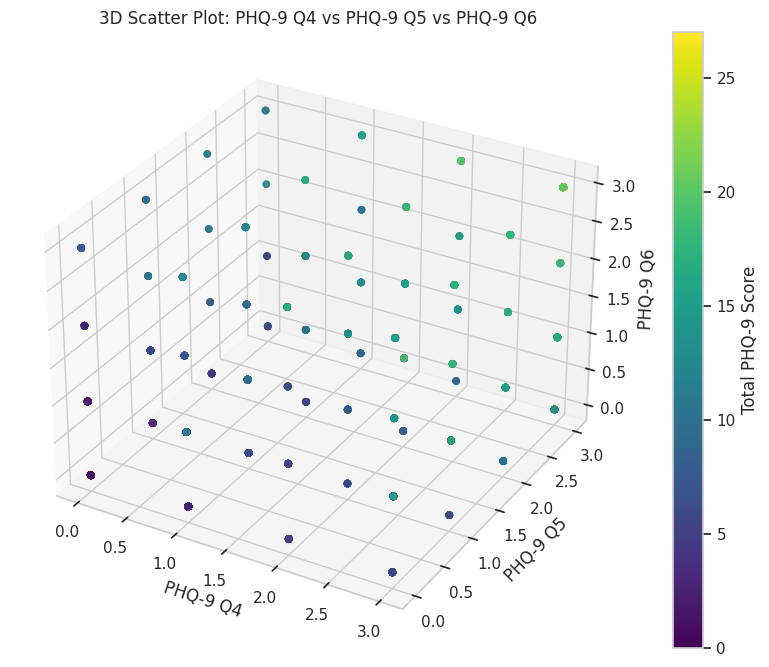

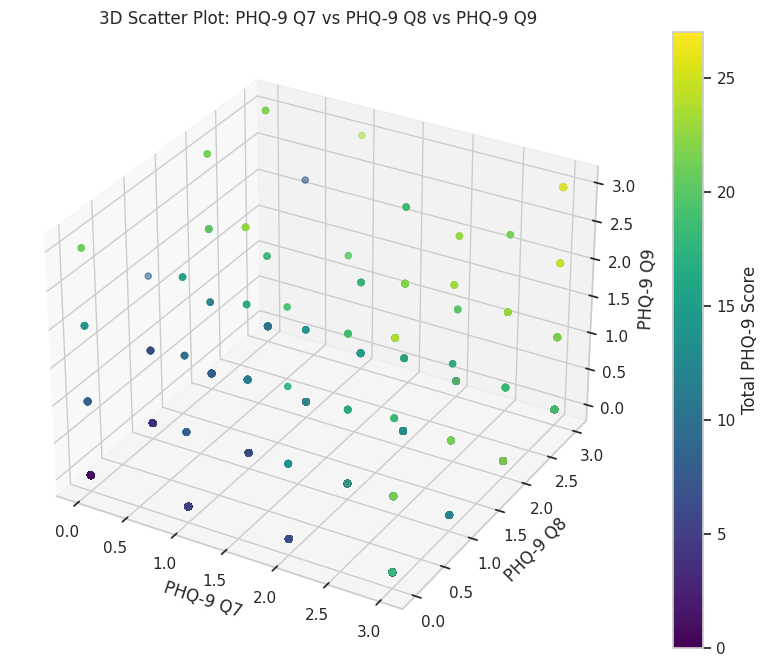

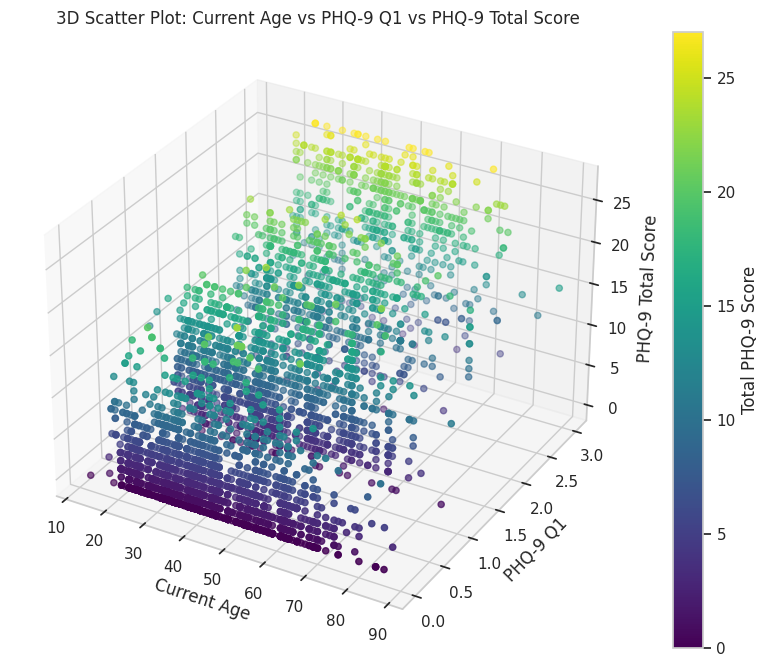

In [ ]:
# 3D Scatter Plot: PHQ-9 Q4 vs PHQ-9 Q5 vs PHQ-9 Q6
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df3['PHQ9_Q4'], df3['PHQ9_Q5'], df3['PHQ9_Q6'], c=df3['PHQ9_Total_Score'], cmap='viridis')
ax.set_xlabel('PHQ-9 Q4')
ax.set_ylabel('PHQ-9 Q5')
ax.set_zlabel('PHQ-9 Q6')
plt.title('3D Scatter Plot: PHQ-9 Q4 vs PHQ-9 Q5 vs PHQ-9 Q6')
plt.colorbar(ax.collections[0], ax=ax, label='Total PHQ-9 Score')
plt.show()

# 3D Scatter Plot: PHQ-9 Q7 vs PHQ-9 Q8 vs PHQ-9 Q9
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df3['PHQ9_Q7'], df3['PHQ9_Q8'], df3['PHQ9_Q9'], c=df3['PHQ9_Total_Score'], cmap='viridis')
ax.set_xlabel('PHQ-9 Q7')
ax.set_ylabel('PHQ-9 Q8')
ax.set_zlabel('PHQ-9 Q9')
plt.title('3D Scatter Plot: PHQ-9 Q7 vs PHQ-9 Q8 vs PHQ-9 Q9')
plt.colorbar(ax.collections[0], ax=ax, label='Total PHQ-9 Score')
plt.show()

# 3D Scatter Plot: Current Age vs PHQ-9 Q1 vs PHQ-9 Total Score
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df3['Current_Age'], df3['PHQ9_Q1'], df3['PHQ9_Total_Score'], c=df3['PHQ9_Total_Score'], cmap='viridis')
ax.set_xlabel('Current Age')
ax.set_ylabel('PHQ-9 Q1')
ax.set_zlabel('PHQ-9 Total Score')
plt.title('3D Scatter Plot: Current Age vs PHQ-9 Q1 vs PHQ-9 Total Score')
plt.colorbar(ax.collections[0], ax=ax, label='Total PHQ-9 Score')
plt.show()


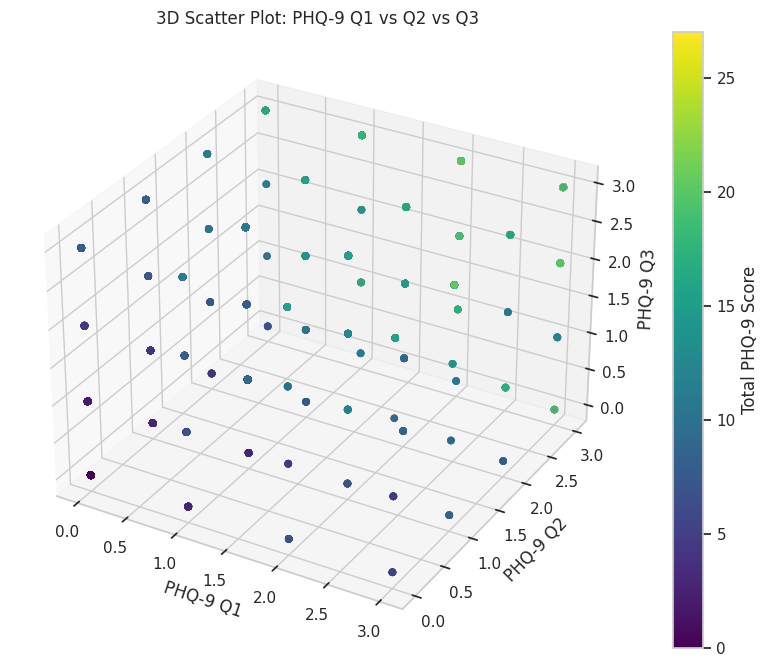

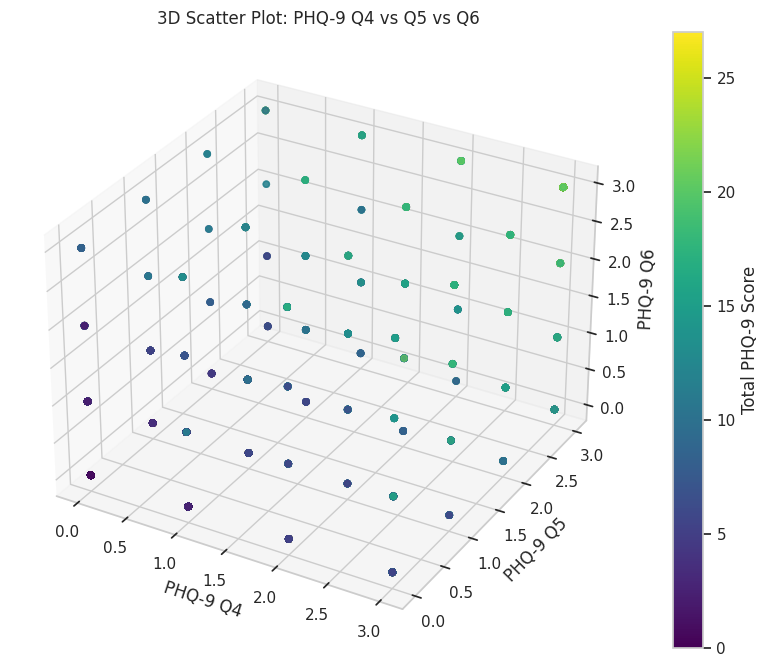

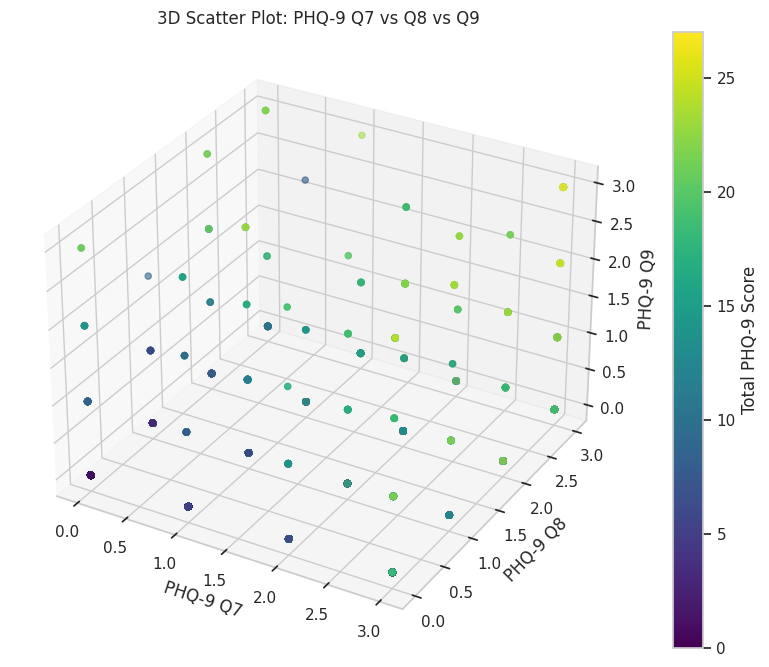

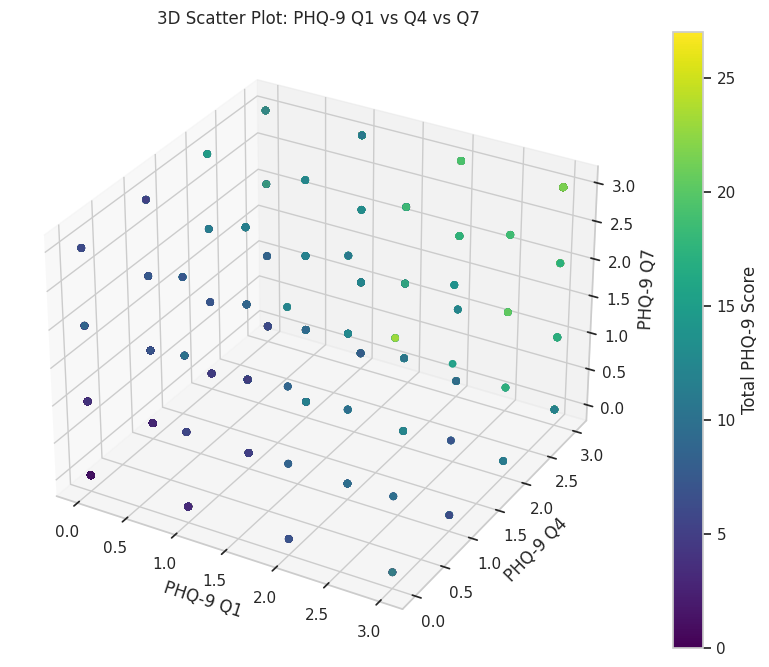

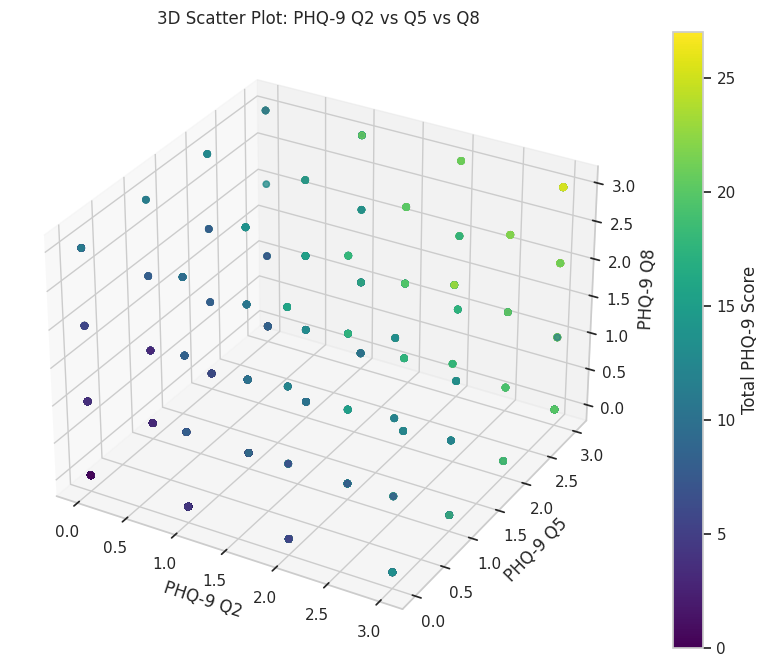

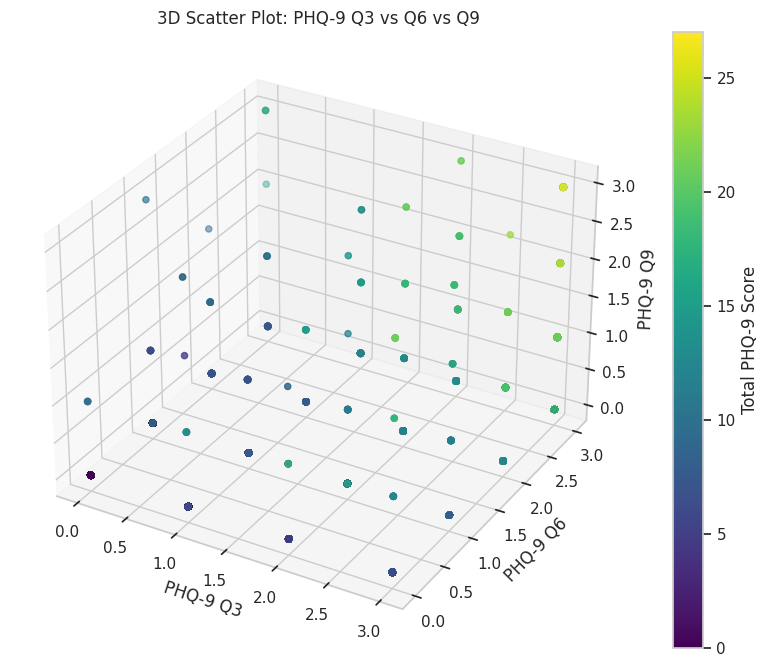

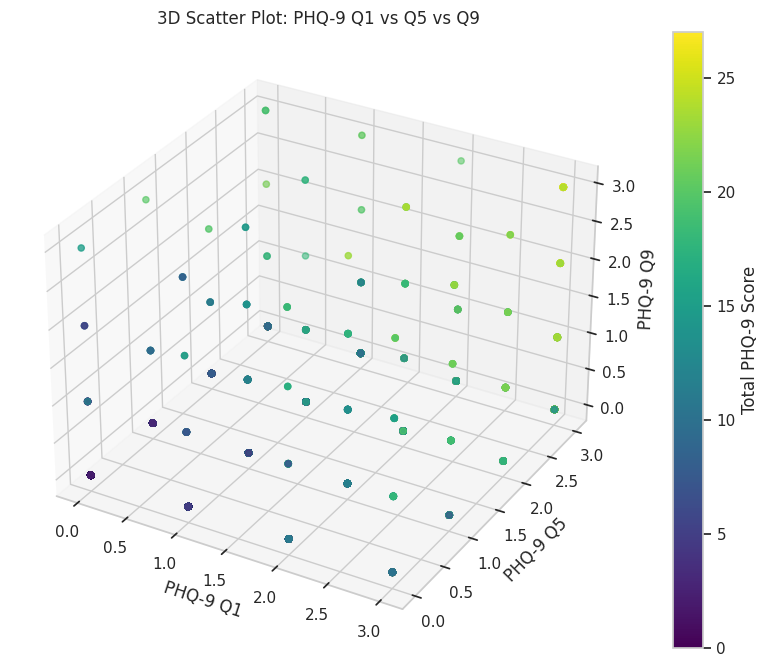

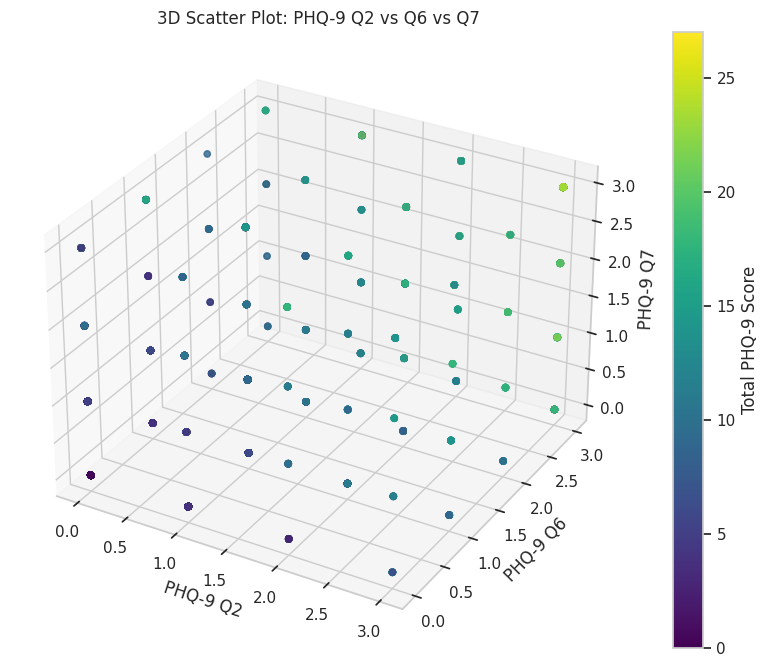

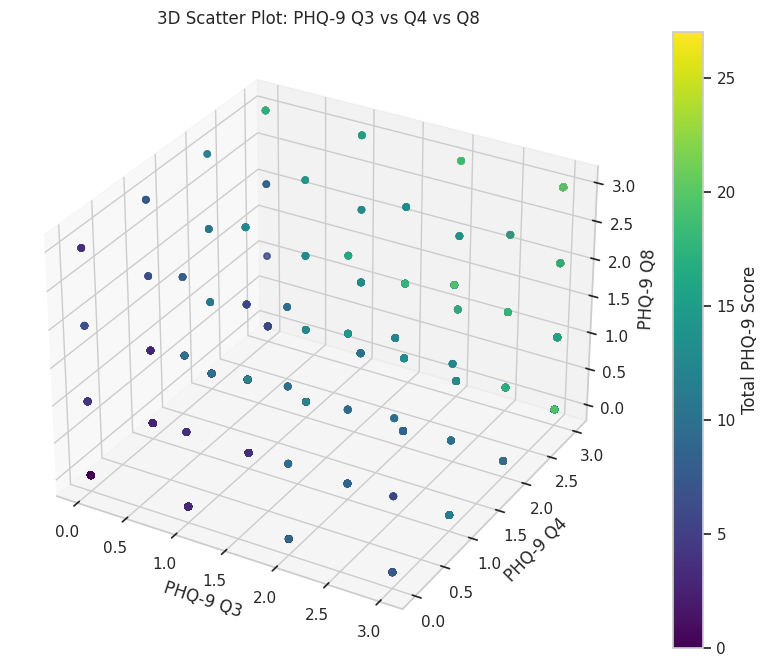

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import LabelEncoder

# Load the new dataset
file_path = '3950_Rpt_AgencyDoc_Detail PHQ9 depression Questionnaire.xlsx'
df3 = pd.read_excel(file_path)

# Drop the first row which is used as header and rename columns based on the first row
df3.columns = df3.iloc[0]
df3 = df3.drop(0)

# Reset the index
df3 = df3.reset_index(drop=True)

# Rename columns for easier access
df3.columns = [
    'Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race', 'Ethnicity',
    'Gender', 'Document_Date', 'Document_Type', 'PHQ9_Q1', 'PHQ9_Q2',
    'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7', 'PHQ9_Q8',
    'PHQ9_Q9', 'Difficulty_Level'
]

# Drop rows with all NaN values
df3 = df3.dropna(how='all')

# Convert relevant columns to appropriate data types
df3['Current_Age'] = pd.to_numeric(df3['Current_Age'], errors='coerce')
df3['Document_Date'] = pd.to_datetime(df3['Document_Date'], errors='coerce')

# Convert PHQ-9 columns to numeric values, extracting scores from strings like "Nearly every day [3]"
phq9_columns = ['PHQ9_Q1', 'PHQ9_Q2', 'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7', 'PHQ9_Q8', 'PHQ9_Q9']
for col in phq9_columns:
    df3[col] = df3[col].str.extract('(\d+)', expand=False).astype(float)

# Calculate total PHQ-9 score
df3['PHQ9_Total_Score'] = df3[phq9_columns].sum(axis=1)

# Function to create 3D scatter plot
def create_3d_scatter_plot(x, y, z, xlabel, ylabel, zlabel, title):
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    sc = ax.scatter(x, y, z, c=df3['PHQ9_Total_Score'], cmap='viridis')
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_zlabel(zlabel)
    plt.title(title)
    plt.colorbar(sc, ax=ax, label='Total PHQ-9 Score')
    plt.show()

# Create 3D scatter plots for all combinations of PHQ-9 questions
create_3d_scatter_plot(df3['PHQ9_Q1'], df3['PHQ9_Q2'], df3['PHQ9_Q3'], 'PHQ-9 Q1', 'PHQ-9 Q2', 'PHQ-9 Q3', '3D Scatter Plot: PHQ-9 Q1 vs Q2 vs Q3')
create_3d_scatter_plot(df3['PHQ9_Q4'], df3['PHQ9_Q5'], df3['PHQ9_Q6'], 'PHQ-9 Q4', 'PHQ-9 Q5', 'PHQ-9 Q6', '3D Scatter Plot: PHQ-9 Q4 vs Q5 vs Q6')
create_3d_scatter_plot(df3['PHQ9_Q7'], df3['PHQ9_Q8'], df3['PHQ9_Q9'], 'PHQ-9 Q7', 'PHQ-9 Q8', 'PHQ-9 Q9', '3D Scatter Plot: PHQ-9 Q7 vs Q8 vs Q9')
create_3d_scatter_plot(df3['PHQ9_Q1'], df3['PHQ9_Q4'], df3['PHQ9_Q7'], 'PHQ-9 Q1', 'PHQ-9 Q4', 'PHQ-9 Q7', '3D Scatter Plot: PHQ-9 Q1 vs Q4 vs Q7')
create_3d_scatter_plot(df3['PHQ9_Q2'], df3['PHQ9_Q5'], df3['PHQ9_Q8'], 'PHQ-9 Q2', 'PHQ-9 Q5', 'PHQ-9 Q8', '3D Scatter Plot: PHQ-9 Q2 vs Q5 vs Q8')
create_3d_scatter_plot(df3['PHQ9_Q3'], df3['PHQ9_Q6'], df3['PHQ9_Q9'], 'PHQ-9 Q3', 'PHQ-9 Q6', 'PHQ-9 Q9', '3D Scatter Plot: PHQ-9 Q3 vs Q6 vs Q9')
create_3d_scatter_plot(df3['PHQ9_Q1'], df3['PHQ9_Q5'], df3['PHQ9_Q9'], 'PHQ-9 Q1', 'PHQ-9 Q5', 'PHQ-9 Q9', '3D Scatter Plot: PHQ-9 Q1 vs Q5 vs Q9')
create_3d_scatter_plot(df3['PHQ9_Q2'], df3['PHQ9_Q6'], df3['PHQ9_Q7'], 'PHQ-9 Q2', 'PHQ-9 Q6', 'PHQ-9 Q7', '3D Scatter Plot: PHQ-9 Q2 vs Q6 vs Q7')
create_3d_scatter_plot(df3['PHQ9_Q3'], df3['PHQ9_Q4'], df3['PHQ9_Q8'], 'PHQ-9 Q3', 'PHQ-9 Q4', 'PHQ-9 Q8', '3D Scatter Plot: PHQ-9 Q3 vs Q4 vs Q8')


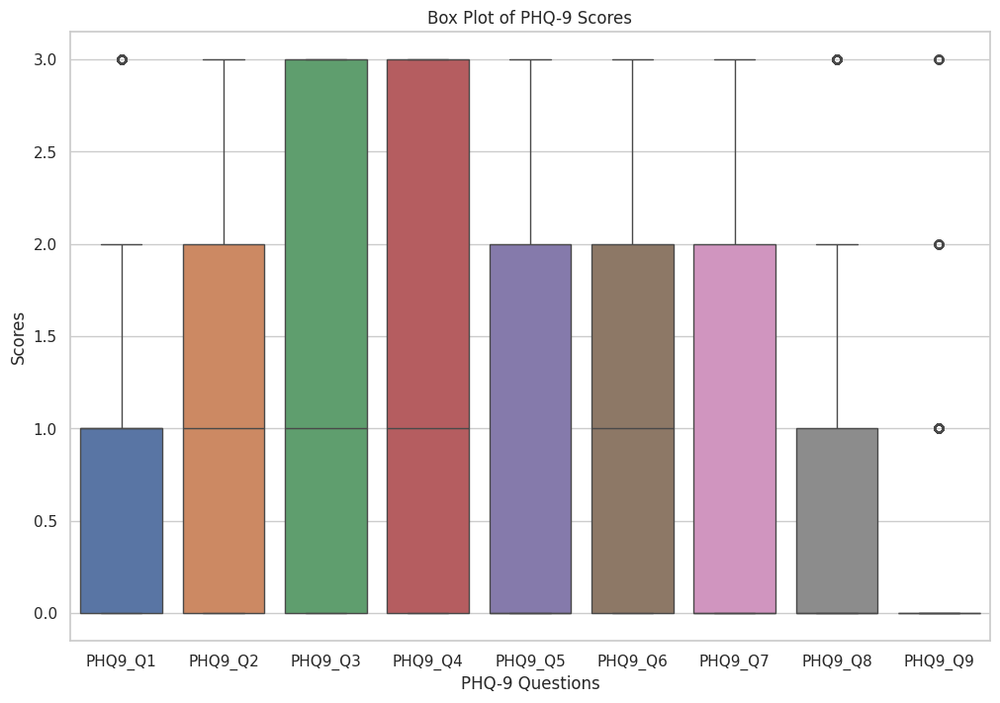

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the new dataset
file_path = '3950_Rpt_AgencyDoc_Detail PHQ9 depression Questionnaire.xlsx'
df3 = pd.read_excel(file_path)

# Drop the first row which is used as header and rename columns based on the first row
df3.columns = df3.iloc[0]
df3 = df3.drop(0)

# Reset the index
df3 = df3.reset_index(drop=True)

# Rename columns for easier access
df3.columns = [
    'Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race', 'Ethnicity',
    'Gender', 'Document_Date', 'Document_Type', 'PHQ9_Q1', 'PHQ9_Q2',
    'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7', 'PHQ9_Q8',
    'PHQ9_Q9', 'Difficulty_Level'
]

# Drop rows with all NaN values
df3 = df3.dropna(how='all')

# Convert relevant columns to appropriate data types
df3['Current_Age'] = pd.to_numeric(df3['Current_Age'], errors='coerce')
df3['Document_Date'] = pd.to_datetime(df3['Document_Date'], errors='coerce')

# Convert PHQ-9 columns to numeric values, extracting scores from strings like "Nearly every day [3]"
phq9_columns = ['PHQ9_Q1', 'PHQ9_Q2', 'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7', 'PHQ9_Q8', 'PHQ9_Q9']
for col in phq9_columns:
    df3[col] = df3[col].str.extract('(\d+)', expand=False).astype(float)

# Calculate total PHQ-9 score
df3['PHQ9_Total_Score'] = df3[phq9_columns].sum(axis=1)

# 1. Box Plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=df3[phq9_columns])
plt.title('Box Plot of PHQ-9 Scores')
plt.xlabel('PHQ-9 Questions')
plt.ylabel('Scores')
plt.show()

#COMPARISION

In [ ]:
df3.columns

Index(['Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race',
       'Ethnicity', 'Gender', 'Document_Date', 'Document_Type', 'PHQ9_Q1',
       'PHQ9_Q2', 'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7',
       'PHQ9_Q8', 'PHQ9_Q9', 'Difficulty_Level', 'PHQ9_Total_Score'],
      dtype='object')

In [ ]:
df2.columns


Index(['Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race',
       'Ethnicity', 'Gender', 'Document_Date', 'Document_Type',
       'COVID_Symptoms', 'Close_Contact_with_COVID', 'COVID_Quarantine',
       'COVID_Test_Pending', 'COVID_Positive', 'COVID_Positive_Date',
       'COVID_Vaccine_Impacts', 'COVID_Vaccine_Impacts_Explanation',
       'COVID_Vaccine_Source', 'COVID_Vaccine_Questions',
       'COVID_Other_Questions', 'COVID_Access_Barriers',
       'COVID_Barrier_Explanation'],
      dtype='object')

In [ ]:
df.columns

Index(['Client ID', 'Current Age', 'County  ', 'State', 'Zip Code', 'Race',
       'Ethnicity', 'Gender', 'Document Type',
       'Does the client get adequate income?', 'Is the client employed?',
       'Does the client have housing and is not at any immediate risk of losing the housing?',
       'Does the client have the means to acquire food and prepare it?',
       'Does the client have access to any form of child care? (Skip if no children of child care age)',
       'Is one or more of the eligible children enrolled in a school? (Skip if no children of school age)',
       'Does the client have a high school diploma or a GED?',
       'Does the client have any unresolved legal issues in the past 12 months?',
       'Does the client have medical insurance coverage?',
       'Can the client meet some basic living needs without any assistance?',
       'Does the client have mild or no mental health issues?',
       'Is the client seriously dependent on alcohol or drugs?',
       'Doe

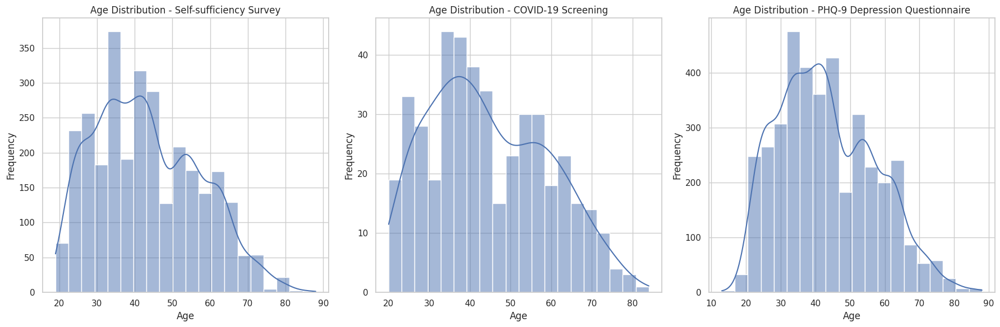

In [ ]:
plt.figure(figsize=(18, 6))

# Dataset 1: Self-sufficiency Survey
plt.subplot(1, 3, 1)
sns.histplot(df['Current Age'].dropna(), kde=True, bins=20)
plt.title('Age Distribution - Self-sufficiency Survey')
plt.xlabel('Age')
plt.ylabel('Frequency')

# Dataset 2: COVID-19 Screening
plt.subplot(1, 3, 2)
sns.histplot(df2['Current_Age'].dropna(), kde=True, bins=20)
plt.title('Age Distribution - COVID-19 Screening')
plt.xlabel('Age')
plt.ylabel('Frequency')

# Dataset 3: PHQ-9 Depression Questionnaire
plt.subplot(1, 3, 3)
sns.histplot(df3['Current_Age'].dropna(), kde=True, bins=20)
plt.title('Age Distribution - PHQ-9 Depression Questionnaire')
plt.xlabel('Age')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


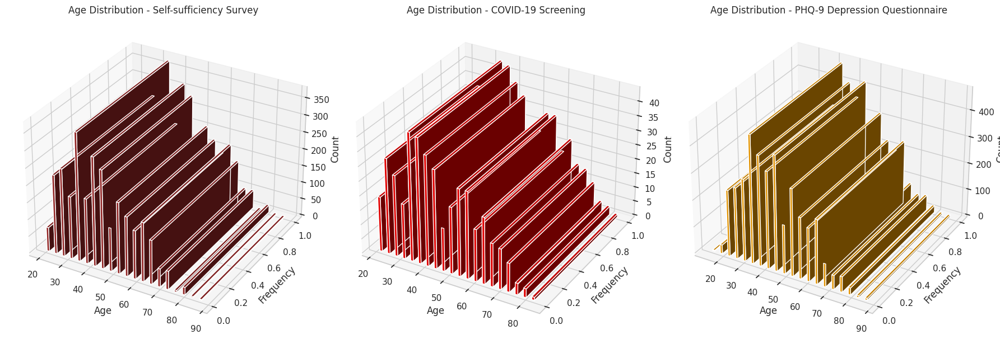

In [ ]:



import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import numpy as np

# Load the dataset
file_path = '3950_Rpt_AgencyDoc_Detail PHQ9 depression Questionnaire.xlsx'
df3 = pd.read_excel(file_path)

# Drop the first row which is used as header and rename columns based on the first row
df3.columns = df3.iloc[0]
df3 = df3.drop(0).reset_index(drop=True)

# Rename columns based on the observed structure
df3.columns = [
    'Client_ID', 'Current_Age', 'County', 'State', 'Zip_Code', 'Race', 'Ethnicity',
    'Gender', 'Document_Date', 'Document_Type', 'PHQ9_Q1', 'PHQ9_Q2', 'PHQ9_Q3', 'PHQ9_Q4',
    'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7', 'PHQ9_Q8', 'PHQ9_Q9', 'Difficulty_Level'
]

# Convert PHQ-9 columns to numeric values, extracting scores from strings like "Nearly every day [3]"
phq9_columns = [
    'PHQ9_Q1', 'PHQ9_Q2', 'PHQ9_Q3', 'PHQ9_Q4', 'PHQ9_Q5', 'PHQ9_Q6', 'PHQ9_Q7', 'PHQ9_Q8', 'PHQ9_Q9'
]
for col in phq9_columns:
    df3[col] = df3[col].astype(str).str.extract('(\d+)', expand=False).astype(float)

# Function to create 3D histogram
def create_3d_histogram(ax, data, title, color):
    hist, bins = np.histogram(data.dropna(), bins=20)
    x = (bins[:-1] + bins[1:]) / 2
    y = np.zeros_like(x)
    z = np.zeros_like(x)
    dx = dy = np.ones_like(x)
    dz = hist

    ax.bar3d(x, y, z, dx, dy, dz, color=color, zsort='average')
    ax.set_title(title)
    ax.set_xlabel('Age')
    ax.set_ylabel('Frequency')
    ax.set_zlabel('Count')

fig = plt.figure(figsize=(18, 6))

# Dataset 1: Self-sufficiency Survey
ax1 = fig.add_subplot(131, projection='3d')
create_3d_histogram(ax1, df['Current Age'], 'Age Distribution - Self-sufficiency Survey', 'brown')

# Dataset 2: COVID-19 Screening
ax2 = fig.add_subplot(132, projection='3d')
create_3d_histogram(ax2, df2['Current_Age'], 'Age Distribution - COVID-19 Screening', 'red')

# Dataset 3: PHQ-9 Depression Questionnaire
ax3 = fig.add_subplot(133, projection='3d')
create_3d_histogram(ax3, df3['Current_Age'], 'Age Distribution - PHQ-9 Depression Questionnaire', 'orange')

plt.tight_layout()
plt.show()


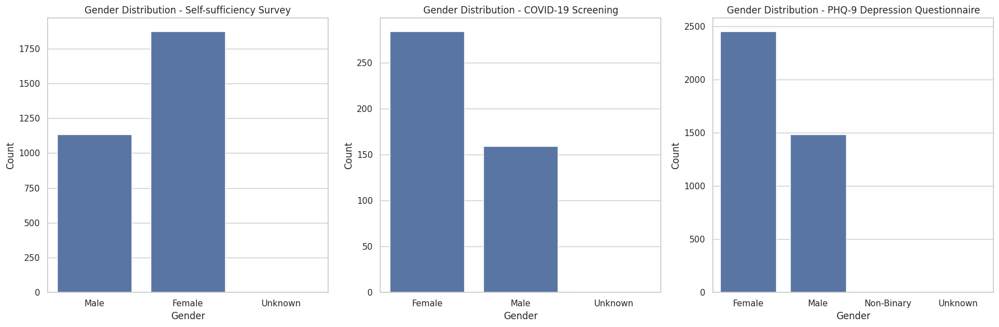

In [ ]:
plt.figure(figsize=(18, 6))

# Dataset 1: Self-sufficiency Survey
plt.subplot(1, 3, 1)
sns.countplot(x='Gender', data=df)
plt.title('Gender Distribution - Self-sufficiency Survey')
plt.xlabel('Gender')
plt.ylabel('Count')

# Dataset 2: COVID-19 Screening
plt.subplot(1, 3, 2)
sns.countplot(x='Gender', data=df2)
plt.title('Gender Distribution - COVID-19 Screening')
plt.xlabel('Gender')
plt.ylabel('Count')

# Dataset 3: PHQ-9 Depression Questionnaire
plt.subplot(1, 3, 3)
sns.countplot(x='Gender', data=df3)
plt.title('Gender Distribution - PHQ-9 Depression Questionnaire')
plt.xlabel('Gender')
plt.ylabel('Count')

plt.tight_layout()
plt.show()


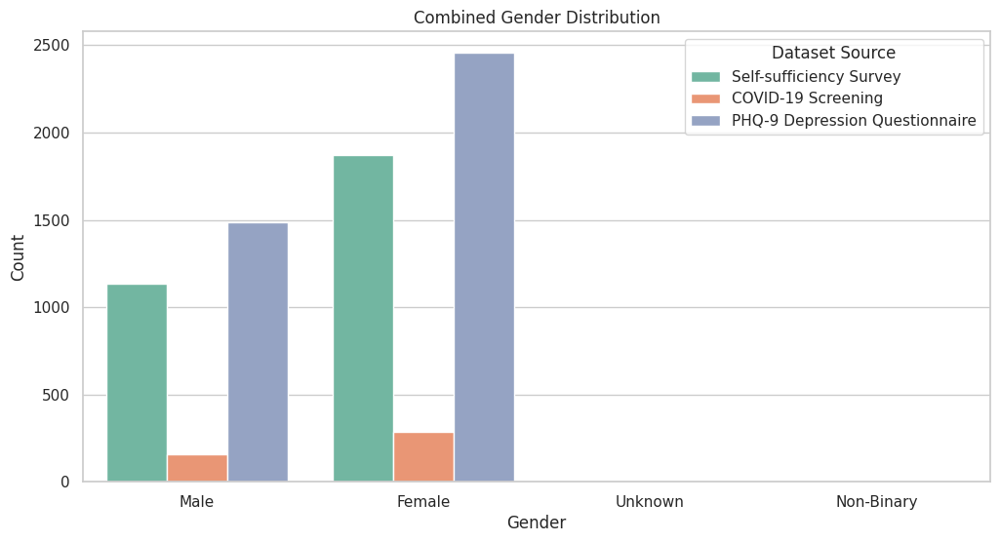

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Add a new column to each dataframe to identify the source
df['Source'] = 'Self-sufficiency Survey'
df2['Source'] = 'COVID-19 Screening'
df3['Source'] = 'PHQ-9 Depression Questionnaire'

# Combine the datasets
combined_df = pd.concat([df[['Gender', 'Source']], df2[['Gender', 'Source']], df3[['Gender', 'Source']]])

# Plotting the combined gender distribution with a different color palette
plt.figure(figsize=(12, 6))
sns.countplot(x='Gender', hue='Source', data=combined_df, palette='Set2')
plt.title('Combined Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='Dataset Source')
plt.show()


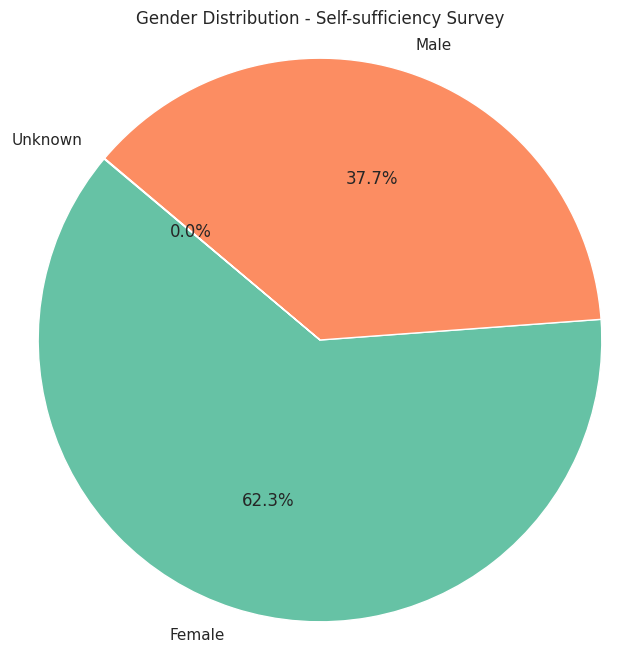

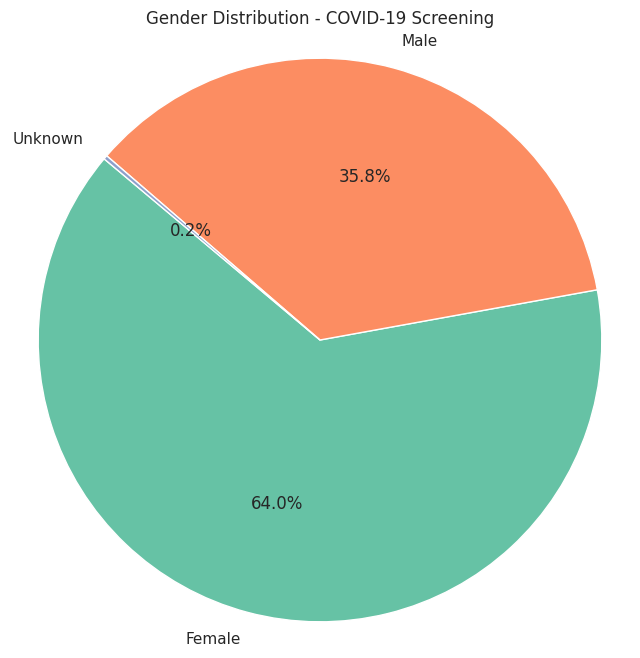

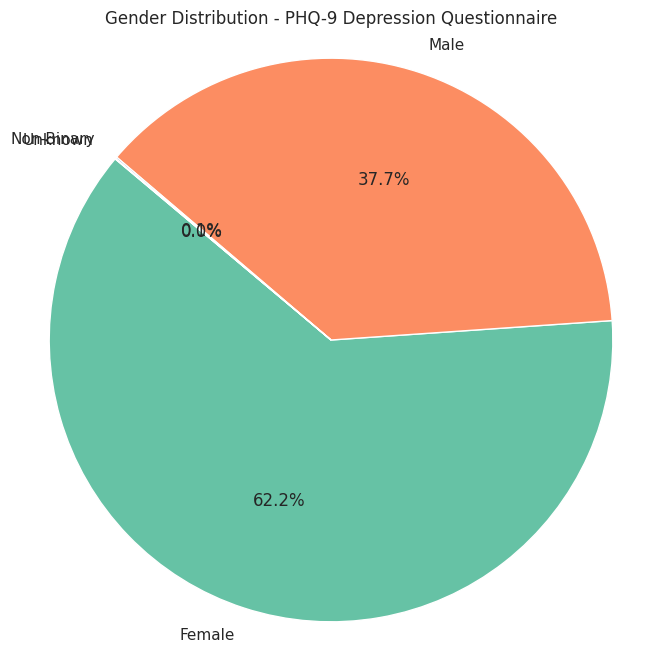

In [ ]:
import matplotlib.pyplot as plt

# Function to create pie chart for gender distribution
def create_pie_chart(data, column, title):
    gender_counts = data[column].value_counts()
    plt.figure(figsize=(8, 8))
    plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2'))
    plt.title(title)
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.show()

# Pie chart for gender distribution in Self-sufficiency Survey
create_pie_chart(df, 'Gender', 'Gender Distribution - Self-sufficiency Survey')

# Pie chart for gender distribution in COVID-19 Screening
create_pie_chart(df2, 'Gender', 'Gender Distribution - COVID-19 Screening')

# Pie chart for gender distribution in PHQ-9 Depression Questionnaire
create_pie_chart(df3, 'Gender', 'Gender Distribution - PHQ-9 Depression Questionnaire')


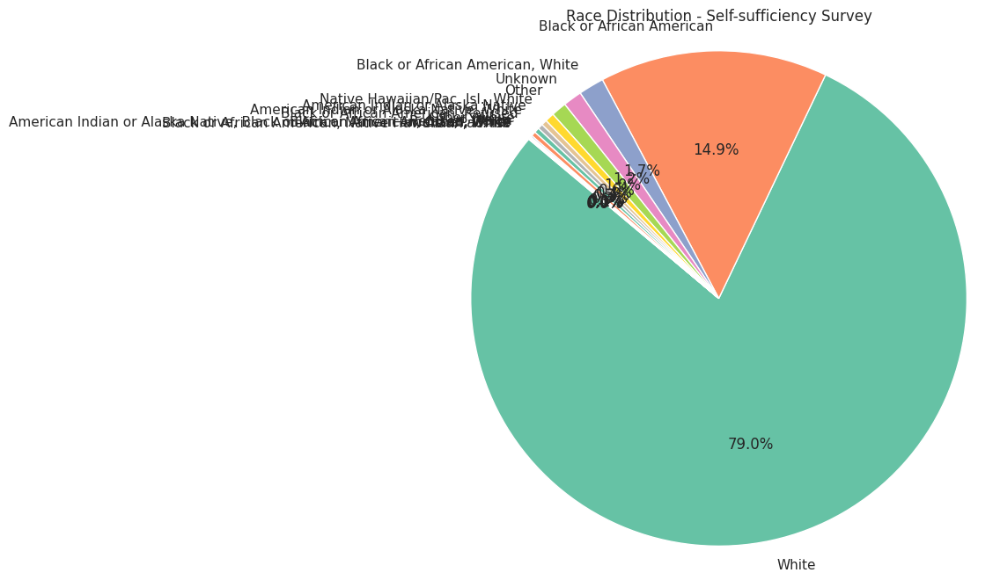

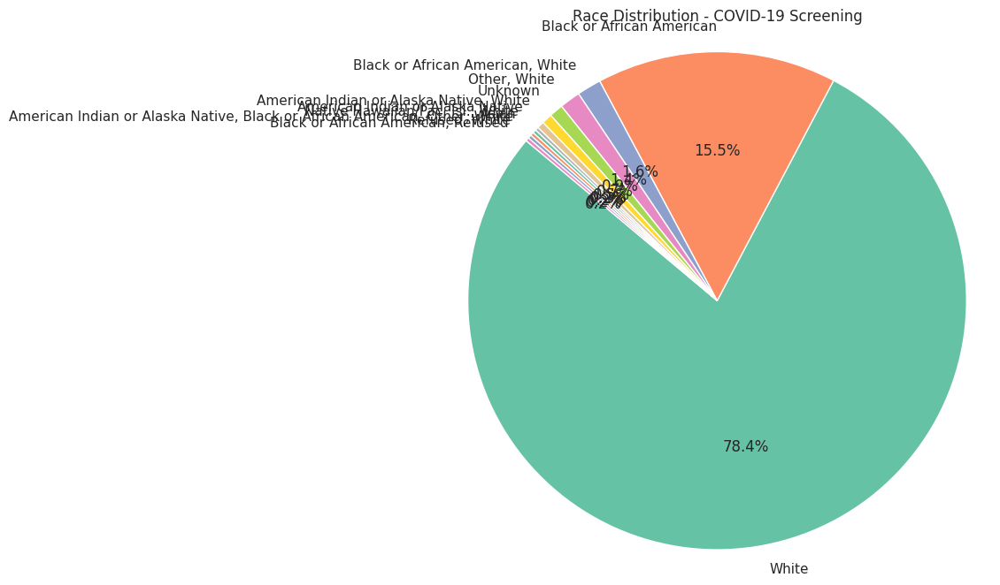

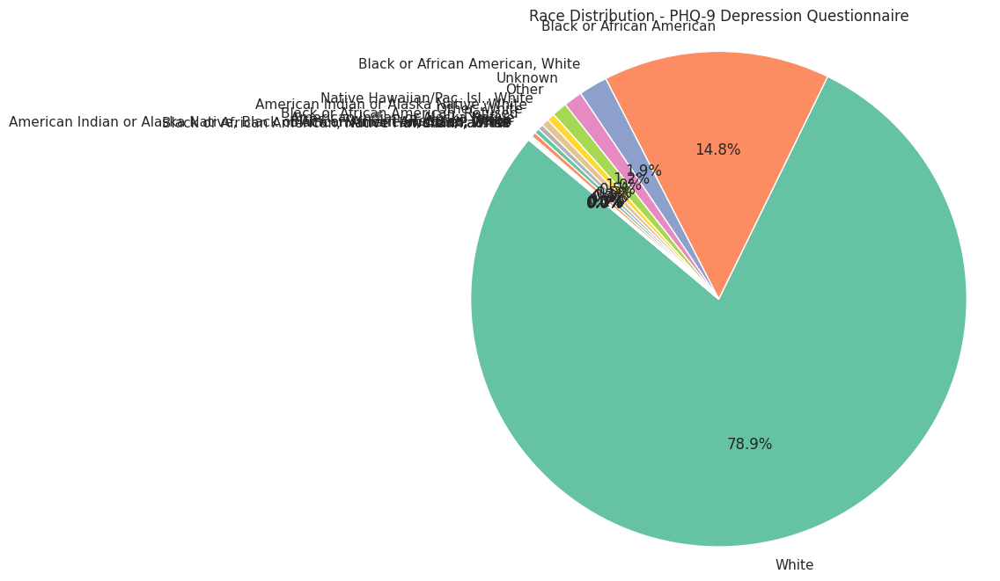

In [ ]:
# Pie chart for race distribution in Self-sufficiency Survey
create_pie_chart(df, 'Race', 'Race Distribution - Self-sufficiency Survey')

# Pie chart for race distribution in COVID-19 Screening
create_pie_chart(df2, 'Race', 'Race Distribution - COVID-19 Screening')

# Pie chart for race distribution in PHQ-9 Depression Questionnaire
create_pie_chart(df3, 'Race', 'Race Distribution - PHQ-9 Depression Questionnaire')


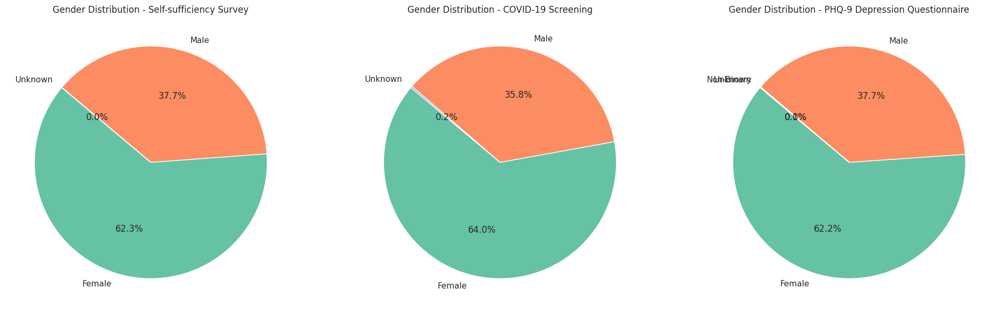

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(24, 8))

# Gender distribution in Self-sufficiency Survey
gender_counts1 = df['Gender'].value_counts()
axes[0].pie(gender_counts1, labels=gender_counts1.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2'))
axes[0].set_title('Gender Distribution - Self-sufficiency Survey')

# Gender distribution in COVID-19 Screening
gender_counts2 = df2['Gender'].value_counts()
axes[1].pie(gender_counts2, labels=gender_counts2.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2'))
axes[1].set_title('Gender Distribution - COVID-19 Screening')

# Gender distribution in PHQ-9 Depression Questionnaire
gender_counts3 = df3['Gender'].value_counts()
axes[2].pie(gender_counts3, labels=gender_counts3.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2'))
axes[2].set_title('Gender Distribution - PHQ-9 Depression Questionnaire')

plt.show()


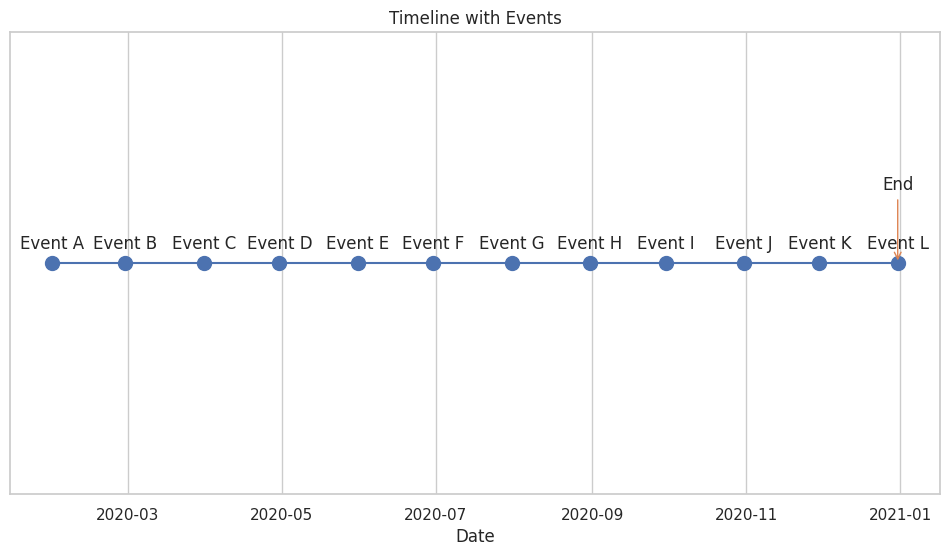

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Sample data
data = {
    'Date': pd.date_range(start='2020-01-01', periods=12, freq='M'),
    'Event': ['Event A', 'Event B', 'Event C', 'Event D', 'Event E', 'Event F', 'Event G', 'Event H', 'Event I', 'Event J', 'Event K', 'Event L']
}

# Create DataFrame
df = pd.DataFrame(data)

# Plotting the timeline
plt.figure(figsize=(12, 6))
plt.plot(df['Date'], [1]*len(df), 'o-', color='C0', markersize=10)

# Adding events
for i, txt in enumerate(df['Event']):
    plt.annotate(txt, (df['Date'][i], 1), textcoords="offset points", xytext=(0,10), ha='center')

# Adding the arrow at the end
plt.annotate('End', xy=(df['Date'].iloc[-1], 1), xytext=(0, 50),
             textcoords='offset points', ha='center', va='bottom',
             arrowprops=dict(arrowstyle="->", color='C1'))

plt.title('Timeline with Events')
plt.xlabel('Date')
plt.yticks([])  # Hide the y-axis
plt.grid(True)
plt.show()


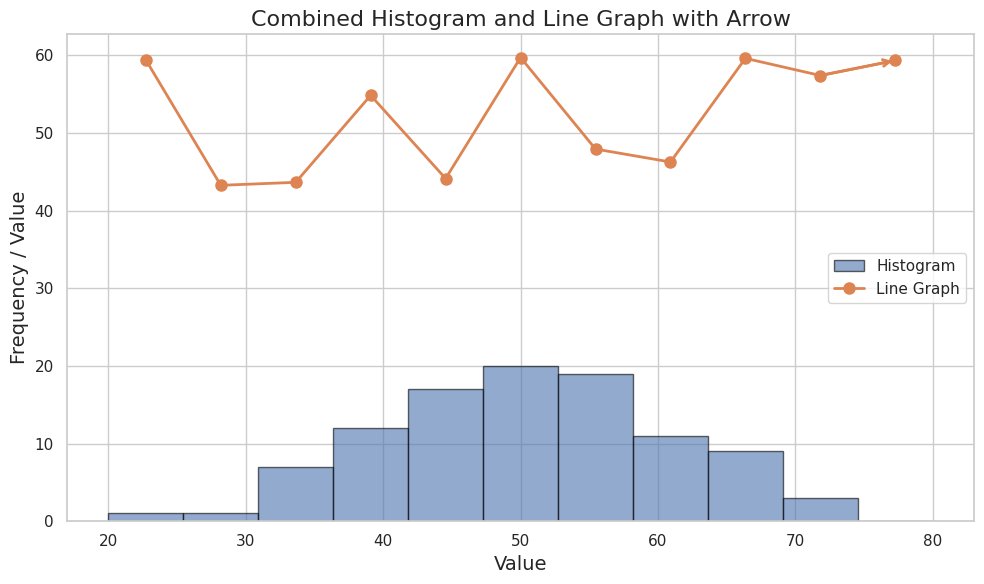

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data for histogram
np.random.seed(0)
hist_data = np.random.normal(loc=50, scale=10, size=100)

# Create bins for the histogram that will align with the x-axis of the line plot
bins = np.linspace(20, 80, 12)

# Sample data for line graph
line_data_x = bins[:-1] + np.diff(bins) / 2
line_data_y = np.random.normal(loc=50, scale=5, size=len(line_data_x))

# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the histogram
ax.hist(hist_data, bins=bins, color='C0', edgecolor='black', alpha=0.6, label='Histogram')

# Plotting the line graph on the same axis
ax.plot(line_data_x, line_data_y, color='C1', marker='o', linestyle='-', linewidth=2, markersize=8, label='Line Graph')

# Adding the arrow at the end of the line graph
ax.annotate('', xy=(line_data_x[-1], line_data_y[-1]), xytext=(line_data_x[-2], line_data_y[-2]),
            arrowprops=dict(arrowstyle="->", color='C1', lw=2))

# Adding labels and title
ax.set_title('Combined Histogram and Line Graph with Arrow', fontsize=16)
ax.set_xlabel('Value', fontsize=14)
ax.set_ylabel('Frequency / Value', fontsize=14)
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()
